In [7]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

from astropy import constants as cst
from astropy import units as u
import healpy as hp

from aqn import *
from constants import *
from survey_parameters import *
from skymap_plotting_functions import *
from aqn_simulation import *

In [5]:
# define AQN parameters
m_aqn_kg = 0.1*u.kg
R_aqn_cm = calc_R_AQN(m_aqn_kg)

print("using m_aqn =", m_aqn_kg)
# print("using R_aqn =", R_aqn_cm)

R_aqn_cm

using m_aqn = 0.1 kg


<Quantity 4.08583774e-05 cm>

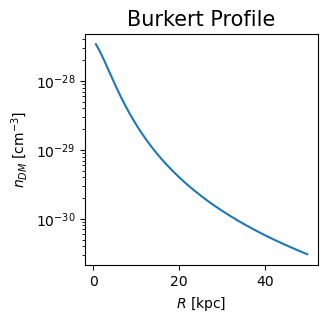

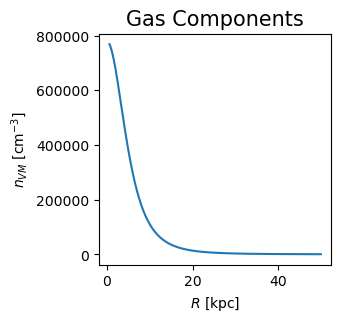

NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
[[2.27231905e-20 2.21379911e-20 2.21379911e-20 ... 2.21379911e-20
  2.21379911e-20 2.27231905e-20]
 [2.15479350e-20 2.05456845e-20 2.05456845e-20 ... 2.05456845e-20
  2.05456845e-20 2.15479350e-20]
 [1.96874342e-20 1.83782509e-20 1.83782509e-20 ... 1.83782509e-20
  1.83782509e-20 1.96874342e-20]
 ...
 [1.90608550e-27 1.81943304e-27 1.81943304e-27 ... 1.81943304e-27
  1.81943304e-27 1.90608550e-27]
 [1.75909949e-27 1.68070849e-27 1.68070849e-27 ... 1.68070849e-27
  1.68070849e-27 1.75909949e-27]
 [1.62609740e-27 1.55510230e-27 1.55510230e-27 ... 1.55510230e-27
  1.55510230e-27 1.62609740e-27]] mK / cm
[[2.27231905e-20 2.21379911e-20 2.21379911e-20 ... 2.21379911e-20
  2.21379911e-20 2.27231905e-20]
 [2.15479350e-20 2.05456845e-20 2.05456845e-20 ... 2.05456845e-20
  2.05456845e-20 2.15479350e-20]
 [1.96874342e-20 1.83782509e-20 1.83782509e-20 ... 1.83782509e-20
  1.83782509e-20 1.96874342e-20]
 ...
 [1.90608550e-27 1.81943304e-27 

In [3]:
F_tot_galex = simulate_signal(m_aqn_kg)

In [6]:
# F_tot_galex

In [7]:
# # import cubes and grid_coords
grid_coords = np.load("../data/FIRE/grid-coords.npy")
grid_ids = np.load("../data/FIRE/grid-ids---dark_mat.npy")

cubes = {}

cubes["dark_mat"] = np.load("../data/FIRE/cubes/cube-dark_mat_density.npy") * u.kg/u.m**3
cubes["ioni_gas"] = np.load("../data/FIRE/cubes/cube-ioni_gas_density.npy") * u.kg/u.m**3
cubes["neut_gas"] = np.load("../data/FIRE/cubes/cube-neut_gas_density.npy") * u.kg/u.m**3
cubes["temp"]     = np.load("../data/FIRE/cubes/cube-ioni_gas_temp.npy") * u.K
cubes["dv_ioni"]  = np.load("../data/FIRE/cubes/cube-dv_ioni.npy") * u.m/u.s
cubes["dv_neut"]  = np.load("../data/FIRE/cubes/cube-dv_neut.npy") * u.m/u.s

binned_cubes = {}
binned_parts = {}
errors = {}

# quant = "dark_mat"

# # compute distance from every grid centre to galactic centre
distances = np.sqrt(np.sum(grid_coords**2, axis=1)) * u.kpc

In [10]:
sun_mw_distance_kpc = 8*u.kpc

l_min = 0.6
l_max = 20
dl =0.5*u.kpc
NSIDE = 2**8
disp = True
ionized_gas = True

R_aqn_cm = calc_R_AQN(m_aqn_kg)

from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
r_vir_kpc = 233 * u.kpc

In [11]:
wavelength_band_resolution = 30
frequency_band_resolution = 1e9

print("NSIDE is", NSIDE)
NPIX = hp.nside2npix(NSIDE)
print("NPIX is", NPIX)
dOmega = hp.nside2pixarea(nside=NSIDE)
print("dOmega is", dOmega)
remove_low_lat = False

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))
low_lat_filter = (np.degrees(theta) > 73) & (np.degrees(theta) < 113)
high_lat_filter = (np.degrees(theta) < 73) | (np.degrees(theta) > 113)

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz

NSIDE is 256
NPIX is 786432
dOmega is 1.5978966540475428e-05


In [12]:
# define cube resolution parameters
cube_length       = 20   # kpc
voxel_resolution  = 2**9 # bins / kpc
print(f">> voxels per length: {voxel_resolution}")

voxel_length = cube_length / voxel_resolution * u.kpc
voxel_volume = voxel_length**3

print(f">> Area of 1 pixel is {voxel_length**2}, smallest area in the solid angle is {dOmega * np.max(l_array)**2}")

>> voxels per length: 512


NameError: name 'l_array' is not defined

In [13]:
voxel_length

<Quantity 0.0390625 kpc>

In [16]:
voxel_length

<Quantity 0.0390625 kpc>

In [6]:
# cube dimensions
cube_shape = np.shape(cubes["dark_mat"])
cube_x_max, cube_y_max, cube_z_max = cube_shape[0], cube_shape[1], cube_shape[2]
print(cube_x_max, "x", cube_y_max,"x", cube_z_max)

NameError: name 'cubes' is not defined

In [10]:
# l_array
np.sin(theta)

array([0.00159472, 0.00159472, 0.00159472, ..., 0.00159472, 0.00159472,
       0.00159472])

In [145]:
print(NSIDE)
print(2**8)
print(hp.nside2resol(nside=NSIDE, arcmin=True), "should be less than ~9 arcmin atan(1/370)")
print((np.arctan(1/(max(cube_shape)/2))*u.rad).to(u.arcmin))

256
256
13.741945647269624 should be less than ~9 arcmin atan(1/370)
13.428630022112285 arcmin


In [146]:
dl =  0.01 * u.kpc
# l_min, l_max = 0, cube_R_max
l_list = np.arange(l_min,l_max,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline
l_array = np.ones((len(l_list),len(theta))) * l_list

In [147]:
np.shape(l_array)

(1940, 786432)

In [148]:
# array of distance elements
# cube_R_max = np.max(distances)#round(np.sqrt((cube_x_max/2)**2 + (cube_z_max/2)**2))
# print(cube_R_max)

# dl =  0.1 * u.kpc
# # l_min, l_max = 0, cube_R_max
# l_list = np.arange(l_min,l_max,dl.value)[:, np.newaxis]

# # 2D array of distance elements along each sightline
# l_array = np.ones((len(l_list),len(theta))) * l_list
# # l_array[:,low_lat_filter] = 0

# (l,theta,phi) -> (x,y,z)
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
# print(x)
# x = np.round(x)
# y = np.round(y)
# z = np.round(z)
R = l_array
# print(x)
# x = np.array(x, dtype = np.int16)
# y = np.array(y, dtype = np.int16)
# z = np.array(z, dtype = np.int16)
# R = np.array(R, dtype = np.int16)

# xbounds = np.where(abs(x)<cube_x_max/2)
# ybounds = np.where(abs(y)<cube_y_max/2)
# zbounds = np.where(abs(z)<cube_z_max/2)

In [149]:
# for i in [x,y,z]: print(np.shape(i)[0])

In [150]:
# (x[0] - grid_coords[:,0])**2 #+ (y[i] - grid_coords[:,0])**2 + (z[i] - grid_coords[:,0])**2

In [151]:
# x[0]

In [50]:
np.shape(cubes["dark_mat"])

(512, 512, 512)

In [12]:
grid_coords[67134745]

array([-8.02734375,  0.01953125,  0.99609375])

In [13]:
[x[4,6],y[4,6],z[4,6]]

[-8.009763571407262, 0.023571346508611233, 0.9996744791666665]

In [85]:
tree_points.query(np.array([x[4,6],y[4,6],z[4,6]]))

(0.016328492235907405, 68444533)

In [152]:
from scipy.spatial import cKDTree


print(f">> generating cKDTree")
tree_points = cKDTree(grid_coords)
print(f">> started cKDTree query")
# grid_ids = tree_points.query(grid_c)[1]

# tree_points.query(l_array)

>> generating cKDTree
>> started cKDTree query


In [157]:
# x_new, y_new, z_new = np.zeros(np.shape(x)), np.zeros(np.shape(y)), np.zeros(np.shape(z))
cube_indexes = np.zeros(np.shape(x))

In [156]:
# for each distance element
for angle in range(np.shape(x)[1]):
    # print(angle, np.shape(x)[1])
    for i in range(np.shape(x)[0]):
        # print((x[i, theta] - grid_coords[:,0])**2 + (y[i, theta] - grid_coords[:,0])**2 + (z[i, theta] - grid_coords[:,0])**2)
        cube_indexes[i,angle] = tree_points.query(np.array([x[i,angle],y[i,angle],z[i,angle]]))[1]

KeyboardInterrupt: 

In [162]:
np.shape(x)[0]

1940

In [8]:
# for each distance element
# for angle in range(np.shape(x)[1]):
    # print(angle, np.shape(x)[1])
for i in range(np.shape(x)[0]):
    # print((x[i, theta] - grid_coords[:,0])**2 + (y[i, theta] - grid_coords[:,0])**2 + (z[i, theta] - grid_coords[:,0])**2)
    cube_indexes[i,:] = tree_points.query(np.array([x[i,:],y[i,:],z[i,:]]).T)[1]
    print(i)

In [164]:
cube_indexes = np.array(np.round(cube_indexes), dtype = np.int32)

In [165]:
np.save("../data/skymap_integration_cube_indexes.npy", cube_indexes)

In [1]:
np.load("../data/skymap_integration_cube_indexes.npy", cube_indexes)

NameError: name 'np' is not defined

In [102]:
np.sum(np.array(np.round(cube_indexes), dtype = np.int32))

16472279930597

In [101]:
np.round(cube_indexes[1][1])

67134760.0

In [115]:
cst.m_p.si

<<class 'astropy.constants.codata2018.CODATA2018'> name='Proton mass' value=1.67262192369e-27 uncertainty=5.1e-37 unit='kg' reference='CODATA 2018'>

In [166]:
# calculate AQN number density
# n_aqn_cm3 = n_halo(R_array)
n_aqn_cm3 = (cubes["dark_mat"].reshape(512**3) /   m_aqn_kg).to(1/u.cm**3)[cube_indexes]
n_cold    = (cubes["neut_gas"].reshape(512**3) / cst.m_p.si).to(1/u.cm**3)[cube_indexes]
n_hot     = (cubes["ioni_gas"].reshape(512**3) / cst.m_p.si).to(1/u.cm**3)[cube_indexes]
T_hot     = (cubes["temp"].reshape(512**3))[cube_indexes] * K_to_eV

In [118]:
T_hot

<Quantity [[  35806.35578889,   35806.35578889,   35806.35578889, ...,
             918938.9322369 ,   47733.65816511,   47733.65816511],
           [  31890.54447455,   31890.54447455,   31890.54447455, ...,
              47548.68811299,   47548.68811299,   47548.68811299],
           [ 514281.78440368,  514281.78440368,  514281.78440368, ...,
            5263060.43277889, 2840536.43790011, 2840536.43790011],
           ...,
           [2755108.82832404, 3117645.44753834, 2556361.1237588 , ...,
              32986.1018187 ,   32986.1018187 ,   54918.97354466],
           [2755108.82832404, 3117645.44753834, 2556361.1237588 , ...,
              32986.1018187 ,   32986.1018187 ,   54918.97354466],
           [2755108.82832404, 3117645.44753834, 2556361.1237588 , ...,
             483818.98688364,   32986.1018187 ,   54918.97354466]] K>

In [ ]:
h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array

# calculate mass densities of each gas component
# n_cold     = n_gas_component(R_array, "cold") 

# n_hot      = n_gas_component(R_array, "hot")
# T_hot      = 1e6 * u.K * K_to_eV



spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)

def spectral_surface_emissivity(T, frequency_band):
    res = np.zeros(np.shape(T)) * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
    res[T<0] = -1 * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
    f = frequency_band[0] # ?????
    T = T * eV_to_erg
    for i in range(len(frequency_band)):
        w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
        res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                    T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                   (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                   (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
        res_new = convert_to_skymap_units(res_new, frequency_band[i]).to(u.mK, equivalencies = u.brightness_temperature(frequency_band[i]))
        res[T>0] += res_new #* conversion_array[i] 
    return res 


def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
    T_AQN = T_AQN_analytical(n_cold, Dv, f, g)
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    return dFdw 

def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return dFdw

def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN

def func(n_c,n_h, frequency_band):
    #print(spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band).unit)
    epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,     R_aqn_cm, frequency_band))* \
        4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
    print(epsilon)
    return epsilon #.value

F_tot_galex = sum(func(n_cold,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

T_aqn_cold_ev     = T_AQN_analytical(n_cold, Dv, f, g)
# T_aqn_warm_ev     = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
# T_aqn_warm_hot_ev = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
T_aqn_hot_ev      = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)

# T_aqn_dict_ev = {"cold":     T_aqn_cold_ev, 
#                  # "warm":     T_aqn_warm_ev,
#                  # "warm_hot": T_aqn_warm_hot_ev,
#                  "hot":      T_aqn_hot_ev}

# spectral_spatial_emissivity = func(n_cold,n_hot, frequency_band)
#print(np.shape(func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)))
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Constant VM density", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6)
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Gas Components", 0.6,50, dl = 0.5 * u.kpc)
#create_skymap(F_tot_erg_hz_cm2)
print("done")

In [173]:
np.max(T_aqn_hot_ev)

<Quantity 71.7882762 eV>

In [4]:
F_tot_galex

<Quantity [0.01802005, 0.01636066, 0.01636066, ..., 0.01636066, 0.01636066,
           0.01802005] mK>

In [127]:
np.shape(spectral_spatial_emissivity)

(20, 12288)

In [132]:
# create_skymap2(F_tot_galex, F_tot_galex.unit, False)

np.min(F_tot_galex)

<Quantity 15431.85165215 mK>

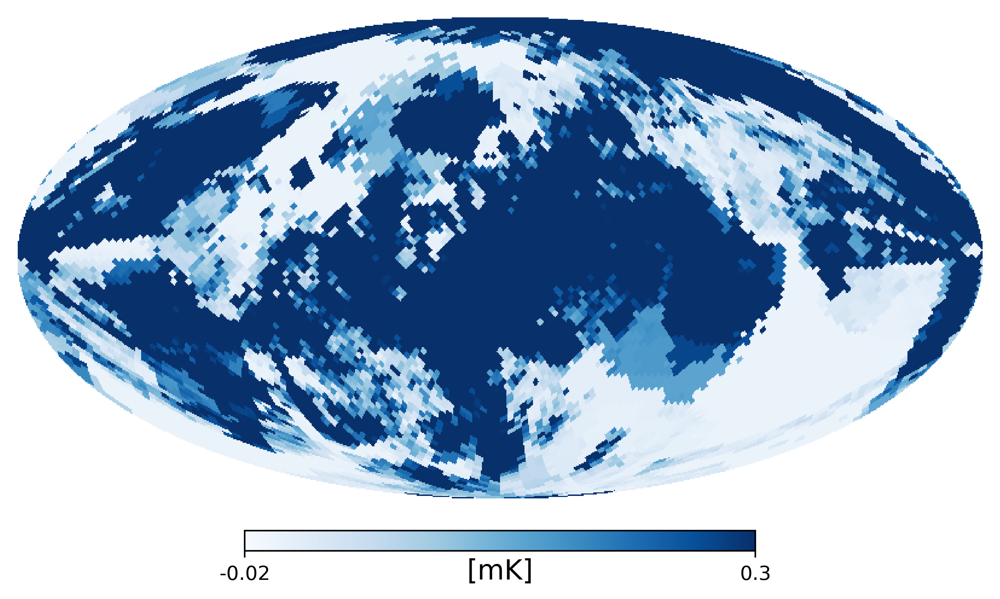

In [129]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
#wmaphaze[np.where(wmaphaze==0)] = -1000
# plot_wmaphaze = wmaphaze.copy()
# plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(F_tot_galex, 
            title="", 
            rot=(0,0,0),
            cmap='Blues', 
            fig=f1, 
            unit="[mK]",
            min=-0.02,
            max=0.3
           )
# plt.savefig("plots/MCMC-results/25k-april1/WMAP Haze Skymap.svg")



fontsize = 24
matplotlib.rcParams.update({'font.size':fontsize})

save_name = "wmap-skymap-simulated"
plt.savefig(save_name+".png", bbox_inches='tight')
plt.savefig(save_name+".svg", bbox_inches='tight')

plt.show()

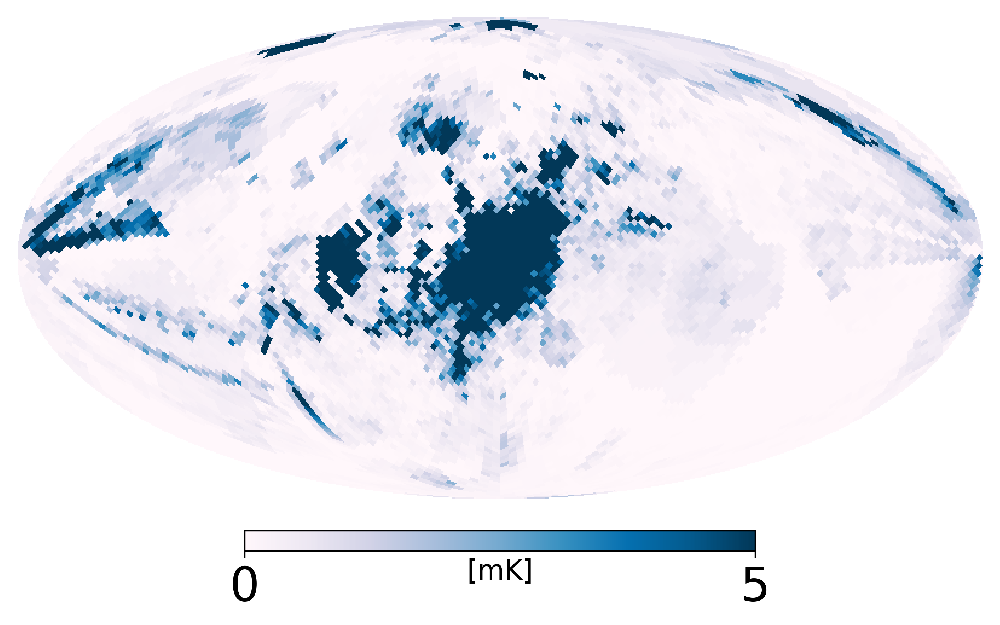

In [137]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
#wmaphaze[np.where(wmaphaze==0)] = -1000
# plot_wmaphaze = wmaphaze.copy()
# plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(F_tot_galex, 
            title="", 
            rot=(0,0,0),
            cmap='PuBu', 
            fig=f1, 
            unit="[mK]",
            min=0,
            max=5
           )
# plt.savefig("plots/MCMC-results/25k-april1/WMAP Haze Skymap.svg")



fontsize = 24
matplotlib.rcParams.update({'font.size':fontsize})

save_name = "wmap-skymap-simulated"
plt.savefig(save_name+".png", bbox_inches='tight')
plt.savefig(save_name+".svg", bbox_inches='tight')

plt.show()

In [5]:
# obtain the pixels of the skymap that need to be used in the simplified MCMC analysis.

# test_signal = F_tot_galex.copy()
# test_signal = wmaphaze.copy() * u.mK

N = 2**9

vec = hp.ang2vec(np.pi/2, 0)
min_angle = 3
max_angle = 37

angles = np.arange(3,38,1)
num_angles = len(angles)

# angular_dist_band = hp.query_strip(N,np.pi/2-2*hp.nside2resol(N), np.pi/2+2*hp.nside2resol(N), inclusive=False)



# angular_dist_band = np.unique(np.concatenate(
#     (hp.ang2pix(N, [np.pi/2+2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2+hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)))))

# for N=2**7, 2**8
lower_bound = -np.radians(min_angle)
upper_bound = -np.radians(max_angle)
angular_dist_band = np.unique(np.concatenate(
    (hp.ang2pix(N, [np.pi/2+2*hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2-2*hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2-hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2+hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2]*10000, np.linspace(lower_bound,upper_bound,10000)))))


     # hp.ang2pix(N, [np.pi/2+3*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
     # hp.ang2pix(N, [np.pi/2-3*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000))

# test_signal[angular_dist_band]= np.nan
# f1 = plt.figure(dpi=400)
# hp.mollview(test_signal.value, 
#                     title="", 
#                     rot=(0,0,0),
#                     fig=f1,
#                     cmap='PuBu', 
#                     unit="")
### plt.savefig("plots/selected-pixel-band.png")
# plt.show()


strip_pixel_refs = {}
strip_index_refs = {}

for i in range(num_angles):
    radius_inner = np.radians(angles[i])
    radius_outer = np.radians(angles[i] + 1)

    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)

    strip_pixel_ref = np.intersect1d(pix_ring, angular_dist_band)
    # print(len(strip_pixel_ref))

    # plotter_signal = test_signal.copy()
    # plotter_signal[strip_pixel_ref] = np.nan

    # strip_pixel_refs stores the hp indecies of the filtered pixels,
    # strip_index_refs stores the angular_dist_band indecies of the filtered pixels
    strip_pixel_refs[angles[i]] = strip_pixel_ref
    strip_index_refs[angles[i]] = [j for j in range(len(angular_dist_band)) if angular_dist_band[j] in strip_pixel_ref]
    # f1 = plt.figure(dpi=100)
    # hp.mollview(plotter_signal.value, 
    #                     title="FUV Emissions from AQN Annihilation", 
    #                     rot=(0,0,0),
    #                     fig=f1, 
    #                     unit="")
    # plt.show()

In [47]:
# strip_pixel_refs stores the hp indecies of the filtered pixels,
# strip_index_refs stores the angular_dist_band indecies of the filtered pixels
L = 0
for j in range(num_angles):
    print(len(strip_pixel_refs[angles[j]]))
    L += len(strip_pixel_refs[angles[j]])
L

50
49
54
50
52
51
50
54
49
50
54
49
54
50
49
54
50
49
54
50
54
49
50
54
49
50
54
49
54
50
49
54
50
49
5


1742

In [7]:
sun_mw_distance_kpc = 8*u.kpc

dm_model = "Burkert Profile"
vm_model = "Gas Components"
l_min = 0.6
l_max = 50
dl =0.5*u.kpc
NSIDE = 2**9
ionized_gas = True

T_warm     = (3e4 + 1e5)/2 * u.K * K_to_eV

T_warm_hot = (1e5 + 1e6)/2 * u.K * K_to_eV

T_hot      = 1e6 * u.K * K_to_eV


spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)

from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
r_vir_kpc = 233 * u.kpc

# some resolution parameters
print("NSIDE is", NSIDE)
#NSIDE = 2**6
wavelength_band_resolution = 30
#frequency_band_resolution = 0.5e14

frequency_band_resolution = 1e9


NPIX = hp.nside2npix(NSIDE)
print("NPIX is", NPIX)
dOmega = hp.nside2pixarea(nside=NSIDE)
print("dOmega is", dOmega)

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))

# !!! only look at one band
theta = theta[angular_dist_band]
phi = phi[angular_dist_band]

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz


# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline, sun-centric
l_array = np.ones((len(l_list),len(theta))) * l_list

# 2D array of distance elements along each sightline, galaxy-centric
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
R_array = np.sqrt(x**2 + y**2 + z**2)

def spectral_surface_emissivity(T, frequency_band):
    res = np.zeros(np.shape(T)) * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
    res[T<0] = -1 * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
    f = frequency_band[0]
    T = T * eV_to_erg
    for i in range(len(frequency_band)):
        w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
        res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                    T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                   (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                   (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
        res_new = convert_to_skymap_units(res_new, frequency_band[i]).to(u.mK, equivalencies = u.brightness_temperature(frequency_band[i]))
        res[T>0] += res_new #* conversion_array[i] 
    return res 


def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
    T_AQN = T_AQN_analytical(n_bar, Dv, f, g)
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    return dFdw 

def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return dFdw

def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN

def func(n_aqn_cm3, R_aqn_cm, n_c, n_w, n_wh,n_h, frequency_band):
    #print(spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band).unit)
    epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_w,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_wh, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band))* \
        4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
    return epsilon #.value

h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array


[a1_c, b1_c, c1_c, 
 a2_c, b2_c, c2_c, 
 a3_c, b3_c, c3_c, 
 a4_c, b4_c, c4_c, 
 a5_c, b5_c, c5_c, 
 a6_c, b6_c, c6_c] = [30.04649796,  0.4079755,  3.77607598,  
              1e3,3e-1,15,
             2.6e4,5e-2,3,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_w, b1_w, c1_w, 
 a2_w, b2_w, c2_w, 
 a3_w, b3_w, c3_w, 
 a4_w, b4_w, c4_w, 
 a5_w, b5_w, c5_w, 
 a6_w, b6_w, c6_w] = [1.1e0,1e-1,0.22,
              1.7e1,12e-1,110,
              0.575e4,8.2e-2,13.7,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_wh, b1_wh, c1_wh, 
 a2_wh, b2_wh, c2_wh, 
 a3_wh, b3_wh, c3_wh, 
 a4_wh, b4_wh, c4_wh, 
 a5_wh, b5_wh, c5_wh, 
 a6_wh, b6_wh, c6_wh] = [6.1e1,4.4e-1,1.8,
              9e2,9.2e-2,2.8,
              1.5e4,7e-2,9,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_h, b1_h, c1_h, 
 a2_h, b2_h, c2_h, 
 a3_h, b3_h, c3_h, 
 a4_h, b4_h, c4_h, 
 a5_h, b5_h, c5_h, 
 a6_h, b6_h, c6_h] = [2e2,4e-1,9.5,
              1e4,10e-2,6,
              2.6e4,3e-2,3.1,
              0,0,0,
              0,0,0,
              0,0,0,]


def rho_gas_component(R_kpc,gas_component):
    x = (R_kpc/r_vir_kpc).value
    if gas_component == "cold":
        return  (a1_c / (1+(x/b1_c)**2)**c1_c + \
                 a2_c / (1+(x/b2_c)**2)**c2_c + \
                 a3_c / (1+(x/b3_c)**2)**c3_c) * rho_crit_z05_si
    if gas_component == "warm":
        return  (a1_w / (1+(x/b1_w)**2)**c1_w + \
                 a2_w / (1+(x/b2_w)**2)**c2_w + \
                 a3_w / (1+(x/b3_w)**2)**c3_w) * rho_crit_z05_si
    if gas_component == "warm-hot":
        return  (a1_wh / (1+(x/b1_wh)**2)**c1_wh + \
                 a2_wh / (1+(x/b2_wh)**2)**c2_wh + \
                 a3_wh / (1+(x/b3_wh)**2)**c3_wh) * rho_crit_z05_si 
    if gas_component == "hot":
        return  (a1_h / (1+(x/b1_h)**2)**c1_h + \
                 a2_h / (1+(x/b2_h)**2)**c2_h + \
                 a3_h / (1+(x/b3_h)**2)**c3_h) * rho_crit_z05_si 

def n_gas_component(R_none, gas_component):
    return rho_gas_component(R_none*u.kpc, gas_component) / cst.m_p.si


def rho_gas(R_none):
    return rho_gas_component(R_none,"cold") + rho_gas_component(R_none,"warm") + rho_gas_component(R_none,"warm-hot") + rho_gas_component(R_none,"hot")

def n_vm(R_none):
    return rho_gas(R_none) / cst.m_p.si

# ########### NFW Profile #############################################
if dm_model == "NFW Profile":
    rho_0h = 0.0106 * u.solMass / u.pc**3
    r_h = 19.0 * u.kpc

    def rho_halo(R_kpc):
        return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# #####################################################################

# # ########### constant density #########################################
if dm_model == "Constant DM density":
    n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
    def n_halo(R_none):
        return np.ones(np.shape(R_none)) * n_aqn_const_cm3
# # ######################################################################

# ########### Burkert Profile #########################################
# if dm_model == "Burkert Profile":
#     vh = 414 * u.km / u.s
#     r0 = 7.8 * u.kpc
#     rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

#     def rho_halo(R_kpc):
#         return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

#     def n_halo(R_none):
#         return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# ######################################################################

########### Burkert Profile #########################################
if dm_model == "Burkert Profile":
    # vh = 414# * u.km / u.s
    # r0 = 7.8# * u.kpc

    def rho_halo(vh, r0, R_kpc):
        rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)
        return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

    def n_halo(m_aqn_kg, vh, r0, R_none):
        return (rho_halo(vh*u.km/u.s, r0*u.kpc, R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
######################################################################


############# constant density ######################################### 
if vm_model == "Constant VM density":
    n_cold_cm3 = 1.0e-1 * u.cm**-3
    def n_vm(R_none):
        return np.ones(np.shape(R_none)) * n_cold_cm3
########################################################################


def simulate_signal(m_aqn_kg, vh, r0):

    R_aqn_cm = calc_R_AQN(m_aqn_kg)
    
    # calculate AQN number density
    n_aqn_cm3 = n_halo(m_aqn_kg, vh, r0, R_array)

    # calculate mass densities of each gas component
    n_cold     = n_gas_component(R_array, "cold") 

    n_warm     = n_gas_component(R_array, "warm") # avoid setting variables

    n_warm_hot = n_gas_component(R_array, "warm-hot")

    n_hot      = n_gas_component(R_array, "hot")


    F_tot_galex = sum(func(n_aqn_cm3, R_aqn_cm, n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

    #print("done")

    return F_tot_galex

NSIDE is 512
NPIX is 3145728
dOmega is 3.994741635118857e-06


In [6]:
vh = 414 #* u.km / u.s
r0 = 7.8 #* u.kpc
r0 = 4.75
# rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)
# r0


In [149]:
g = 0.1

In [8]:
F_tot_band = simulate_signal(m_aqn_kg, vh, r0)


In [44]:
len(F_tot_band)

1746

In [9]:
angular_flux_aqn = np.zeros(num_angles)
for i in range(num_angles):
    F_selected_pixels = F_tot_band[strip_index_refs[angles[i]]]
    angular_flux_aqn[i] = np.average(F_selected_pixels.value)


In [10]:
N = 2**5

angular_flux_aqn_skymap = np.zeros(num_angles)

for i in range(num_angles):
    radius_inner = np.radians(angles[i])
    radius_outer = np.radians(angles[i] + 1)

    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)

    angular_flux_aqn_skymap[i] = np.average(F_tot_galex[pix_ring]).value

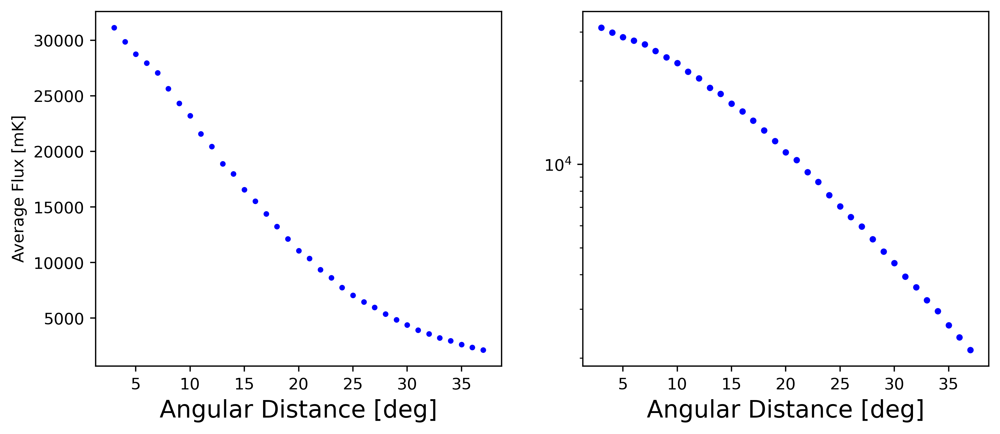

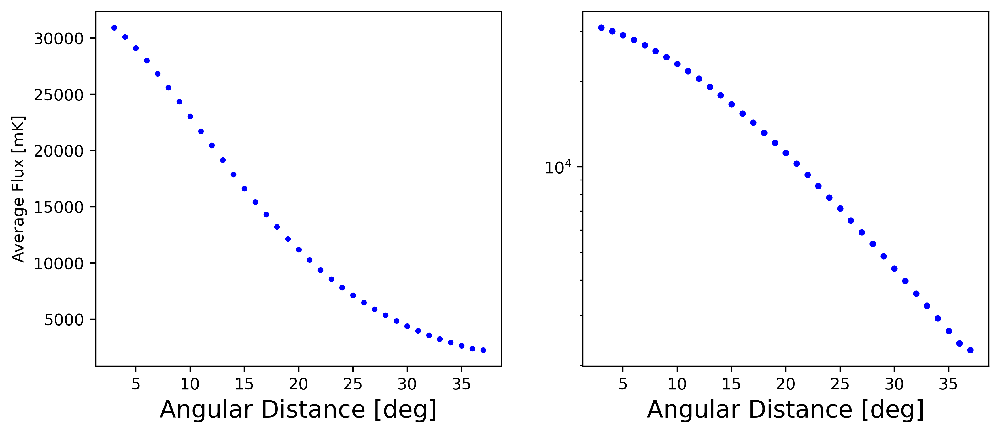

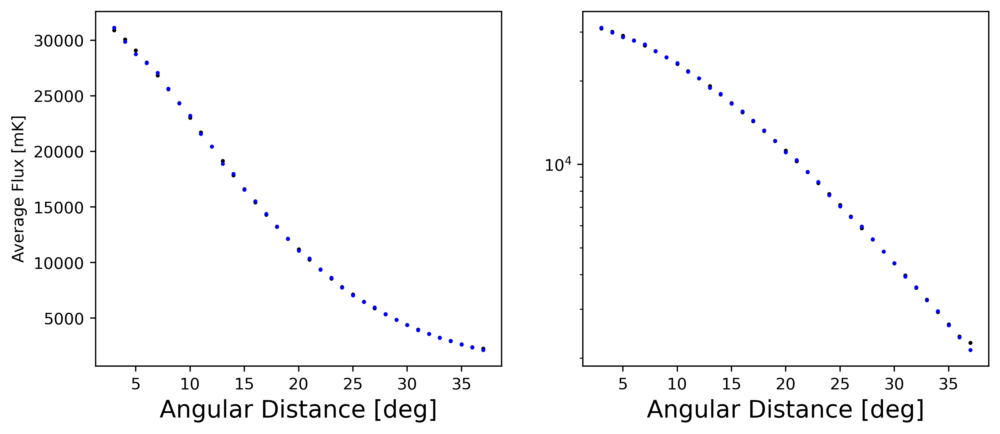

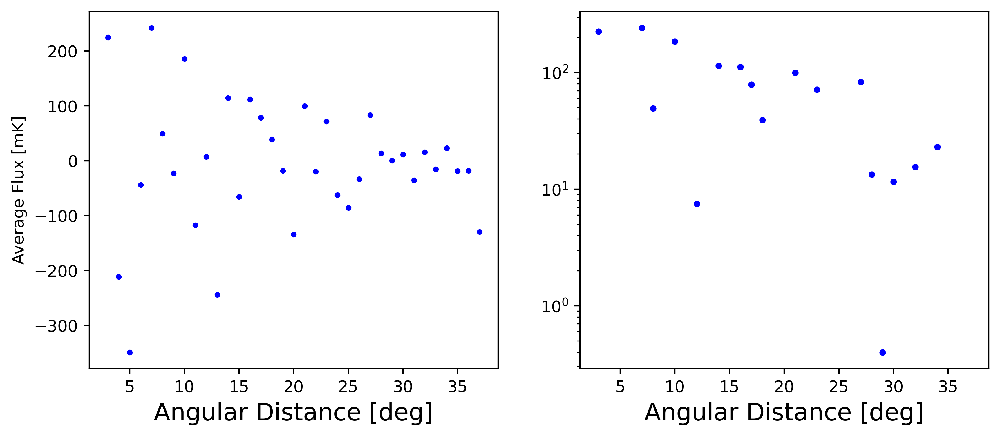

In [18]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn_skymap, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn_skymap, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_first.svg")
plt.savefig("plots/skymap_first.png")
plt.show()


# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/filter_first.svg")
plt.savefig("plots/filter_first.png")
plt.show()


# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn, marker=".", markersize=3, linestyle = 'none',color='black')
ax1.plot(angles,angular_flux_aqn_skymap, marker=".", markersize=3, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn, '.', color='black', markersize=3)
ax2.plot(angles,angular_flux_aqn_skymap, '.', color='blue', markersize=3)
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_vs_filter.svg")
plt.savefig("plots/skymap_vs_filter.png")
plt.show()



# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn_skymap-angular_flux_aqn, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn_skymap-angular_flux_aqn, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_minus_filter.svg")
plt.savefig("plots/skymap_minus_filter.png")
plt.show()

<ErrorbarContainer object of 3 artists>

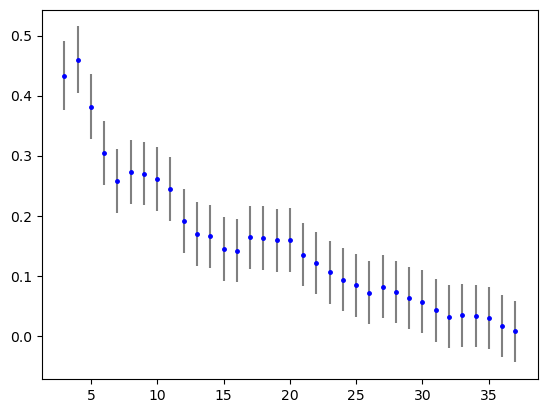

In [42]:
# Importing WMAP Haze data
# .fits file taken from https://faun.rc.fas.harvard.edu/dfink/skymaps/haze/table/
location = "/data4/msekatchev/wmaphaze/"
location = "WMAP/"
filename = "wmap_k_ffhaze_yr1.fits"
wmaphaze = hp.read_map(location + filename)


N = 2**9
# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)
min_angle = 3
max_angle = 91

angles_prelim = np.arange(3,91,1)
num_angles_prelim = len(angles_prelim)

angular_flux_wmap = np.zeros(num_angles_prelim)
angular_flux_wmap_error = np.zeros(num_angles_prelim)


for i in range(num_angles_prelim):
    radius_inner = np.radians(angles_prelim[i])
    radius_outer = np.radians(angles_prelim[i] + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    unfiltered_signal = wmaphaze[pix_ring]
    filtered_signal = unfiltered_signal[unfiltered_signal != 0]
    
    
    angular_flux_wmap[i] = np.average(filtered_signal)
    # print("i=",i,"\tangle:",angles[i],"\t",angular_flux_wmap[i])
    n_pixels = len(filtered_signal)
    angular_flux_wmap_error[i] = np.std(filtered_signal) / np.sqrt(n_pixels)

cov_matrix = np.zeros([num_angles,num_angles])

for i in range(num_angles):
    cov_matrix[i,i] = angular_flux_wmap_error[i]**2
cov_matrix


error_threshold_filter = 35

shifted_error = np.average(angular_flux_wmap[error_threshold_filter:])
shifted_error


angular_flux_wmap = angular_flux_wmap[:error_threshold_filter] - shifted_error
angular_flux_wmap_error = angular_flux_wmap_error[:error_threshold_filter] + shifted_error

plt.errorbar(angles,
             angular_flux_wmap, 
             yerr=angular_flux_wmap_error, 
             marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

In [12]:
radius_inner = np.radians(angles_prelim[i])
radius_outer = np.radians(angles_prelim[i] + 1)

pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

pix_ring = np.setdiff1d(pix_outer, pix_inner)

unfiltered_signal = wmaphaze[pix_ring]
filtered_signal = unfiltered_signal[unfiltered_signal != 0]


angular_flux_wmap[i] = np.average(filtered_signal)
# print("i=",i,"\tangle:",angles[i],"\t",angular_flux_wmap[i])
n_pixels = len(filtered_signal)
angular_flux_wmap_error[i] = np.std(filtered_signal) / np.sqrt(n_pixels)

In [30]:
np.sqrt(np.sum((filtered_signal - np.average(filtered_signal))**2)) / (len(filtered_signal))

0.0004766442019902714

In [16]:
# N = 2**5

# angular_flux_aqn = np.zeros(num_angles)

# for i in range(num_angles):
#     radius_inner = np.radians(angles[i])
#     radius_outer = np.radians(angles[i] + 1)
    
#     pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
#     pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

#     pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
#     angular_flux_aqn[i] = np.average(F_tot_galex[pix_ring]).value
    
# #     if (angles[i]+1) % 10 == 0:
# #         f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
# #         plot_with_ring = F_tot_galex.value.copy()
# #         plot_with_ring[pix_ring] = np.nan
# #         hp.mollview(plot_with_ring , 
# #                     title=str(angles[i]+1) + " deg", 
# #                     rot=(0,0,0), 
# #                     fig=f1, 
# #                     unit="")
# #         plt.show()

# # # Create a figure with two subplots side by side
# # fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# # # Plot the data on the left subplot
# # ax1.plot(angles,angular_flux_aqn, '.', color='blue')
# # ax1.set_xlabel('Angular Distance [deg]', size=15)
# # ax1.set_ylabel('Average Flux [mK]', size=15)

# # # Plot the data on the right subplot with a log scale on the y-axis
# # ax2.plot(angles,angular_flux_aqn, '.', color='blue')
# # ax2.set_xlabel('Angular Distance [deg]', size=15)
# # ax2.set_yscale('log')

# # # Show the plot
# # plt.show()
        


In [14]:
import numpy as np
import emcee
import sys
# parallel computation with multiple cpus, remove that if you don't need it
from multiprocessing import Pool,cpu_count

# following are functions I used, remove them if you don't want to install anything
import pyccl as ccl

# plotting functions
# # %matplotlib inline
# # %config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from getdist import plots, MCSamples; import getdist # one triangle plotter
import corner # another triangle plotter

# hereby is the observation vector I need to read, please switch this to your observations
vec = angular_flux_wmap
observation = angular_flux_wmap
cov_mat = cov_matrix
inv_cov = np.linalg.inv(cov_mat) # my inverse covariance matrix

# define your parameter names, default values, and posterior names here, these are currently mine
parameter_names = ['$m$', '$v_h$', "r_0"]
values_ori = [0.01, 414, 7.8] # ???????

# def theory_function(theory_parameters):
#     m, vh, r0 = theory_parameters
    
#     F_tot_galex = simulate_signal(m * u.kg, vh, r0)
    
#     N = 2**5

#     angular_flux_aqn = np.zeros(num_angles)

#     for i in range(num_angles):
#         radius_inner = np.radians(angles[i])
#         radius_outer = np.radians(angles[i] + 1)

#         pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
#         pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

#         pix_ring = np.setdiff1d(pix_outer, pix_inner)

#         angular_flux_aqn[i] = np.average(F_tot_galex[pix_ring]).value
    
#     return angular_flux_aqn

print("hello")
def theory_function(theory_parameters):
    m, vh, r0 = theory_parameters
    
    F_tot_band = simulate_signal(m * u.kg, vh, r0)

    angular_flux_aqn = np.zeros(num_angles)

    for i in range(num_angles):
        F_selected_pixels = F_tot_band[strip_index_refs[angles[i]]]
        angular_flux_aqn[i] = np.average(F_selected_pixels.value)
    
    return angular_flux_aqn


def prior(theory_parameters):
    # prior of my example function, as a flat prior, you can switch it to another likelihood for gaussian prior
    m, vh, r0 = theory_parameters
    #print(m,"\n")
    if m <= 0:
        return -np.inf
    
    logm = np.log10(m)
    prior = 0
    #print("m=", m, "\t log(m)=", logm, "\n")
    if logm < -3 or logm > 3: # we don't want parameters exceed that range
        prior += -np.inf
    return prior

def mcmc_emcee(theory_parameters):
    # don't change this part
    prior_value = prior(theory_parameters)
    if np.isinf(prior_value) == False:
        theory = theory_function(theory_parameters)
        difference = theory - observation
        lgprob = -0.5*float(difference @ inv_cov @ difference) + prior_value
    else:
        lgprob = -np.inf
    return lgprob

initial_guess = [0.01, 414, 7.8]
# my initial guess of the parameter space

nwalkers = 2*len(initial_guess) # number of mcmc walkers, need to be bigger than 2*parameter dimensions
nsteps = 100 # iteration numbers, you can adjust this to find a precision-speed balance, emcee don't automatically converge...
ndim = len(initial_guess) # number of parameters
starting_pts = [initial_guess + 1e-2*np.random.randn(ndim) for i in range(nwalkers)] # initial points for each walkers
with Pool() as pool: # parallelization, remove this if you only want 1 cpu
    sampler = emcee.EnsembleSampler(nwalkers,ndim,mcmc_emcee,pool=pool) # define your sampler, remove pool=pool if you only want 1 cpu
    sampler.run_mcmc(starting_pts,nsteps,progress=True) 
    # run your mcmc, you can monitor that via a progress bar if you have some package (that I forgot) installed
    # otherwise you need to set progress=False
burnout = int(0.1*nsteps) # burn out points for MCMC for each walkers, 0.1 is just a tradition
analysis_chain = sampler.flatchain[nwalkers*burnout:]
np.save('plots/MCMC-results/sample_0.npy',sampler.flatchain) # here saves your sampled posterior chain files

# # From here I can tell you how to interpret this chain:
# # The analysis chain forms a multi-dimensional histogram of the posterior distribution:
posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
posterior_std = np.std(np.array(analysis_chain),axis=0)
toprint = 'The constraints are:'
for i in range(ndim):
    toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
print(toprint)



hello


  4%|▍         | 4/100 [00:06<02:28,  1.54s/it]Process ForkPoolWorker-10:
Process ForkPoolWorker-25:
Process ForkPoolWorker-13:
Process ForkPoolWorker-8:
Process ForkPoolWorker-21:
Process ForkPoolWorker-23:
Process ForkPoolWorker-18:
Process ForkPoolWorker-20:
Process ForkPoolWorker-15:
Process ForkPoolWorker-11:
Process ForkPoolWorker-26:
Process ForkPoolWorker-17:
Process ForkPoolWorker-22:


emcee: Exception while calling your likelihood function:

Process ForkPoolWorker-5:
Process ForkPoolWorker-31:
Process ForkPoolWorker-19:
Process ForkPoolWorker-12:
Process ForkPoolWorker-16:


emcee: Exception while calling your likelihood function:

Process ForkPoolWorker-3:
Process ForkPoolWorker-7:
Process ForkPoolWorker-27:


emcee: Exception while calling your likelihood function:

Process ForkPoolWorker-9:
Process ForkPoolWorker-1:
Process ForkPoolWorker-30:
Process ForkPoolWorker-14:
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-28:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
Process ForkPoolWorker-32:
Process ForkPoolWorker-24:


Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):


Traceback (most recent call last):


  params:

  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


  params:

  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10

  params:

  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Process ForkPoolWorker-29:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()


  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib

  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get


[8.94742292e-03 4.13980726e+02 7.80762386e+00]

  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 

[2.52704482e-03 4.13958256e+02 7.81104857e+00]

  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 365, in get
    res = self._reader.recv_bytes()
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114


[1.70699357e-03 4.13994665e+02 7.79163328e+00]

  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()


  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_bytes(maxlength)
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessi

  args:

  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()


  args:


  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/connection.py", line 414, in _recv_bytes
    buf = self._recv(4)
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt


KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()


   args:

KeyboardInterrupt
KeyboardInterrupt
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
KeyboardInterrupt
KeyboardInterrupt


[]

  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()


  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/synchro

[]

KeyboardInterrupt
KeyboardInterrupt
KeyboardInterrupt




  kwargs:

  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()


   kwargs:{}


KeyboardInterrupt


  exception: 
{}


Traceback (most recent call last):


  exception:

  File "/opt/conda/lib/python3.10/site-packages/emcee/ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)


  File "/tmp/ipykernel_487/2127620271.py", line 82, in mcmc_emcee
    theory = theory_function(theory_parameters)
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/tmp/ipykernel_487/2127620271.py", line 53, in theory_function
    F_tot_band = simulate_signal(m * u.kg, vh, r0)


[]

  File "/tmp/ipykernel_487/536515800.py", line 271, in simulate_signal
    F_tot_galex = sum(func(n_aqn_cm3, R_aqn_cm, n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega
  File "/tmp/ipykernel_487/536515800.py", line 107, in func
    epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +


Traceback (most recent call last):
  File "/tmp/ipykernel_487/536515800.py", line 82, in spectral_spatial_emissivity_cold
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)


  kwargs:

  File "/tmp/ipykernel_487/536515800.py", line 74, in spectral_surface_emissivity
    (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
  File "/opt/conda/lib/python3.10/site-packages/emcee/ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "/tmp/ipykernel_487/536515800.py", line 117, in h
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
  File "/tmp/ipykernel_487/2127620271.py", line 82, in mcmc_emcee
    theory = theory_function(theory_parameters)


  File "/opt/conda/lib/python3.10/site-packages/astropy/units/quantity.py", line 673, in __array_ufunc__
    result = super().__array_ufunc__(function, method, *arrays, **kwargs)


{}

  File "/tmp/ipykernel_487/2127620271.py", line 53, in theory_function
    F_tot_band = simulate_signal(m * u.kg, vh, r0)
KeyboardInterrupt


KeyboardInterrupt
Process ForkPoolWorker-2:
  File "/tmp/ipykernel_487/536515800.py", line 271, in simulate_signal
    F_tot_galex = sum(func(n_aqn_cm3, R_aqn_cm, n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:


  exception:

  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/tmp/ipykernel_487/536515800.py", line 107, in func
    epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
  File "/opt/conda/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()


  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/tmp/ipykernel_487/536515800.py", line 82, in spectral_spatial_emissivity_cold
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
Traceback (most recent call last):
KeyboardInterrupt
  File "/opt/conda/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
KeyboardInterrupt
  File "/tmp/ipykernel_487/536515800.py", line 74, in spectral_surface_emissivity
    (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
  File "/opt/conda/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/opt/conda/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
KeyboardInterrupt
  File "/tmp/ipykernel_487/536515800.py", line 117, in h
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
  File "/opt/

18000 will be removed
aqn2.npy
The constraints are:
$m$=0.001+-0.00
$v_h$=27.19+-4.24
r_0=4.850+-0.02

Removed no burn in
aqn3.npy
The constraints are:
$m$=0.001+-0.00
$v_h$=28.63+-3.42
r_0=4.854+-0.02

Removed no burn in
aqn4.npy
The constraints are:
$m$=0.002+-0.00
$v_h$=25.48+-3.97
r_0=4.851+-0.02

Removed no burn in
aqn5.npy
The constraints are:
$m$=0.015+-0.00
$v_h$=10.54+-2.25
r_0=4.846+-0.02

Removed no burn in
aqn6.npy
The constraints are:
$m$=0.001+-0.00
$v_h$=28.21+-4.07
r_0=4.853+-0.02

Removed no burn in
aqn7.npy
The constraints are:
$m$=0.002+-0.00
$v_h$=27.92+-3.70
r_0=5.458+-3.35

Removed no burn in
aqn8.npy
The constraints are:
$m$=0.002+-0.00
$v_h$=24.17+-4.93
r_0=4.850+-0.02

Removed no burn in


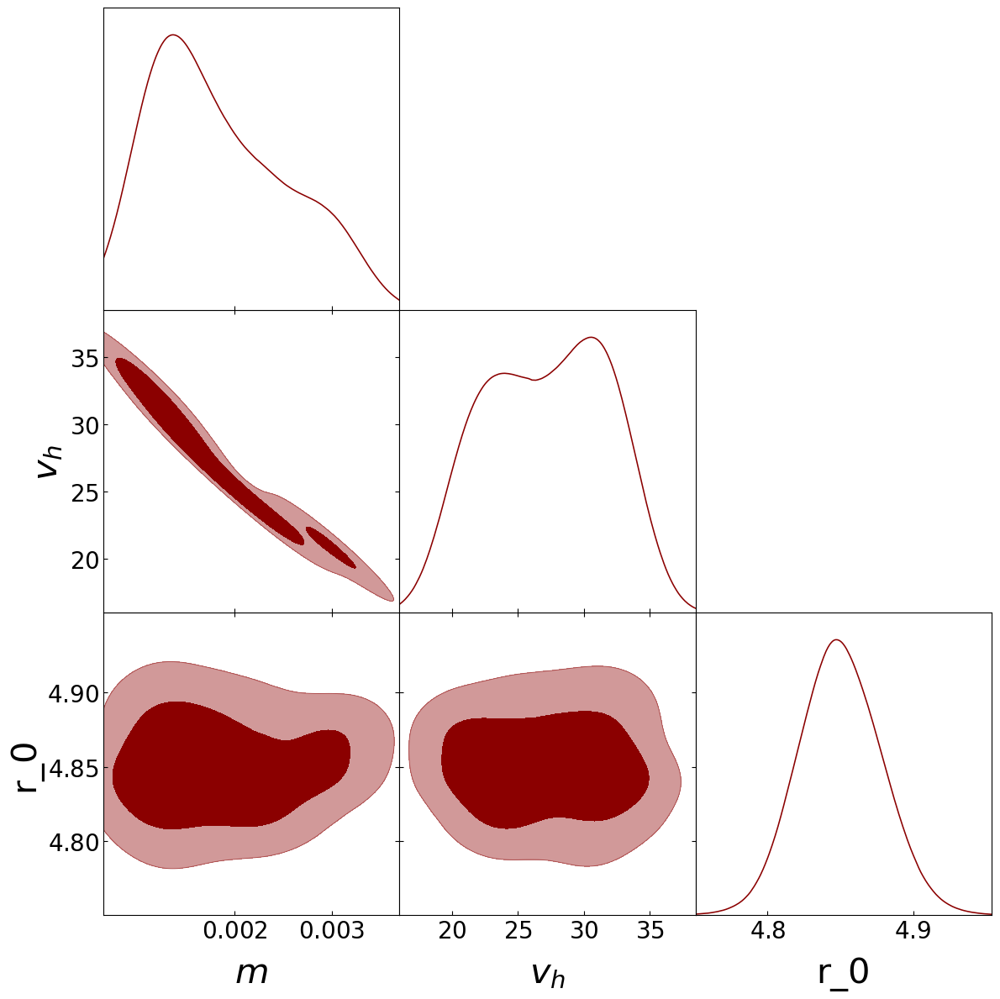

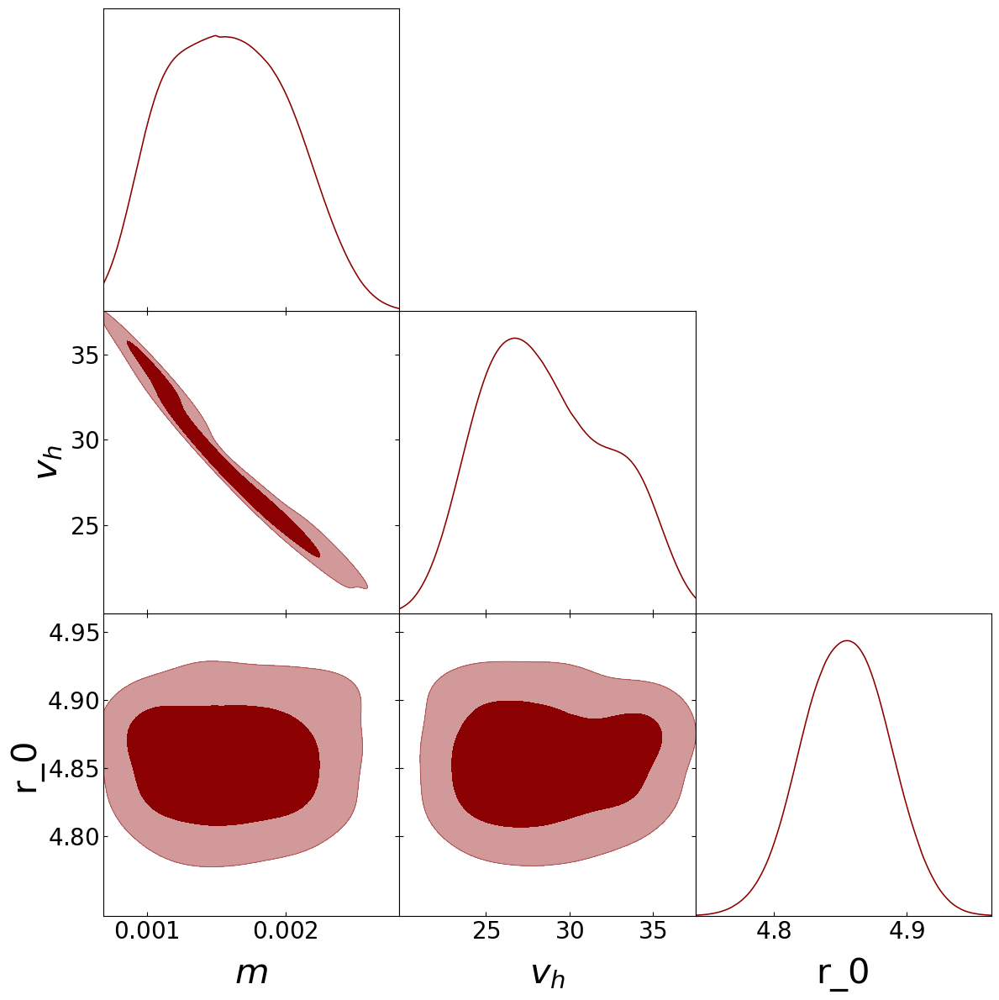

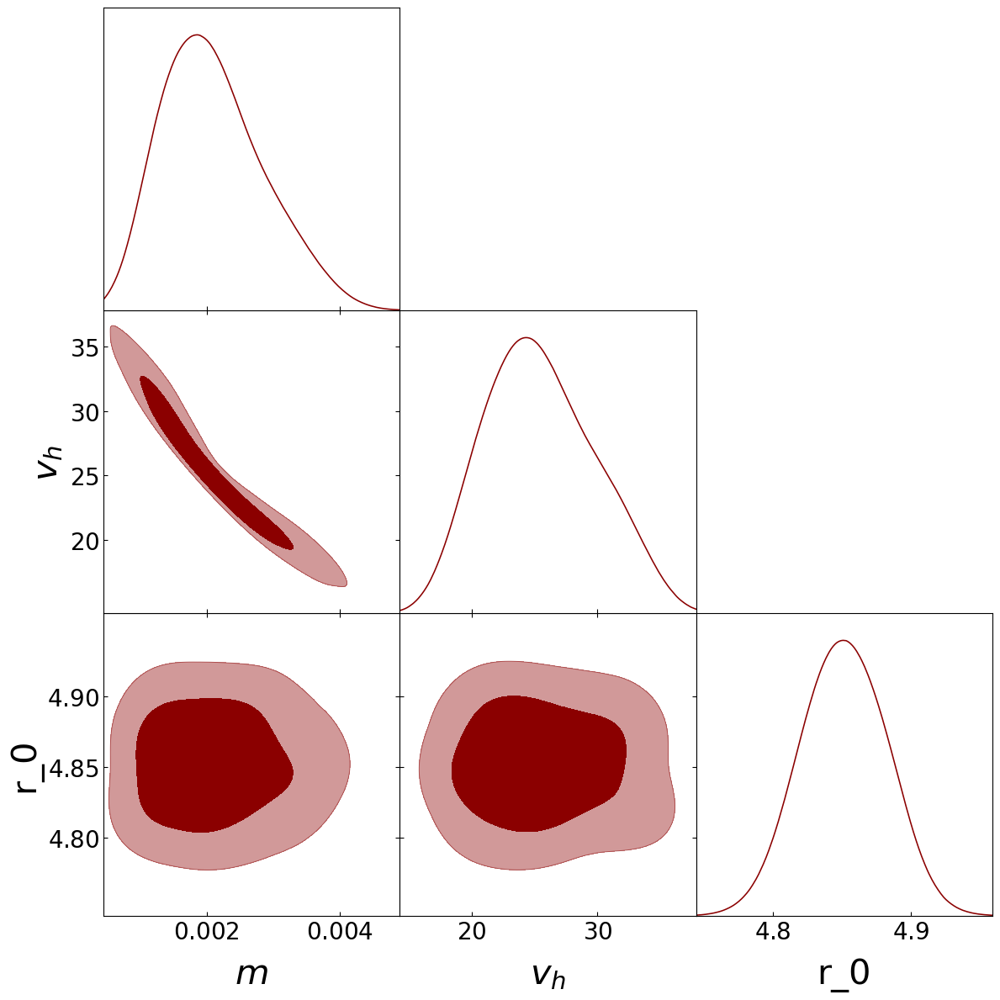

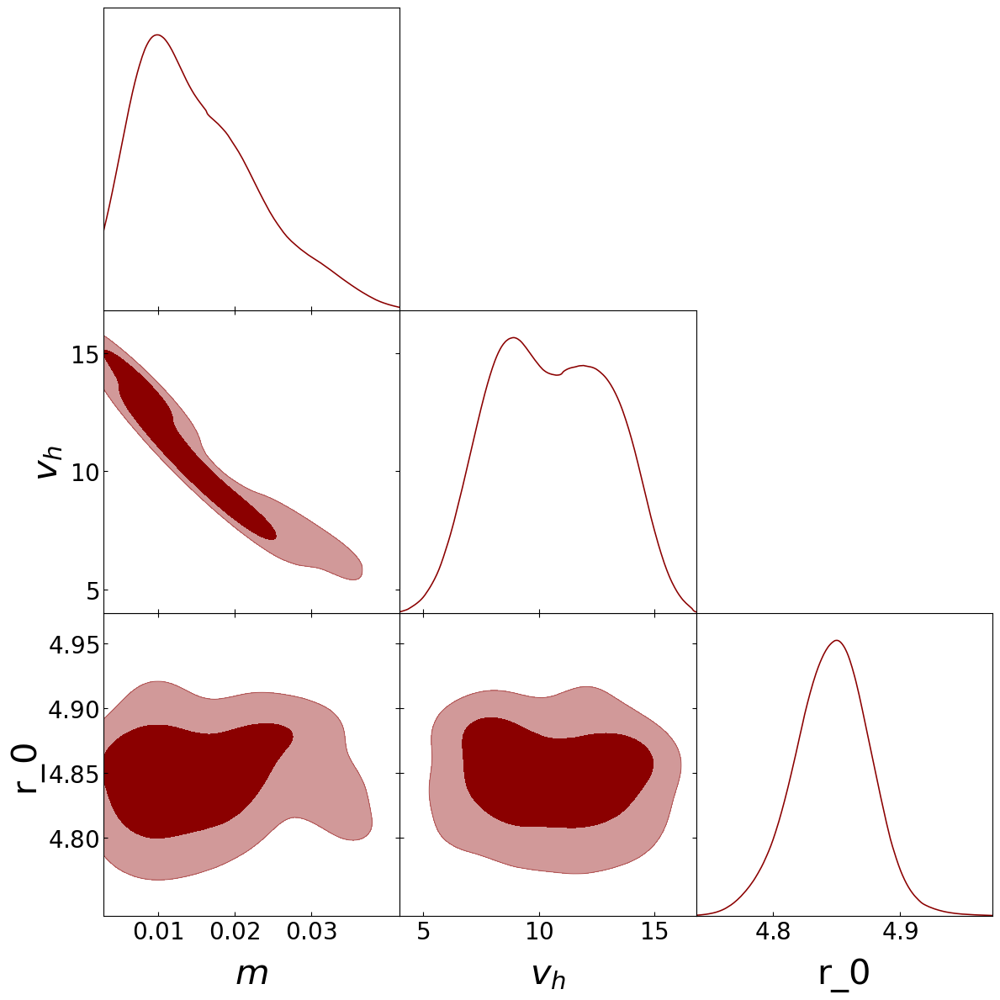

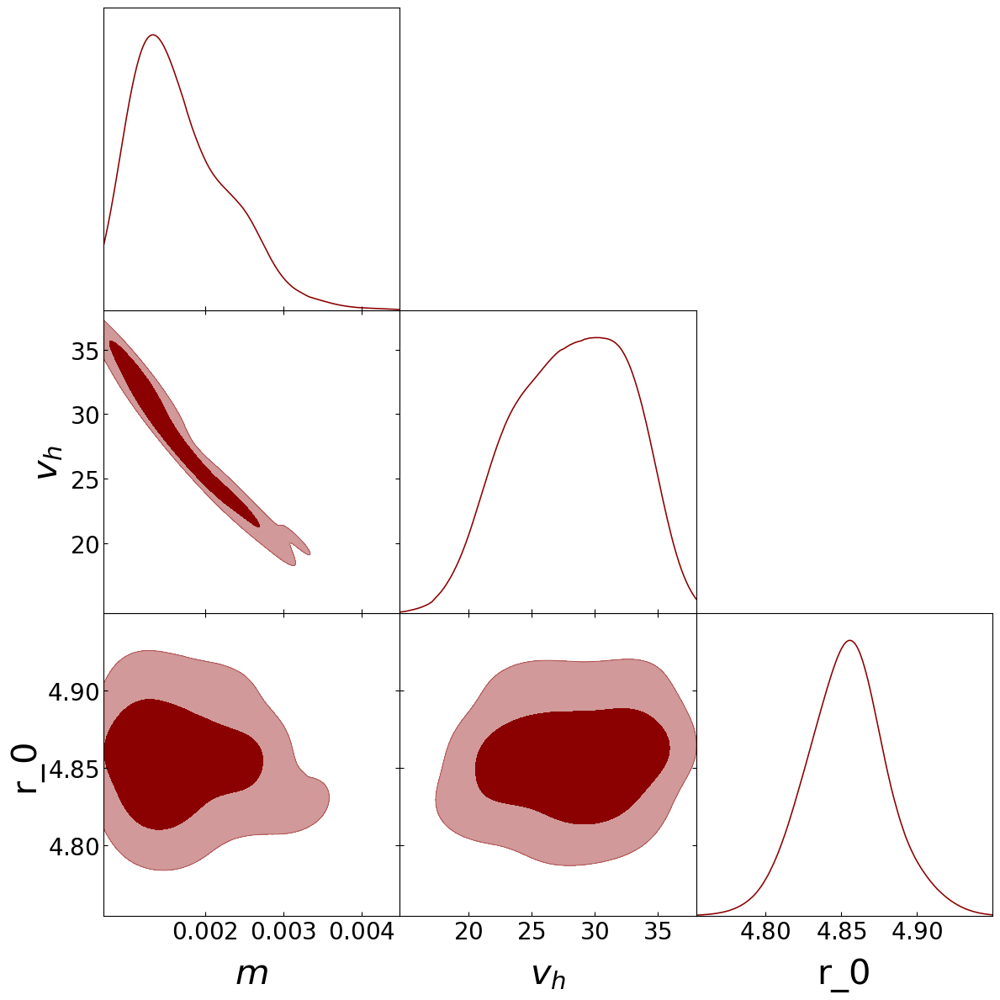

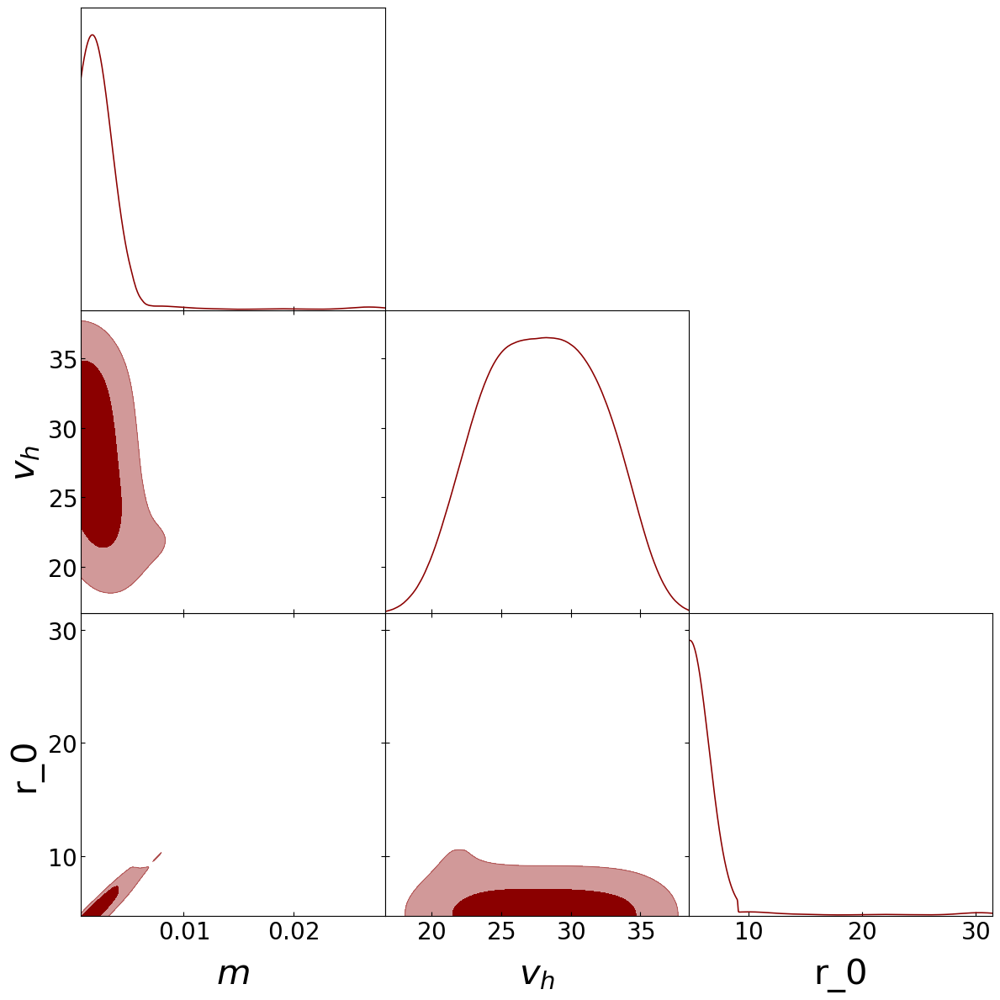

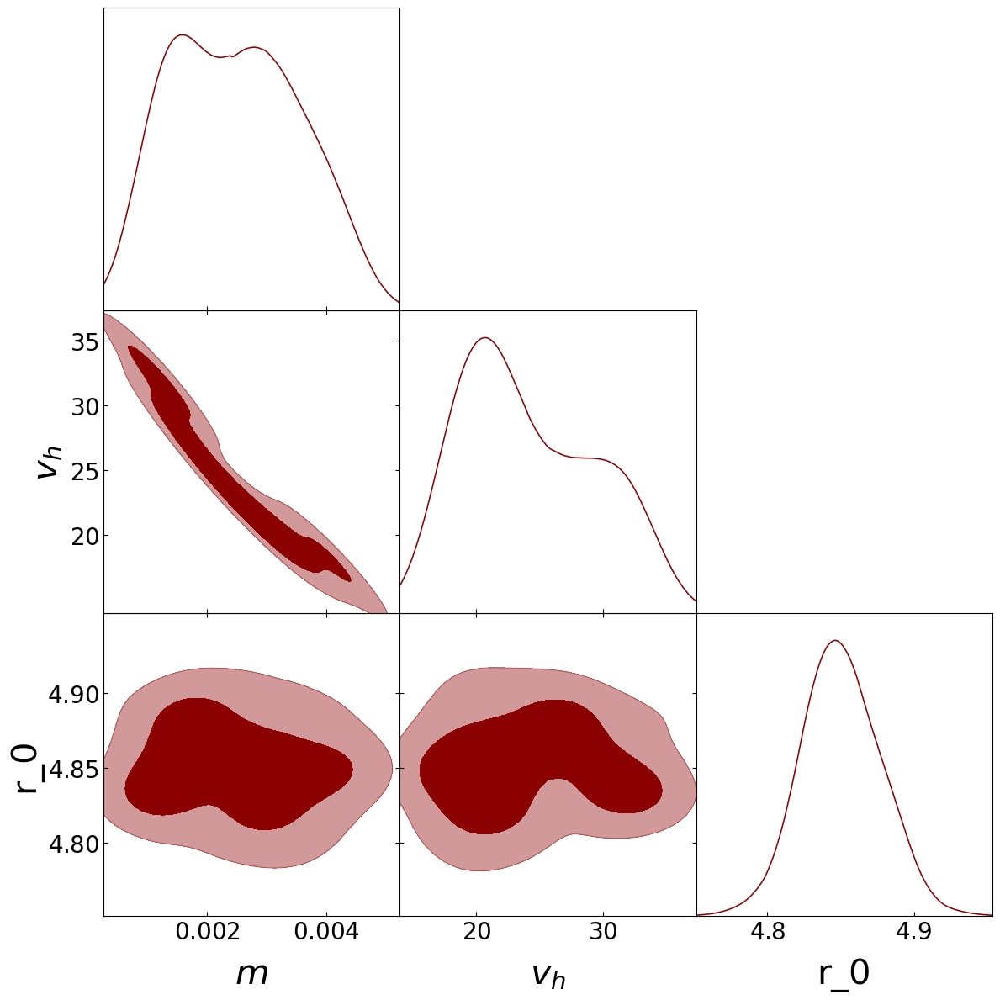

In [26]:
loc = "plots/MCMC-results/"
names = ["aqn2.npy",
        "aqn3.npy",
        "aqn4.npy",
        "aqn5.npy",
        "aqn6.npy",
        "aqn7.npy",
        "aqn8.npy"]
nsteps  = 30000
burnout = int(0.1*nsteps)
print(burnout * 3 * 2, "will be removed")
parameter_names = ['$m$', '$v_h$', "r_0"]

m_array  = []
vh_array = []
r0_array = []

e_m_array  = []
e_vh_array = []
e_r0_array = []

for ii in range(len(names)):
    print(names[ii])
    analysis_chain_with_burnout = np.load(loc+names[ii])
    analysis_chain = analysis_chain_with_burnout[2*3*burnout:]
    posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
    posterior_std = np.std(np.array(analysis_chain),axis=0)
    toprint = 'The constraints are:\n'
    for i in range(3):
        toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
    print(toprint)
    
    m_array.append(posterior_means[0])
    vh_array.append(posterior_means[1])
    r0_array.append(posterior_means[2])
    
    e_m_array.append(posterior_std[0])
    e_vh_array.append(posterior_std[1])
    e_r0_array.append(posterior_std[2])

    
    # Now, plotting
    
    MC_Sample_1 = MCSamples(samples=analysis_chain,names=parameter_names,label="Sample Name",settings={'mult_bias_correction_order':0,'smooth_scale_2D':0.5, 'smooth_scale_1D':0.5}) 
    # Feel free to change these three ploting parameters
    # print(MC_Sample_1.getTable(limit=1).tableTex())
    # You can also try printing a table with this function
    # which gives mean (or median? I cannot remember) and assymetric error bars
    # on each parameters
    plotter = plots.get_subplot_plotter(width_inch=12)
    plotter.settings.axes_fontsize=20
    plotter.settings.axes_labelsize=30
    plotter.settings.legend_fontsize=17
    Chains_to_plot = [MC_Sample_1] # you can add more here if you want to plot more than one posteriors
    plotter.triangle_plot(Chains_to_plot,filled=[True,False,False], 
                    # Also okay to have filled = [True,False,False]
                    contour_colors=['darkred','limegreen','deepskyblue'], 
                    # Your contour colours
                    markers={'$\\Omega_m$':0.3165,'$\\sigma_8$':0.8120})
                    # A thin dashed line that labels some value you want to see/compare with
    plotter.export(loc+'simple'+str(ii)+".svg") # Change your output file name
    plotter.export(loc+'simple'+str(ii)+".png")

    # plot the triangle plot with corner, 
    # note that -- it is only capable for plotting one set of posteriors as what I am aware of
    fig=corner.corner(analysis_chain,smooth=1, # contour smoothness
                      levels=(0.68,0.95), # contour levels
                      bins=35, # bins of measuring pdfs on each dimension
                      labels=parameter_names,show_titles=True,title_fmt='.3f', 
                      # show asymmetric error bars on the plot title with median
                      label_kwargs={'fontsize':30},title_kwargs={'fontsize':22}) # fontsizes
    axes = np.array(fig.axes).reshape((ndim, ndim))
    for i in range(ndim): # line of default value on 1D pdf that you can compare with 
        ax = axes[i,i]
        ax.axvline(values_ori[i], color="green", linestyle="--")
        ax.tick_params(axis='both', labelsize=15)

    for yi in range(ndim): # line of default value on 2D pdf that you can compare with 
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(values_ori[xi], color="green", linestyle="--")
            ax.axhline(values_ori[yi], color="green", linestyle="--")
            ax.plot(values_ori[xi], values_ori[yi], "green", linestyle="--")
            ax.tick_params(axis='both', labelsize=15)

#     axes[0,0].set_xlim(0.0008,0.0035)
#     axes[1,0].set_xlim(0.0008,0.0035)
#     axes[2,0].set_xlim(0.0008,0.0035)

#     axes[1,0].set_ylim(18,37)
#     axes[2,1].set_xlim(18,37)
#     axes[1,1].set_xlim(18,37)

    fig.set_size_inches((10,10))
    #fig.tight_layout()
    fig.savefig(loc+'corner'+str(ii)+".svg", bbox_inches='tight')
    fig.savefig(loc+'corner'+str(ii)+".jpeg",dpi=300, bbox_inches='tight')
    # fig.show()
    plt.close()
    
    plt.figure(dpi=400)
    plt.errorbar(angles,
             angular_flux_wmap, 
             yerr=angular_flux_wmap_error, 
             marker=".", markersize=10, linestyle = 'none',color='blue', ecolor="gray")


    angular_flux_aqn = theory_function([m_array[ii],vh_array[ii],r0_array[ii]])



    plt.plot(angles,
             angular_flux_aqn, 
             marker="none", markersize=10, linestyle = '-',color='red')   
    # plt.title("$m$ = "+str(round(m,3))+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    plt.xlabel("Angular Distance [deg]", size=16)
    plt.ylabel("Average Flux [mK]", size=16)
    plt.ylim([-0.05,0.55])
    plt.text(20,0.40,"$m$ = "+str(round(m_array[ii],3))+" kg\n$v_h$ = "+str(int(round(vh_array[ii],0)))+" km$\,$s$^{-1}$\n$r_0$ = "+str(round(r0_array[ii],2))+" kpc",size=16)

        # plt.savefig("plots/MCMC-results/"+str(i)+".png")
        # plt.close()
    plt.xticks(size=15)
    plt.yticks(size=15)
    # plt.savefig("plots/MCMC-results/final_plot.png")
    # plt.savefig("plots/MCMC-results/final_plot.svg")
    # plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.png", bbox_inches='tight')
    # plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.svg", bbox_inches='tight')
    plt.savefig(loc+'angular_flux_plot'+str(ii)+".svg", bbox_inches="tight")
    plt.close()
    # plt.show()

In [33]:
print(m_array)
print(e_m_array)

for i in range(len(m_array)):
    print(i+1," & ",
        round(m_array[i],4) , " & $\pm$ & ", round(e_m_array[i],4), " & ", 
          int(round(vh_array[i],0)), " & $\pm$ & ", int(round(e_vh_array[i],0)), " & ",
          round(r0_array[i],2), " & $\pm$ & ", round(e_r0_array[i],2))

[0.0018399688111484969, 0.0015842133759405288, 0.0021024992981373844, 0.0016841912715142532, 0.0023011458841624747, 0.0024740544485285978]
[0.0006492359925743786, 0.00039215640380613046, 0.000700133222230557, 0.0005754563622259294, 0.003404717459147792, 0.0009878007010794704]
1  &  0.0018  & $\pm$ &  0.0006  &  27  & $\pm$ &  4  &  4.85  & $\pm$ &  0.03
2  &  0.0016  & $\pm$ &  0.0004  &  29  & $\pm$ &  3  &  4.85  & $\pm$ &  0.03
3  &  0.0021  & $\pm$ &  0.0007  &  25  & $\pm$ &  4  &  4.85  & $\pm$ &  0.03
4  &  0.0017  & $\pm$ &  0.0006  &  28  & $\pm$ &  4  &  4.85  & $\pm$ &  0.02
5  &  0.0023  & $\pm$ &  0.0034  &  28  & $\pm$ &  4  &  5.46  & $\pm$ &  3.36
6  &  0.0025  & $\pm$ &  0.001  &  24  & $\pm$ &  5  &  4.85  & $\pm$ &  0.03


In [34]:
def weighted_average(m_array, e_m_array):
    # Calculate the weighted average
    weighted_avg = sum(value_i / (uncertainty_i ** 2) for value_i, uncertainty_i in zip(m_array, e_m_array)) / sum(1 / (uncertainty_i ** 2) for uncertainty_i in e_m_array)

    # Calculate the uncertainty of the weighted average
    weighted_avg_uncertainty = 1 / (sum(1 / (uncertainty_i ** 2) for uncertainty_i in e_m_array)) ** 0.5
    weights = 1/np.array(e_m_array)**2
    weighted_avg_uncertainty = np.sqrt( np.sum( (weights / np.sum(weights) * np.array(e_m_array))**2  ) )
    return weighted_avg, weighted_avg_uncertainty

# Example usage
# m_array = [1, 2, 3, 4, 5]  # List of parameter values
# e_m_array = [0.1, 0.2, 0.3, 0.4, 0.5]  # List of uncertainties for each value

m, m_u = weighted_average(m_array, e_m_array)

print("m: ", m)
print("m_u: ", m_u, "\n")


vh, vh_u = weighted_average(vh_array, e_vh_array)

print("vh: ", vh)
print("vh_u: ", vh_u, "\n")


r0, r0_u = weighted_average(r0_array, e_r0_array)

print("r0: ", r0)
print("r0_u: ", r0_u, "\n")


m:  0.0017796023707170386
m_u:  0.00025780483451990613 

vh:  27.211082997705237
vh_u:  1.6263129085737729 

r0:  4.851958636103291
r0_u:  0.01184916488093294 



In [134]:
e_m_array

[0.0006492359925743786,
 0.00039215640380613046,
 0.000700133222230557,
 0.0005754563622259294,
 0.0009878007010794704]

In [119]:
r0_array

[4.8501123683188325,
 4.85409239480367,
 4.851512013171255,
 4.846524372939355,
 4.853755318454692,
 4.850608451550175]

In [30]:
m_array.pop(3)
vh_array.pop(3)
r0_array.pop(3)

4.846524372939355

In [31]:
e_m_array.pop(3)
e_vh_array.pop(3)
e_r0_array.pop(3)

0.02719886095454081

In [41]:
angular_flux_wmap_error[-4]

0.05164796820797192

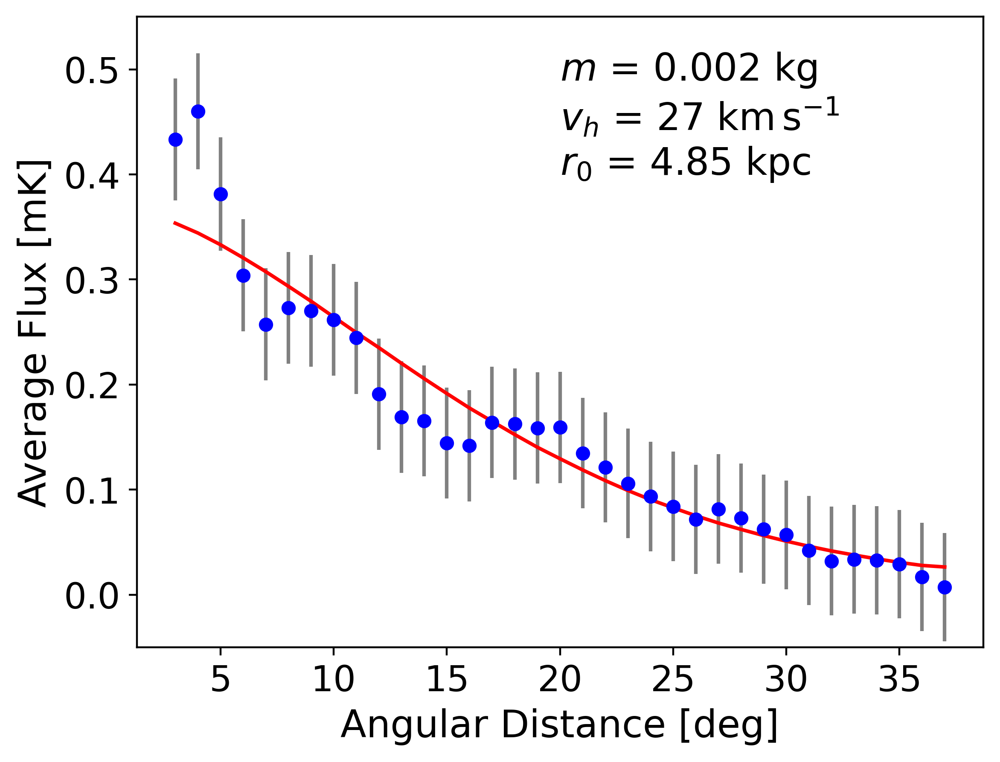

In [43]:
plt.figure(dpi=400)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=10, linestyle = 'none',color='blue', ecolor="gray")


angular_flux_aqn = theory_function([m,vh,r0])
    

    
plt.plot(angles,
         angular_flux_aqn, 
         marker="none", markersize=10, linestyle = '-',color='red')   
# plt.title("$m$ = "+str(round(m,3))+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
plt.xlabel("Angular Distance [deg]", size=16)
plt.ylabel("Average Flux [mK]", size=16)
plt.ylim([-0.05,0.55])
plt.text(20,0.40,"$m$ = "+str(round(m,3))+" kg\n$v_h$ = "+str(int(round(vh,0)))+" km$\,$s$^{-1}$\n$r_0$ = "+str(round(r0,2))+" kpc",size=16)
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.xticks(size=15)
plt.yticks(size=15)
# plt.savefig("plots/MCMC-results/final_plot.png")
# plt.savefig("plots/MCMC-results/final_plot.svg")
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.png", bbox_inches='tight')
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.svg", bbox_inches='tight')
plt.savefig("aqn-final-2.svg", bbox_inches="tight")
plt.show()

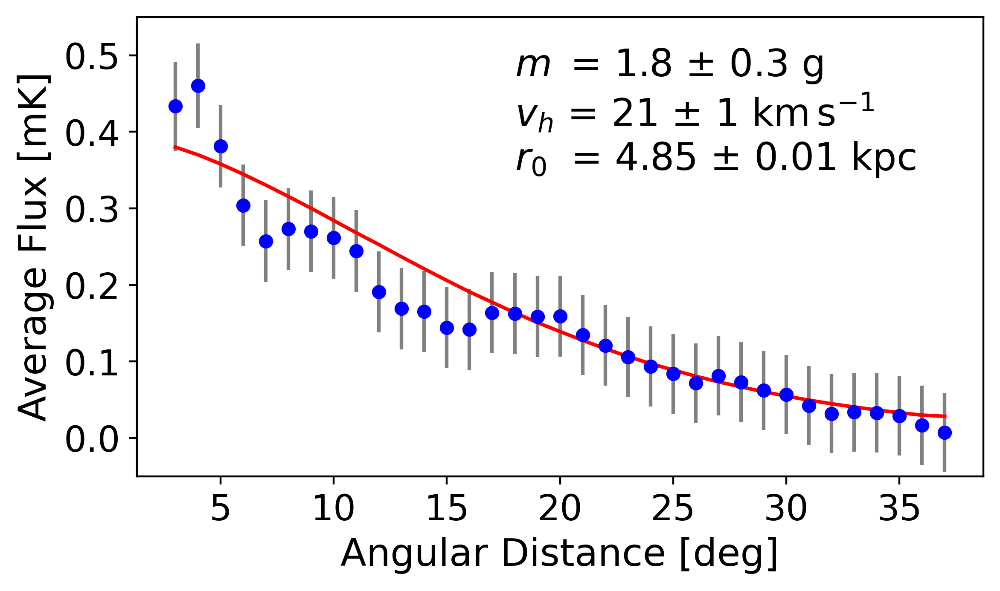

In [59]:
# Plot for poster

plt.figure(dpi=400,figsize=(6.4,3.5))
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=10, linestyle = 'none',color='blue', ecolor="gray")


angular_flux_aqn = theory_function([m,vh+1,r0])

    
plt.plot(angles,
         angular_flux_aqn, 
         marker="none", markersize=10, linestyle = '-',color='red')   
# plt.title("$m$ = "+str(round(m,3))+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
plt.xlabel("Angular Distance [deg]", size=16)
plt.ylabel("Average Flux [mK]", size=16)
plt.ylim([-0.05,0.55])
plt.text(18,0.35,"$m\,$ = 1.8 $\pm$ 0.3 g\n$v_h$ = 21 $\pm$ 1 km$\,$s$^{-1}$\n$r_0\;$ = 4.85 $\pm$ 0.01 kpc",size=16)
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.xticks(size=15)
plt.yticks(size=15)
# plt.savefig("plots/MCMC-results/final_plot.png")
# plt.savefig("plots/MCMC-results/final_plot.svg")
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.png", bbox_inches='tight')
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.svg", bbox_inches='tight')
plt.savefig("aqn-final-2.svg", bbox_inches="tight")
plt.show()

In [24]:
plt.show()

In [23]:
import math
import numpy as np
import matplotlib.pyplot as plt

#LIST OF ALL INPUTS

# fname is assumed to be a .csv file (comma separated values). All rows 
# containing non-number text (example: names for each column) must begin 
# with "#". The .csv file must be in the same 
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'
fname = 'NewFile-lineartest-data.csv'
# the data file fname has x data (first column), uncertainty in x data,
# and y data (third column) and 
# the uncertianty in y (third column).
# Enter the name and units of each column here so that the plots are properly
# labeled. e.g. x_name = 'Time', x_units = 'sec', y_name = 'Position', y_units
# = 'metres'.
x_name = 'x-name'
x_units = 'x-units'
y_name = 'y-name'
y_units = 'y-units'

###############################################################################
# loads data, calculates best fit
###############################################################################


# access the data columns and assign variables x,y  and  y_sigma
# THIS IS WHERE YOU DEFINE THE X, Y, AND Y-UNCERTAINTY
# CHANGE DEFINITIONS IF YOU ARE FITTING RE-SCALED DATA (eg. LOG-LOG OR OTHER RESCALING) 
x = data[:,0]
y = data[:,2]
#y_sigma = data[:,3]
y_sigma = data[:,3]
# define an array of points  used or plotting the theory function
x_fitfunc=np.linspace(min(x),max(x),500)
    
# calculate the best fit slope analytically (1-parameter solution)
m = sum(x*y/y_sigma**2)/sum((x/y_sigma)**2)

# calculate uncertainty of the best fit slope
m_sigma = math.sqrt(1/sum((x/y_sigma)**2))

print ("Slope is", m, "+/-", m_sigma)
    
                        
###############################################################################
# calculates and prints the chi-squared, degrees of freedon, and weighted chi-squared
###############################################################################

# function that  calculates the chi square value of a fit
def chi_square (param, x, y, sigma):
#
    return np.sum((y-fit_function(x, param))**2/sigma**2)
    
# calculate and print chi square as well as the per degree-of-freedom value
chi2 = chi_square(m,x,y,y_sigma)
dof = len(x) - 1
print ("\nGoodness of fit - Chi-squared measure:")
print ("degrees of freedom = {}, Chi2 = {}, Chi2/dof = {}\n".format(dof, chi2, chi2/dof))

      
###############################################################################
# plots the data and the fit curve, plus a plot of residuals
###############################################################################
# code is set to make a dual plot with plot1 showing data and best fit model, plot2 showing residuals

# y_fitfunc is the curve using the parameters calculated from the fit
#x_fit = np.linspace(min(f),max(f),len(f))
y_fitfunc = fit_function(x_fitfunc, m)
# plots y, and y_fit on the same plot.
# marker='.' : data points are not indicated by markers
# linestyle= '-' : a continuous line is drawn
# linewidth=2 : the line thickness is set to 2
# color='r' : the color of the line is set to red
# label=string : the string is shown in the legend

fig=plt.figure(figsize=(7,10))

# plot the data and best fit
plot1=fig.add_subplot(2,1,1)
plot1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
plot1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
         label=" fit")
# add axis labels and title
plot1.set_xlabel('{} [{}]'.format(x_name,x_units))
plot1.set_ylabel('{} [{}]'.format(y_name,y_units))
plot1.set_title('Data with Best Fit')
# set the x and y boundaries of your plot
#plot1.xlim(lower_x,upper_x)
#plot1.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
plot1.legend(loc='best',numpoints=1)


# residual is the difference between the data and theory
y_fit=fit_function(x,m)
residual = y-y_fit
#calculate normalized residuals
normresidual=residual/y_sigma

# this code plots the residuals
plot2 = fig.add_subplot(212)
plot2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
             label="residual (y-y_fit)")
plot2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
plot2.set_xlabel('{} [{}]'.format(x_name,x_units))
plot2.set_ylabel('y-y_fit [{}]'.format(y_units))
plot2.legend(loc='best',numpoints=1)




plt.show()

NameError: name 'data' is not defined

In [106]:
############################################################################ MCMC Analysis Starts HERE ###################

loc =       "plots/MCMC-results/25k-april1/"
analysis_chain_with_burnout = np.load(loc+"25k-april-5.npy")
nsteps  = 25000
burnout = int(0.1*nsteps)
analysis_chain = analysis_chain_with_burnout[2*3*burnout:]


parameter_names = ['$m$', '$v_h$', "r_0"]
posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
posterior_std = np.std(np.array(analysis_chain),axis=0)
toprint = 'The constraints are:'
for i in range(3):
    toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
print(toprint)

The constraints are:$m$=0.001+-0.00
$v_h$=26.61+-4.28
r_0=4.753+-0.02



In [55]:
posterior_means

array([1.89802585e-03, 2.66150081e+01, 4.75397434e+00])

In [14]:
vh = 414

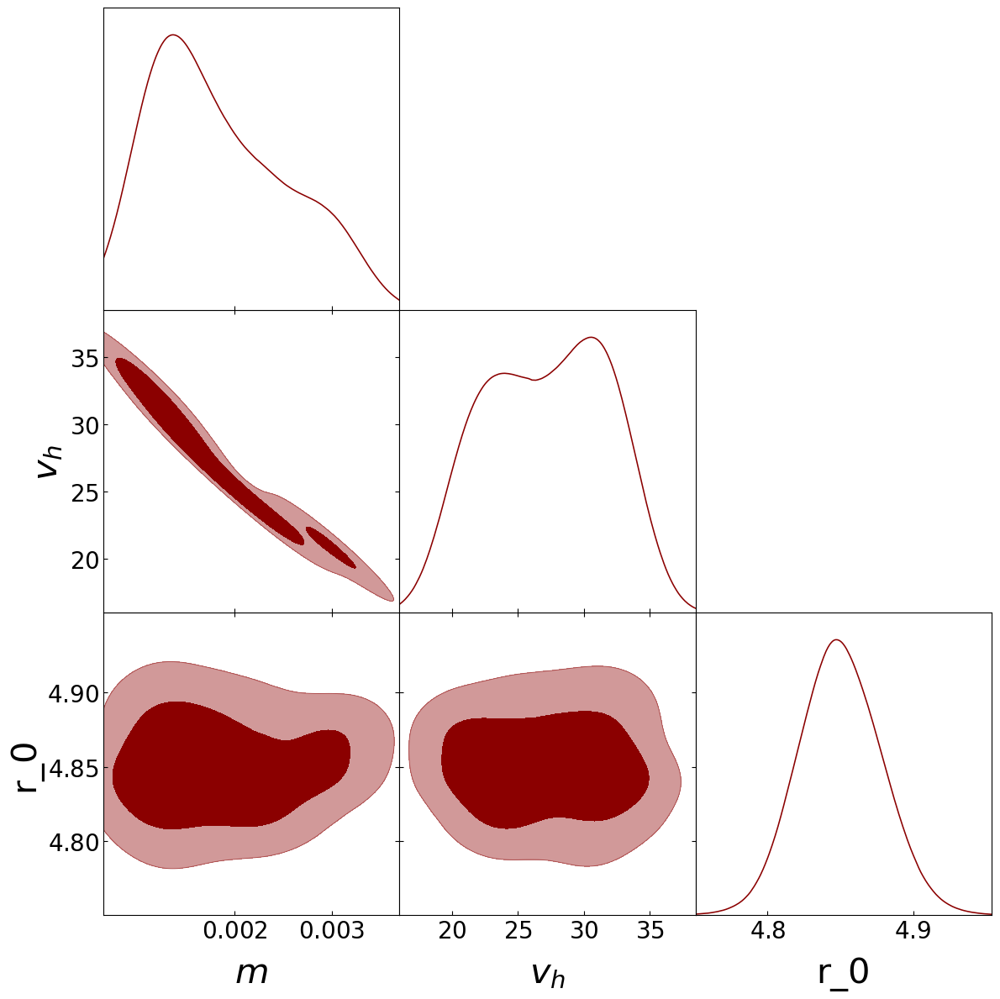

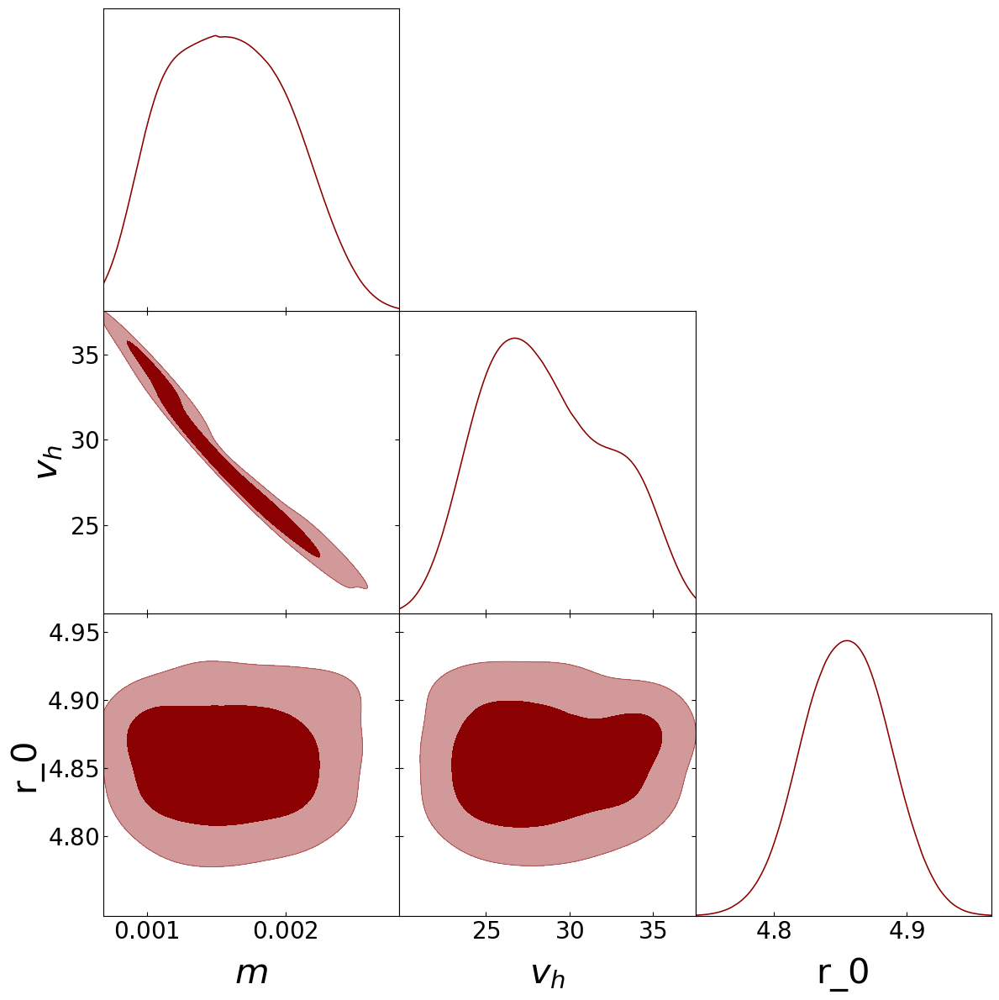

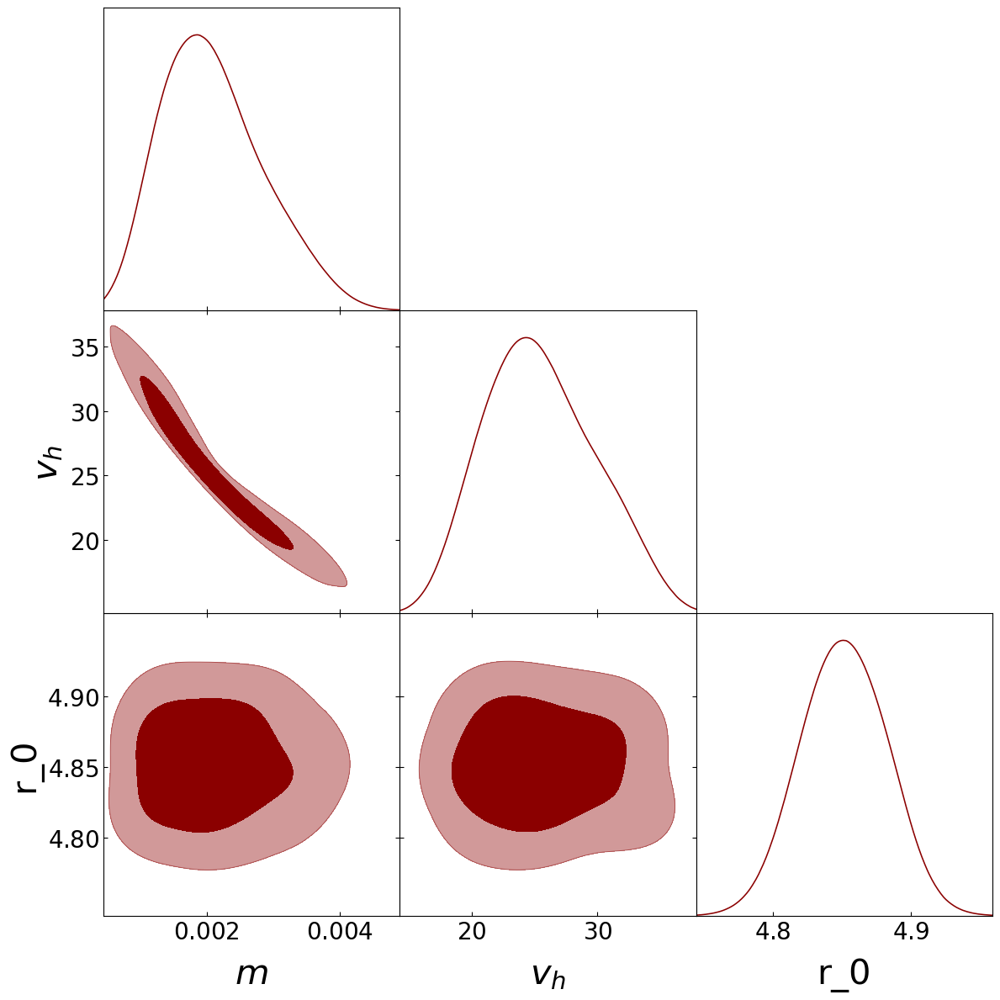

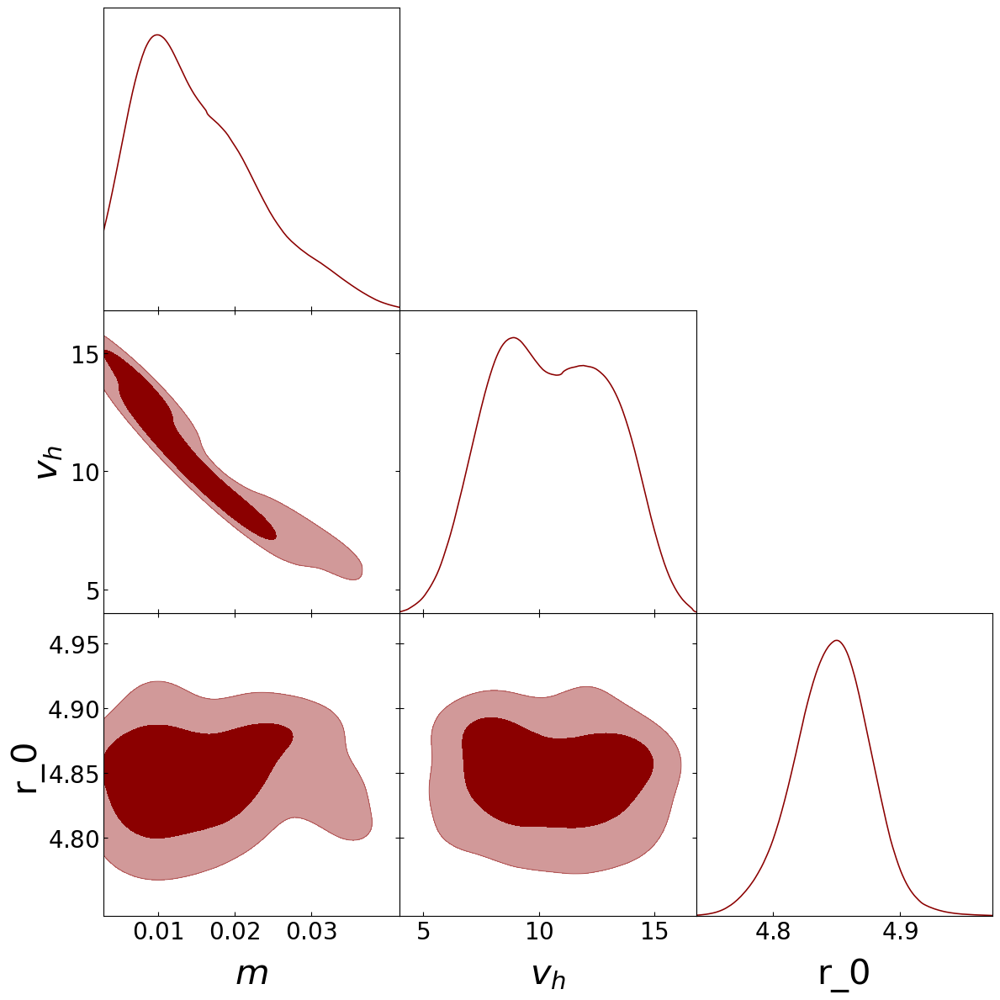

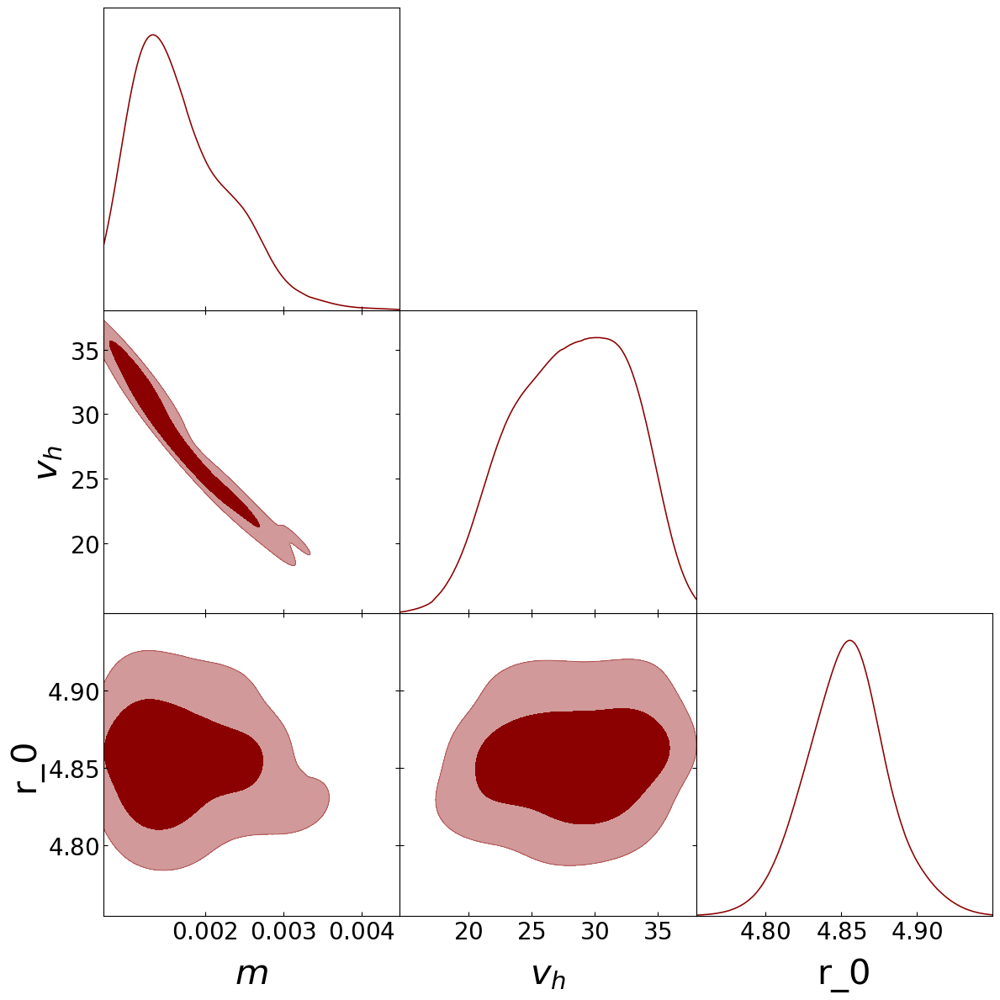

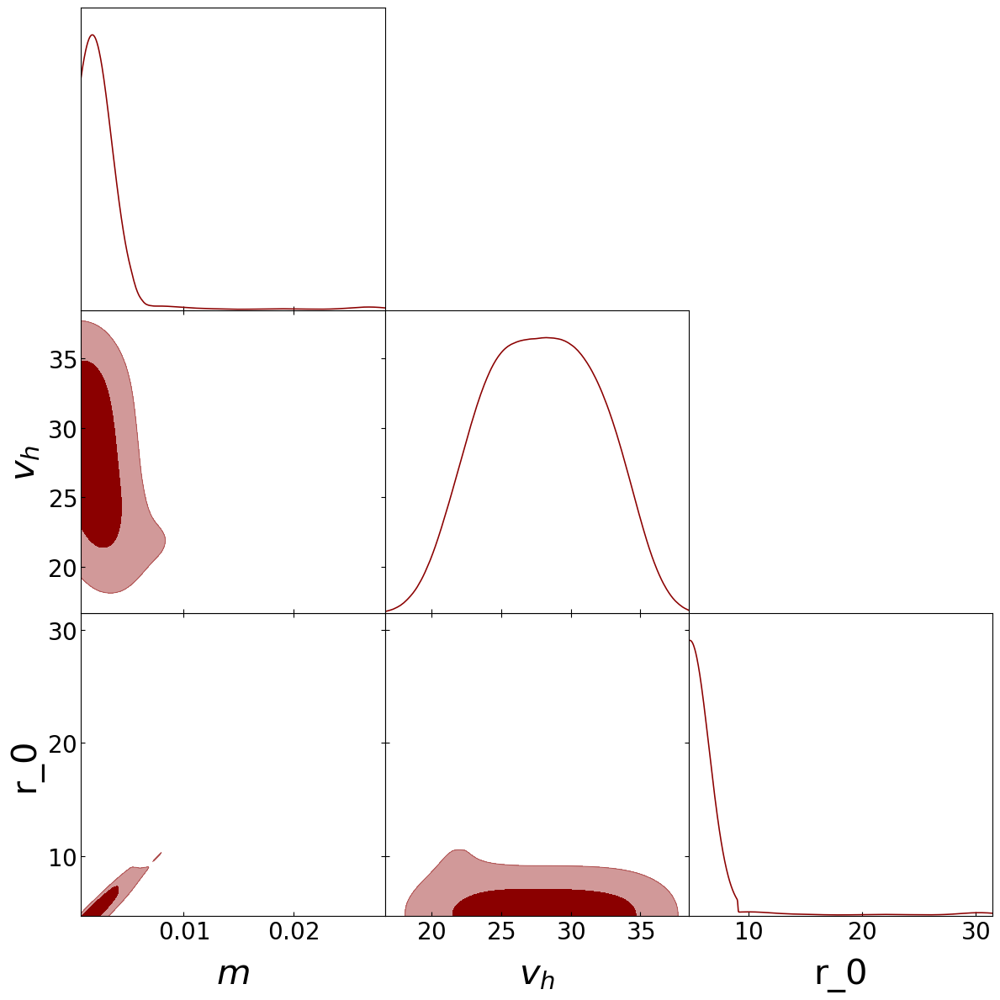

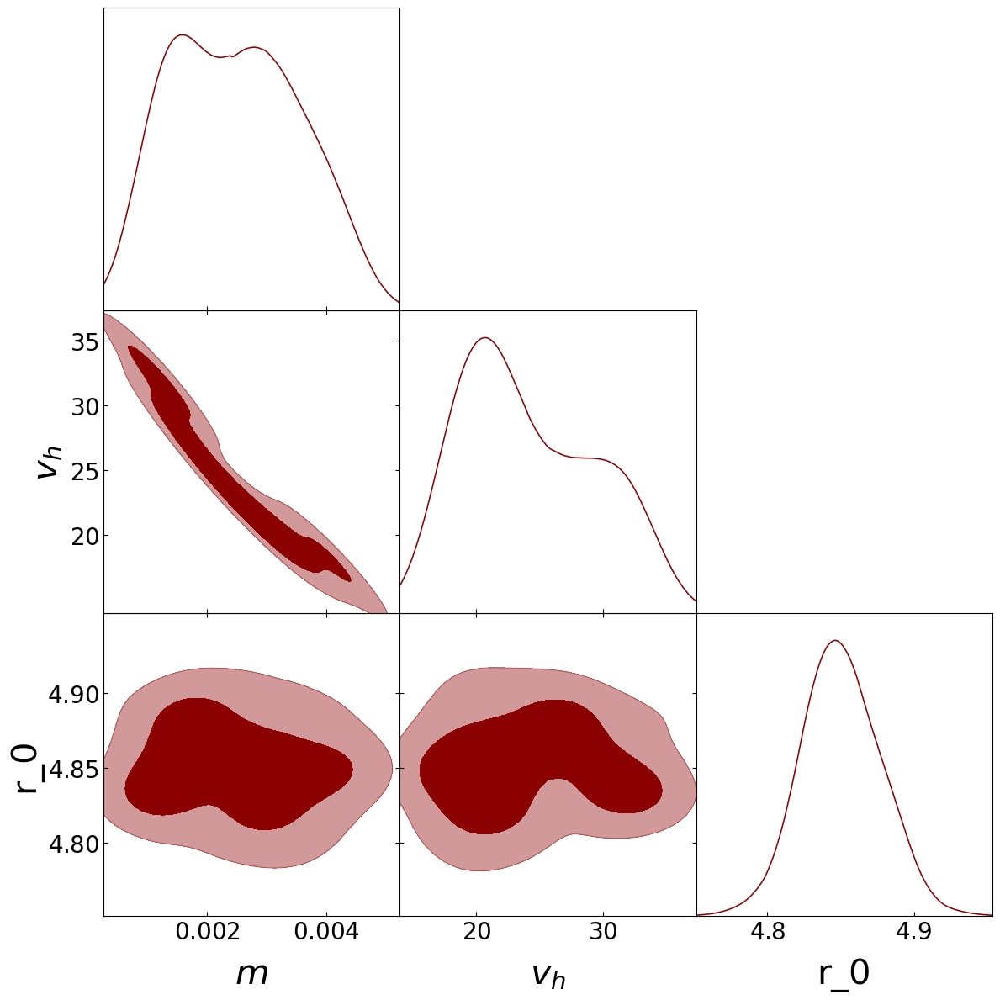

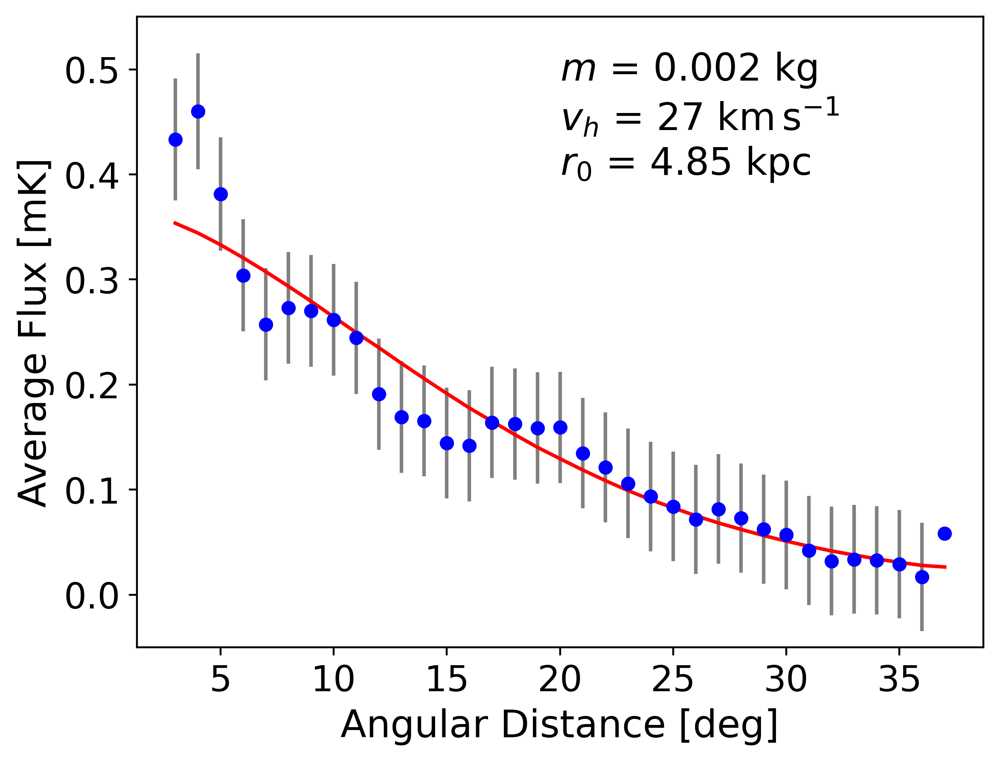

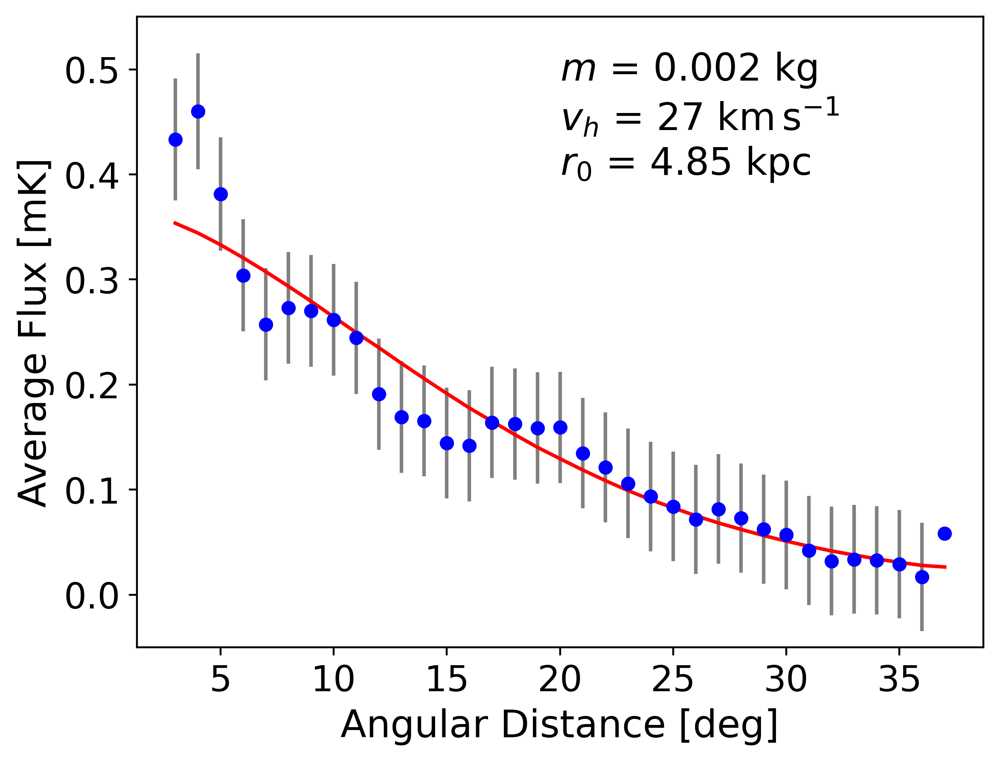

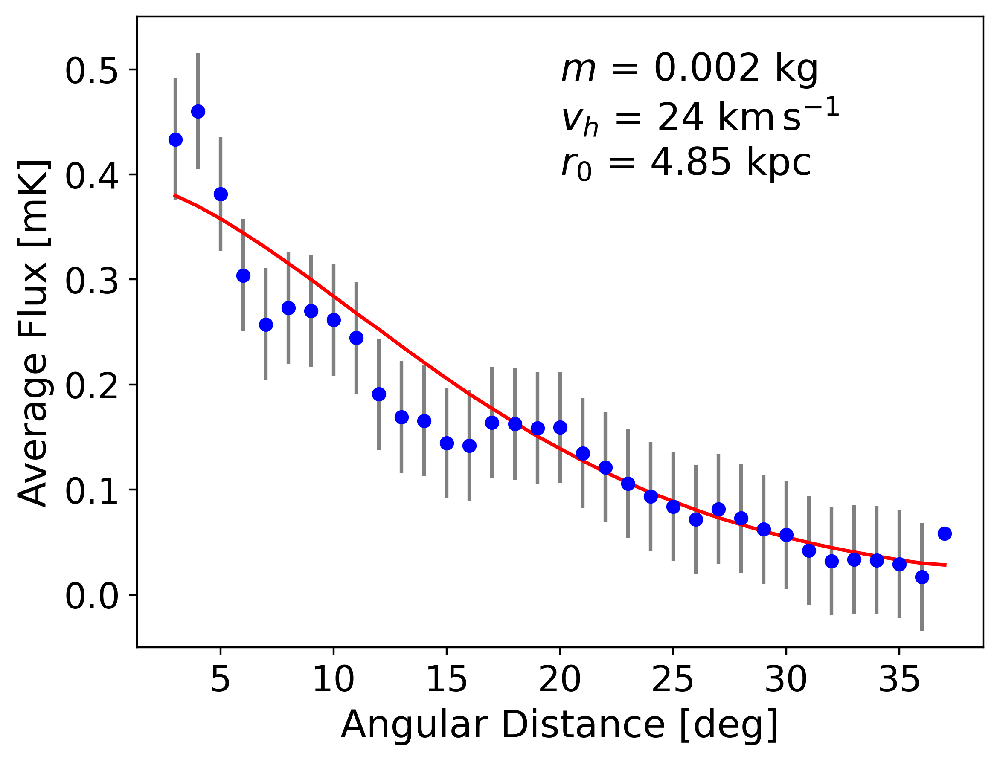

In [24]:
%matplotlib inline
g  = 0.1
m  = posterior_means[0]
vh = posterior_means[1]
r0 = posterior_means[2]

plt.figure(dpi=400)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=10, linestyle = 'none',color='blue', ecolor="gray")


angular_flux_aqn = theory_function([m,vh,r0])
    

    
plt.plot(angles,
         angular_flux_aqn, 
         marker="none", markersize=10, linestyle = '-',color='red')   
# plt.title("$m$ = "+str(round(m,3))+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
plt.xlabel("Angular Distance [deg]", size=16)
plt.ylabel("Average Flux [mK]", size=16)
plt.ylim([-0.05,0.55])
plt.text(20,0.40,"$m$ = "+str(round(m,3))+" kg\n$v_h$ = "+str(int(round(vh,0)))+" km$\,$s$^{-1}$\n$r_0$ = "+str(round(r0,2))+" kpc",size=16)
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.xticks(size=15)
plt.yticks(size=15)
# plt.savefig("plots/MCMC-results/final_plot.png")
# plt.savefig("plots/MCMC-results/final_plot.svg")
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.png", bbox_inches='tight')
# plt.savefig(loc+"flux_vs_angular_dist_AQN_WMAP.svg", bbox_inches='tight')
# plt.savefig("aqn-final.svg", bbox_inches="tight")
plt.show()

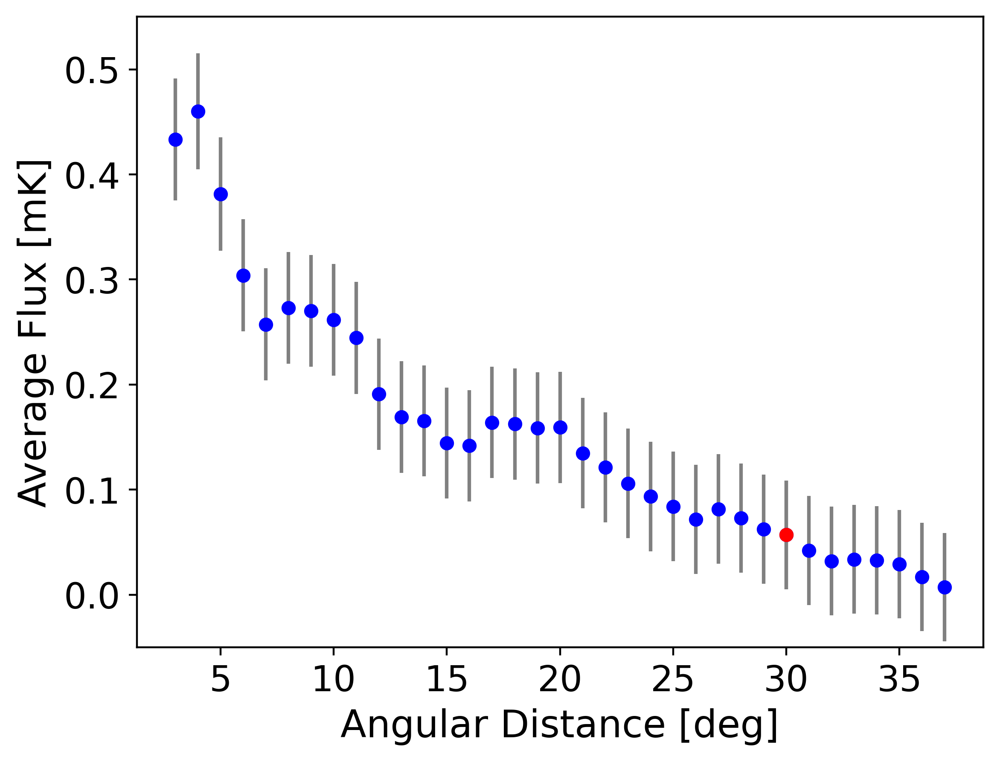

In [99]:
# not needed rn
%matplotlib inline

plt.figure(dpi=400)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=10, linestyle = 'none',color='blue', ecolor="gray")
plt.errorbar(angles[27],
         angular_flux_wmap[27], 
         yerr=angular_flux_wmap_error[27], 
         marker=".", markersize=10, linestyle = 'none',color='red', ecolor="gray")
    
plt.xlabel("Angular Distance [deg]", size=16)
plt.ylabel("Average Flux [mK]", size=16)
plt.ylim([-0.05,0.55])
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.xticks(size=15)
plt.yticks(size=15)
# plt.savefig("plots/MCMC-results/wmap_flux_vs_angular_dist_30red.png")
# plt.savefig("plots/MCMC-results/wmap_flux_vs_angular_dist_30red.svg")
plt.show()

In [12]:
def theory_function(theory_parameters):
    m, vh, r0 = theory_parameters
    
    F_tot_band = simulate_signal(m * u.kg, vh, r0)

    angular_flux_aqn = np.zeros(num_angles)

    for i in range(num_angles):
        F_selected_pixels = F_tot_band[strip_index_refs[angles[i]]]
        angular_flux_aqn[i] = np.average(F_selected_pixels.value)
    
    return angular_flux_aqn

In [59]:
# g = 0.1

# analysis_chain_plot = analysis_chain#sampler.flatchain#[nwalkers*burnout:]

# m_array = np.linspace(-3,3,20)
# vh = np.ones(len(m_array)) * 414
# r0 = np.ones(len(m_array)) * 7.8

# analysis_chain_plot = np.transpose([m_array, vh, r0])
# analysis_chain_plot

# plt.figure(dpi=100)
# plt.errorbar(angles,
#          angular_flux_wmap, 
#          yerr=angular_flux_wmap_error, 
#          marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

# for i in range(len(analysis_chain_plot)):
#     m,vh,r0 = analysis_chain_plot[i]
#     angular_flux_aqn = theory_function([m,vh,r0])
    

    
#     plt.plot(angles,
#              angular_flux_aqn, 
#              marker=".", markersize=5, linestyle = 'none',color='red')   
#     plt.title("$m$ = "+str(m)+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    
#     plt.ylim([0,1])
    
#     # plt.savefig("plots/MCMC-results/"+str(i)+".png")
#     # plt.close()
# # plt.savefig("plots/MCMC-results/all.png")

In [ ]:
g = 0.1

analysis_chain_plot = sampler.flatchain#[nwalkers*burnout:]

m_array = np.exp(np.linspace(-3,3,20))
vh = np.ones(len(m_array)) * 414
r0 = np.ones(len(m_array)) * 7.8

analysis_chain_plot = np.transpose([m_array, vh, r0])
analysis_chain_plot



for i in range(len(analysis_chain_plot)):
    print("./")
    m,vh,r0 = analysis_chain_plot[i]
    angular_flux_aqn = theory_function([m,vh,r0])
    
    plt.figure(dpi=100)
    plt.errorbar(angles,
             angular_flux_wmap, 
             yerr=angular_flux_wmap_error, 
             marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

    plt.plot(angles,
             angular_flux_aqn, 
             marker=".", markersize=5, linestyle = 'none',label=str(round(m,2)))   
    #plt.title("$m$ = "+str(m)+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    
    plt.ylim([0,1])
    
    plt.savefig("plots/MCMC-results/m="+str(round(m,4))+".png")
    plt.close()
# plt.legend()
# plt.savefig("plots/MCMC-results/all.png")

./
./
./
./
./
./


In [133]:
g = 0.1

analysis_chain_plot = sampler.flatchain#[nwalkers*burnout:]

m_array = np.exp(np.linspace(-3,3,20))
vh = np.ones(len(m_array)) * 414
r0 = np.ones(len(m_array)) * 7.8

analysis_chain_plot = np.transpose([m_array, vh, r0])
analysis_chain_plot

plt.figure(dpi=100)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

for i in range(len(analysis_chain_plot)):
    print("./")
    m,vh,r0 = analysis_chain_plot[i]
    angular_flux_aqn = theory_function([m,vh,r0])
    

    
    plt.plot(angles,
             angular_flux_aqn, 
             marker=".", markersize=5, linestyle = 'none',label=str(round(m,2)))   
    #plt.title("$m$ = "+str(m)+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    
    plt.ylim([0,1])
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.legend()
plt.savefig("plots/MCMC-results/all.png")

./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./


In [52]:
np.log(0.01)

-4.605170185988091

In [96]:
#analysis_chain
print(MC_Sample_1.getTable(limit=1).tableTex())


\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $4.58^{-0.40}_{-4.6}       $\\

{\boldmath$v_h$          } & $422^{+41}_{-54}           $\\

{\boldmath$r_0            $} & $-9^{+63}_{-38}            $\\
\hline
\end{tabular}


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $0.00190^{+0.00056}_{-0.00097}$\\

{\boldmath$v_h$          } & $27^{+5}_{-6}              $\\

{\boldmath$r_0$          } & $4.754^{+0.033}_{-0.029}   $\\
\hline
\end{tabular}


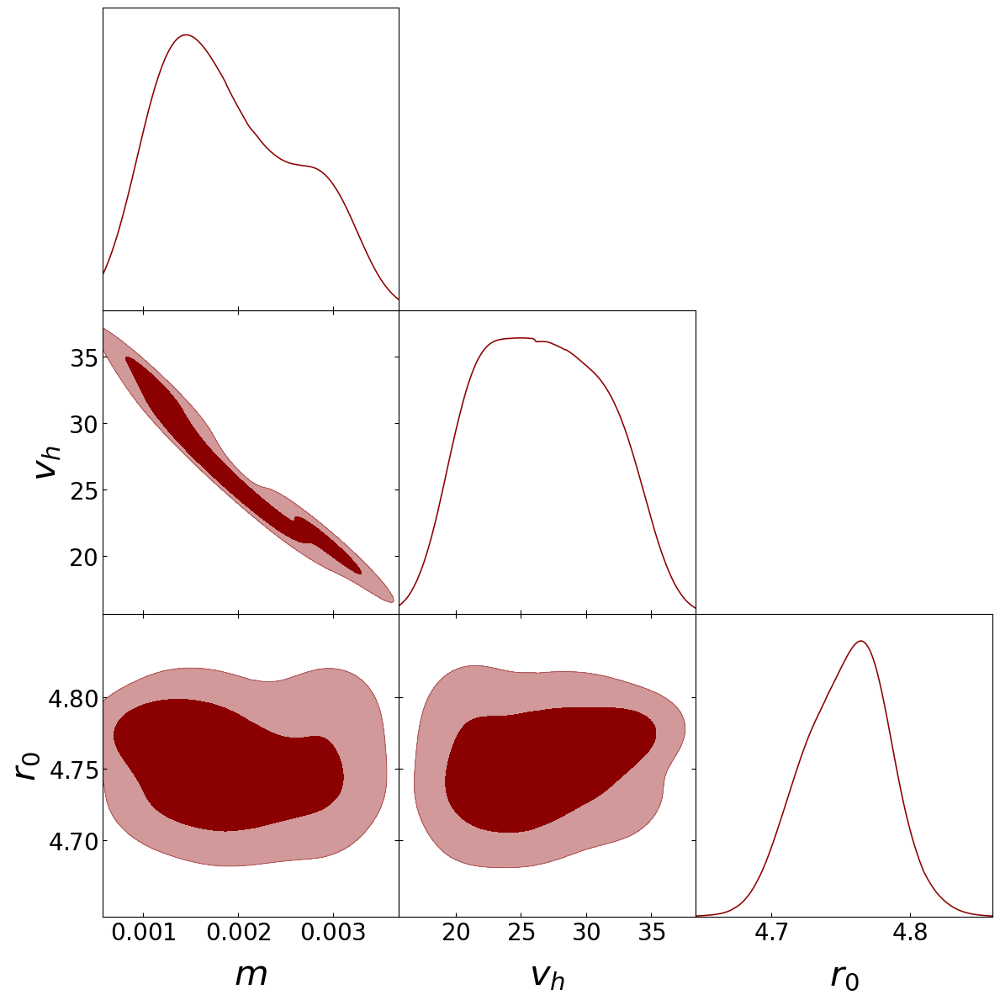

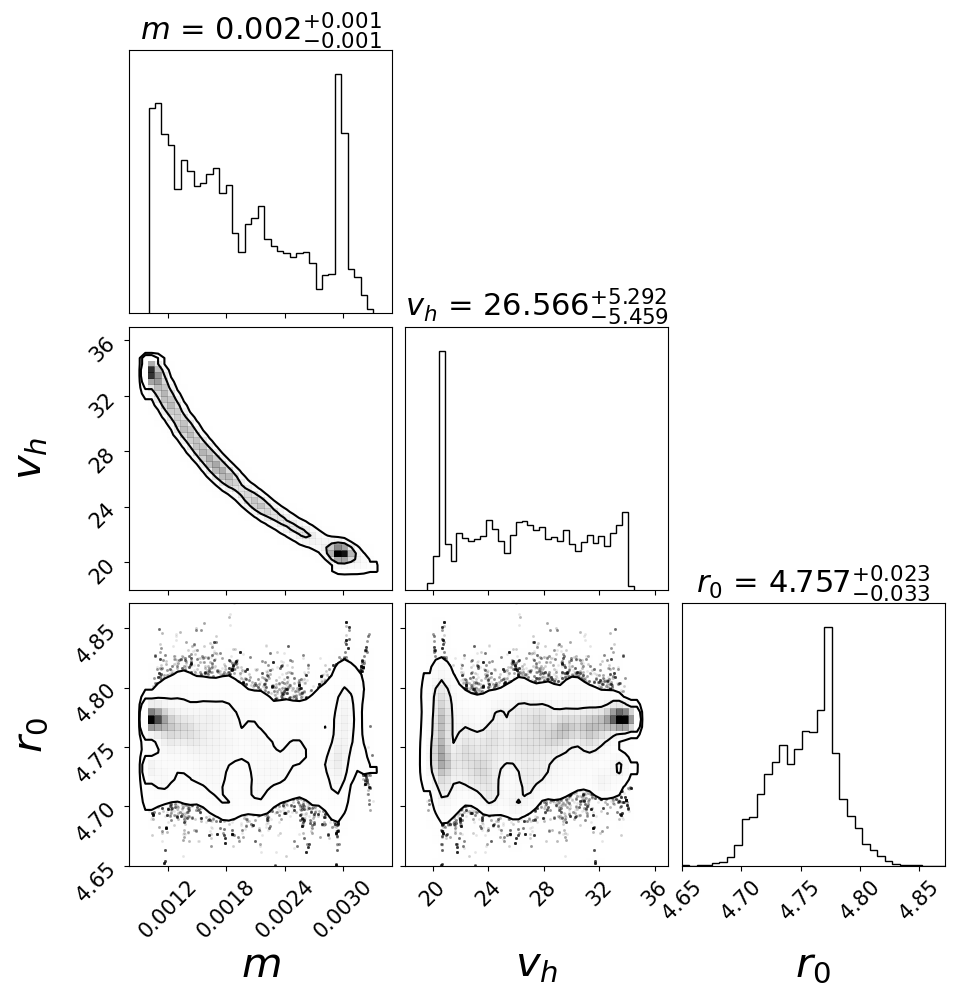

In [60]:
#analysis_chain = np.load('plots/MCMC-results/sample_0.npy') # here saves your sampled posterior chain files



parameter_names = ['$m$', '$v_h$', "$r_0$"]
# plot the triangle plot with getdist
MC_Sample_1 = MCSamples(samples=analysis_chain,names=parameter_names,label="Sample Name",settings={'mult_bias_correction_order':0,'smooth_scale_2D':0.5, 'smooth_scale_1D':0.5}) 
# Feel free to change these three ploting parameters
print(MC_Sample_1.getTable(limit=1).tableTex())
# You can also try printing a table with this function
# which gives mean (or median? I cannot remember) and assymetric error bars
# on each parameters
plotter = plots.get_subplot_plotter(width_inch=12)
plotter.settings.axes_fontsize=20
plotter.settings.axes_labelsize=30
plotter.settings.legend_fontsize=17
Chains_to_plot = [MC_Sample_1] # you can add more here if you want to plot more than one posteriors
plotter.triangle_plot(Chains_to_plot,filled=[True,False,False], 
                # Also okay to have filled = [True,False,False]
                contour_colors=['darkred','limegreen','deepskyblue'], 
                # Your contour colours
                markers={'$\\Omega_m$':0.3165,'$\\sigma_8$':0.8120})
                # A thin dashed line that labels some value you want to see/compare with
plotter.export(loc+'MC_Sample_getdist.svg') # Change your output file name
plotter.export(loc+'MC_Sample_getdist.jpg')

# plot the triangle plot with corner, 
# note that -- it is only capable for plotting one set of posteriors as what I am aware of
fig=corner.corner(analysis_chain,smooth=1, # contour smoothness
                  levels=(0.68,0.95), # contour levels
                  bins=35, # bins of measuring pdfs on each dimension
                  labels=parameter_names,show_titles=True,title_fmt='.3f', 
                  # show asymmetric error bars on the plot title with median
                  label_kwargs={'fontsize':30},title_kwargs={'fontsize':22}) # fontsizes
axes = np.array(fig.axes).reshape((ndim, ndim))
for i in range(ndim): # line of default value on 1D pdf that you can compare with 
    ax = axes[i,i]
    ax.axvline(values_ori[i], color="green", linestyle="--")
    ax.tick_params(axis='both', labelsize=15)

for yi in range(ndim): # line of default value on 2D pdf that you can compare with 
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(values_ori[xi], color="green", linestyle="--")
        ax.axhline(values_ori[yi], color="green", linestyle="--")
        ax.plot(values_ori[xi], values_ori[yi], "green", linestyle="--")
        ax.tick_params(axis='both', labelsize=15)

axes[0,0].set_xlim(0.0008,0.0035)
axes[1,0].set_xlim(0.0008,0.0035)
axes[2,0].set_xlim(0.0008,0.0035)

axes[1,0].set_ylim(18,37)
axes[2,1].set_xlim(18,37)
axes[1,1].set_xlim(18,37)

fig.set_size_inches((10,10))
#fig.tight_layout()
fig.savefig(loc+'MC_Sample_corner.svg', bbox_inches='tight')
fig.savefig(loc+'MC_Sample_corner.jpeg',dpi=300, bbox_inches='tight')
fig.show()


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $0.0112^{+0.0036}_{-0.017} $\\
\hline
\end{tabular}


In [59]:
np.shape(observation)

(88,)

In [60]:
theory = theory_function(0.01)
difference = theory - observation

NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
done


TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'

In [63]:
print(theory)

None


In [24]:
# import numpy as np
# import emcee
# import sys
# # parallel computation with multiple cpus, remove that if you don't need it
# from multiprocessing import Pool,cpu_count

# # following are functions I used, remove them if you don't want to install anything
# import pyccl as ccl

# # plotting functions
# # %matplotlib inline
# # %config InlineBackend.figure_format = 'retina'
# import matplotlib.pyplot as plt
# from getdist import plots, MCSamples; import getdist # one triangle plotter
# import corner # another triangle plotter

# # hereby is the observation vector I need to read, please switch this to your observations
# vec = np.loadtxt('Correlations/SP1500_bootstrap_vec.dat')
# thetas,oxip,oxim,vxp,vxm = vec.T
# observation = np.append(oxip,oxim) # my observational vector
# cov_mat = np.loadtxt('Correlations/SP1500_bootstrap_cov.dat')
# inv_cov = np.linalg.inv(cov_mat) # my inverse covariance matrix

# # define your parameter names, default values, and posterior names here, these are currently mine
# parameter_names = ['$\\Omega_m$','$\\omega_b$','$\\sigma_8$','$h$','$n_s$'] 
# values_ori = [0.3165,0.0223,0.8120,0.6866,0.9662]
# sample_name = 'SP1500 Halofit'

# def theory_function(theory_parameters):
#     # hereby is an example function I used, please switch all this to your theoretical function
#     Omega_m, omega_b, sigma_8, h_0, n_s = theory_parameters
#     znz_file = np.loadtxt('Correlations/n_z_pdf_SP.txt')
#     znz_a = (znz_file[:,0],znz_file[:,1])
#     ell_arr = np.geomspace(10,10000,1024)
#     Omega_b = omega_b/h_0/h_0;Omega_c = Omega_m - Omega_b
#     cosmo = ccl.Cosmology(Omega_c = Omega_c, Omega_b = Omega_b, sigma8 = sigma_8, h = h_0, n_s = n_s)
#     W_k = ccl.WeakLensingTracer(cosmo,znz_a)
#     cl_arr = ccl.angular_cl(cosmo,W_k,W_k,ell_arr)
#     txip = ccl.correlation(cosmo,ell_arr,cl_arr,thetas/60.0,type='GG+',method='FFTLog')
#     txim = ccl.correlation(cosmo,ell_arr,cl_arr,thetas/60.0,type='GG-',method='FFTLog')
#     return np.append(txip,txim) # return one single data vector

# def prior(theory_parameters):
#     # prior of my example function, as a flat prior, you can switch it to another likelihood for gaussian prior
#     Omega_m, omega_b, sigma_8, h_0, n_s = theory_parameters
#     prior = 0
#     if Omega_m < 0.1 or Omega_m > 0.6 or omega_b < 0.02 or omega_b > 0.07: # we don't want parameters exceed that range
#         prior += -np.inf
#     if sigma_8 < 0.5 or sigma_8 > 1.5 or n_s < 0.8 or n_s > 1.1:
#         prior += -np.inf
#     if h_0 < 0.5 or h_0 > 0.9:
#         prior += -np.inf
#     return prior

# def mcmc_emcee(theory_parameters):
#     # don't change this part
#     prior_value = prior(theory_parameters)
#     if np.isinf(prior_value) == False:
#         theory = theory_function(theory_parameters)
#         difference = theory - observation
#         lgprob = -0.5*float(difference @ inv_cov @ difference) + prior_value
#     else:
#         lgprob = -np.inf
#     return lgprob

# initial_guess = [0.316,0.0425,0.811,0.687,0.966]
# # my initial guess of the parameter space

# nwalkers = 2*len(initial_guess) # number of mcmc walkers, need to be bigger than 2*parameter dimensions
# nsteps = 50 # iteration numbers, you can adjust this to find a precision-speed balance, emcee don't automatically converge...
# ndim = len(initial_guess) # number of parameters
# starting_pts = [initial_guess + 1e-1*np.random.randn(ndim) for i in range(nwalkers)] # initial points for each walkers
# with Pool() as pool: # parallelization, remove this if you only want 1 cpu
#     sampler = emcee.EnsembleSampler(nwalkers,ndim,mcmc_emcee,pool=pool) # define your sampler, remove pool=pool if you only want 1 cpu
#     sampler.run_mcmc(starting_pts,nsteps,progress=True) 
#     # run your mcmc, you can monitor that via a progress bar if you have some package (that I forgot) installed
#     # otherwise you need to set progress=False
# burnout = int(0.1*nsteps) # burn out points for MCMC for each walkers, 0.1 is just a tradition
# analysis_chain = sampler.flatchain[nwalkers*burnout:]
# np.save('./sample_0.npy',sampler.flatchain) # here saves your sampled posterior chain files

# # From here I can tell you how to interpret this chain:
# # The analysis chain forms a multi-dimensional histogram of the posterior distribution:
# posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
# posterior_std = np.std(np.array(analysis_chain),axis=0)
# toprint = 'The constraints are:'
# for i in range(ndim):
#     toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
# print(toprint)













/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = False
  warnings.warn(
  0%|          | 0/50 [00:00<?, ?it/s]/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = False
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = F

IndexError: list index out of range

In [33]:
# plot the triangle plot with getdist
MC_Sample_1 = MCSamples(samples=analysis_chain,names=parameter_names,label=sample_name,settings={'mult_bias_correction_order':0,'smooth_scale_2D':0.5, 'smooth_scale_1D':0.5}) 
# Feel free to change these three ploting parameters
print(MC_Sample_1.getTable(limit=1).tableTex())
# You can also try printing a table with this function
# which gives mean (or median? I cannot remember) and assymetric error bars
# on each parameters
g = plots.get_subplot_plotter(width_inch=12)
g.settings.axes_fontsize=18
g.settings.axes_labelsize=25
g.settings.legend_fontsize=17
Chains_to_plot = [MC_Sample_1] # you can add more here if you want to plot more than one posteriors
g.triangle_plot(Chains_to_plot,filled=False, 
                # Also okay to have filled = [True,False,False]
                contour_colors=['darkred','limegreen','deepskyblue'], 
                # Your contour colours
                markers={'$\\Omega_m$':0.3165,'$\\sigma_8$':0.8120})
                # A thin dashed line that labels some value you want to see/compare with
g.export('MC_Sample_getdist.jpeg') # Change your output file name

# plot the triangle plot with corner, 
# note that -- it is only capable for plotting one set of posteriors as what I am aware of
fig=corner.corner(analysis_chain,smooth=1, # contour smoothness
                  levels=(0.68,0.95), # contour levels
                  bins=35, # bins of measuring pdfs on each dimension
                  labels='test_label',show_titles=True,title_fmt='.3f', 
                  # show asymmetric error bars on the plot title with median
                  label_kwargs={'fontsize':17},title_kwargs={'fontsize':17}) # fontsizes
axes = np.array(fig.axes).reshape((ndim, ndim))
for i in range(ndim): # line of default value on 1D pdf that you can compare with 
    ax = axes[i,i]
    ax.axvline(values_ori[i], color="orange")
for yi in range(ndim): # line of default value on 2D pdf that you can compare with 
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(values_ori[xi], color="orange")
        ax.axhline(values_ori[yi], color="orange")
        ax.plot(values_ori[xi], values_ori[yi], "orange")
    
fig.set_size_inches((10,10))
#fig.tight_layout()
fig.savefig('MC_Sample_corner.jpeg',dpi=300)


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$\Omega_m$     } & $0.399^{+0.065}_{-0.050}   $\\

{\boldmath$\omega_b$     } & $0.123\pm 0.083            $\\

{\boldmath$\sigma_8$     } & $0.823^{+0.088}_{-0.13}    $\\

{\boldmath$h$            } & $0.623^{+0.082}_{-0.062}   $\\

{\boldmath$n_s$          } & $0.961^{+0.076}_{-0.068}   $\\
\hline
\end{tabular}


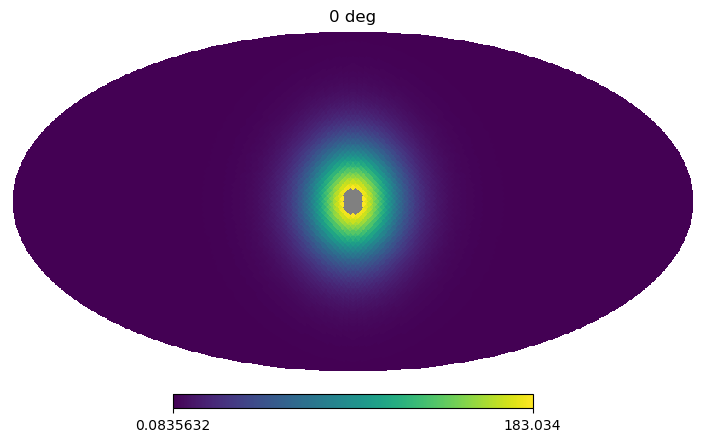

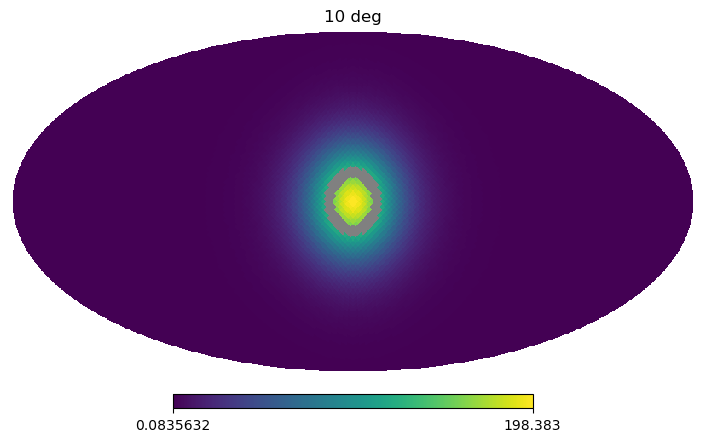

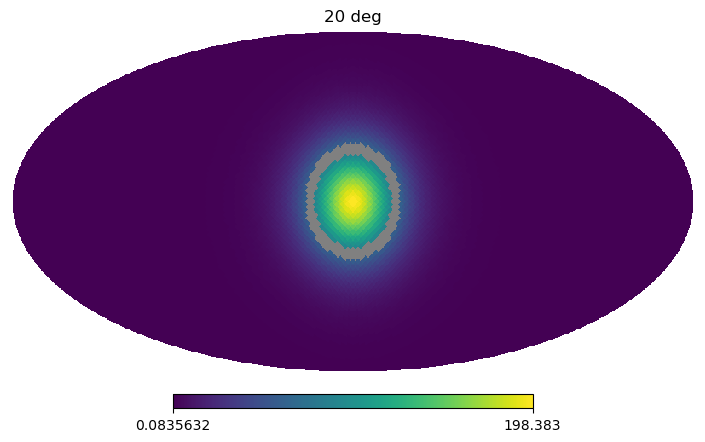

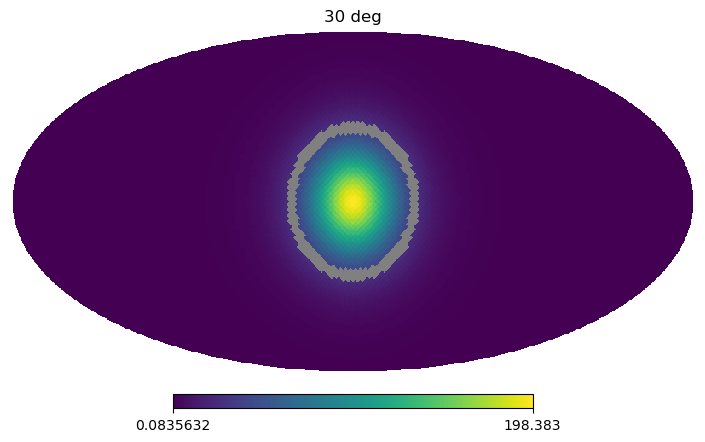

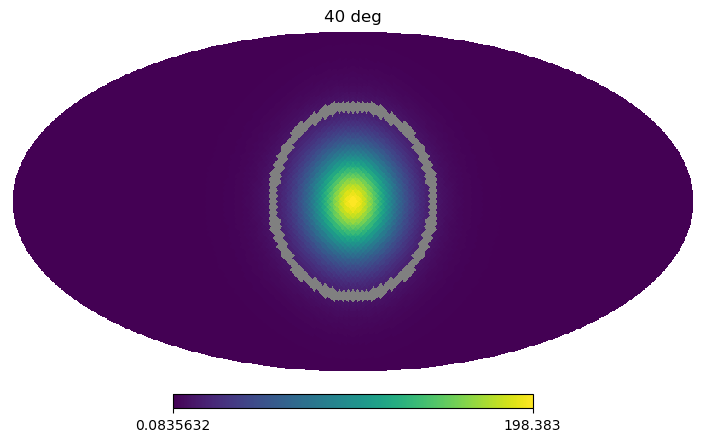

...

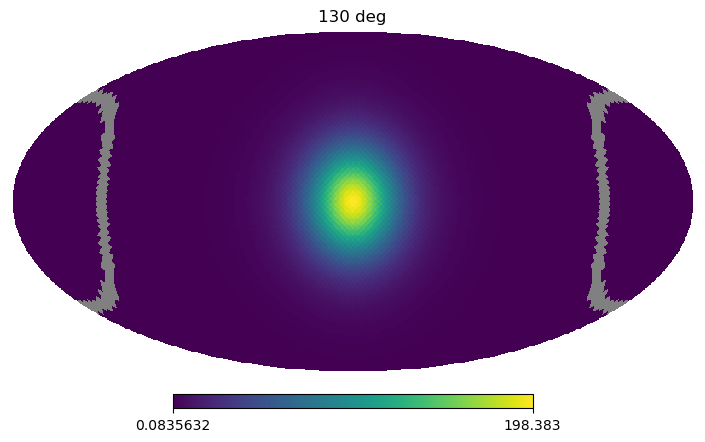

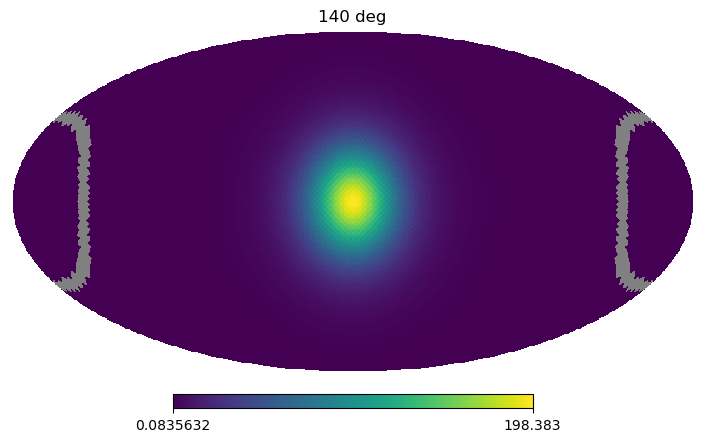

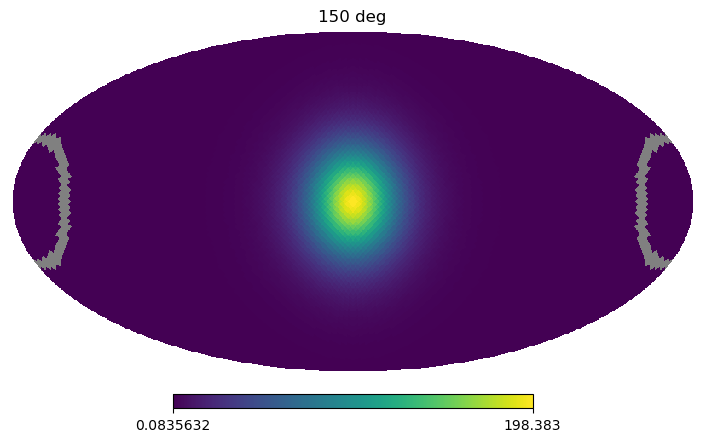

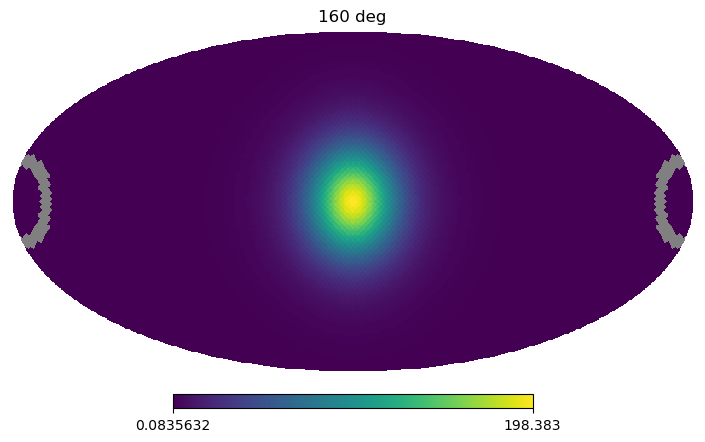

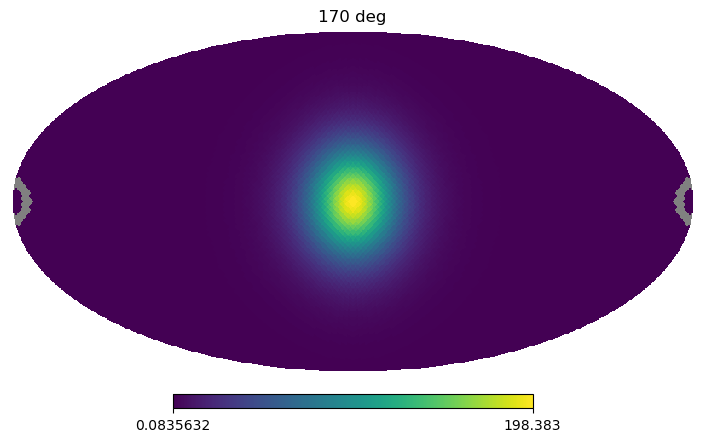

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [7]:
N = 2**5
vec = hp.ang2vec(np.pi/2, 0)
angular_flux = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 5)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    angular_flux[i] = np.average(F_tot_galex[pix_ring]).value
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = F_tot_galex.value.copy()
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring , 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

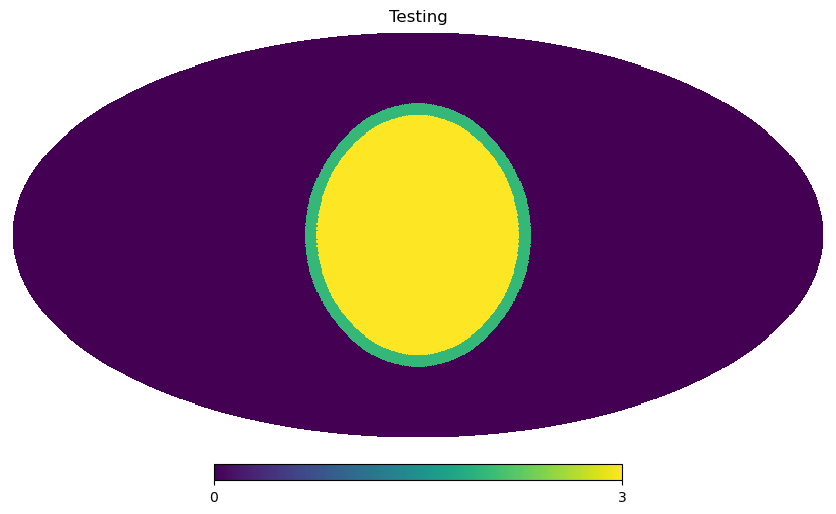

In [10]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)

dir1 = [np.pi/2, 0]
dir2 = [np.pi/4, 0]
dir3 = [3*np.pi/4, 0]
dir4 = [np.pi/2, np.pi/4]

test_array[hp.pixelfunc.ang2pix(N, theta=dir1[0], phi=dir1[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir2[0], phi=dir2[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir3[0], phi=dir3[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir4[0], phi=dir4[1])] = 1


# Set the radius to 5 degrees
dtheta_deg = 5
radius_inner = np.radians(45)
radius_outer = np.radians(45 + dtheta_deg)

# Select the pixels within the disc
pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)
pix_ring = np.setdiff1d(pix_outer, pix_inner)



test_array[pix_outer] = 2
test_array[pix_inner] = 3
test_array[pix_ring] = 2

hp.mollview(test_array , 
            title="Testing", 
            rot=(0,0,0))


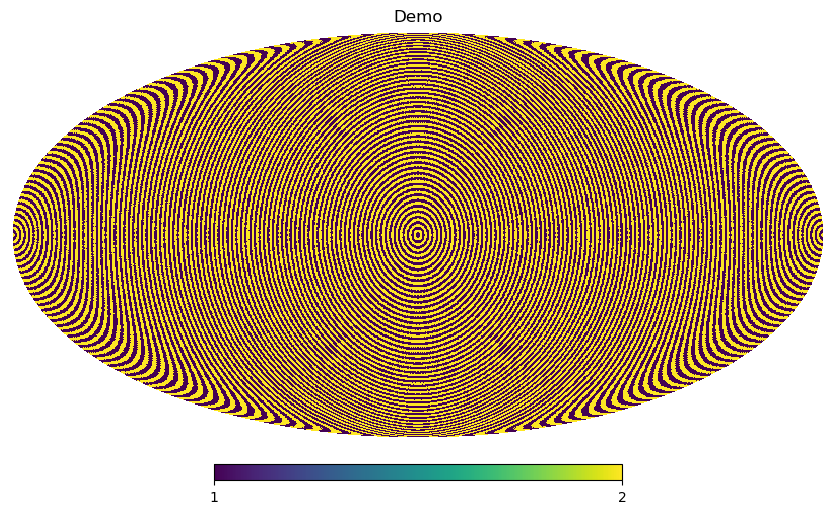

In [11]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# test_array[pix_outer] = 1
# test_array[pix_inner] = 2
# test_array[pix_ring] = 1

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)


for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    test_array[pix_ring] = i % 2 + 1
    
hp.mollview(test_array , 
            title="Demo", 
            rot=(0,0,0))


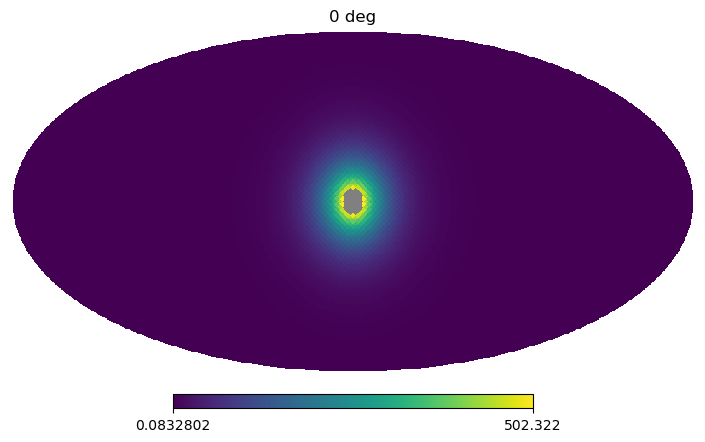

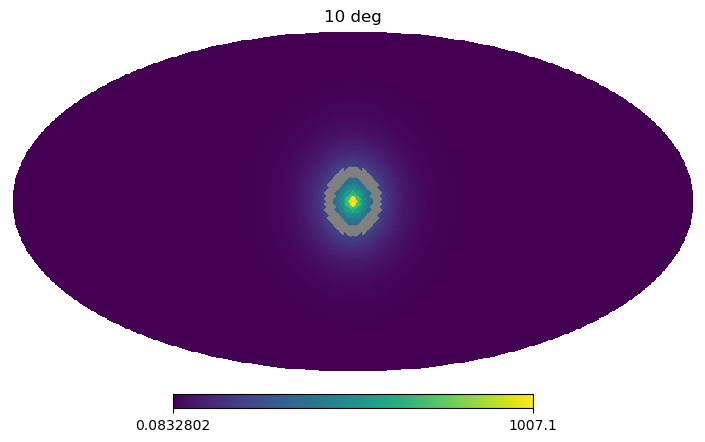

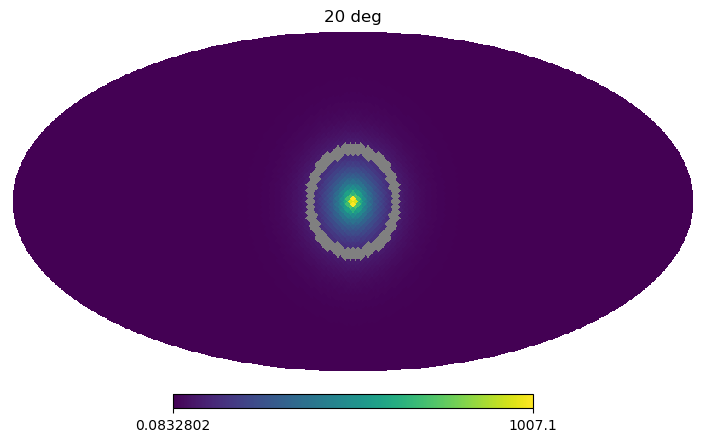

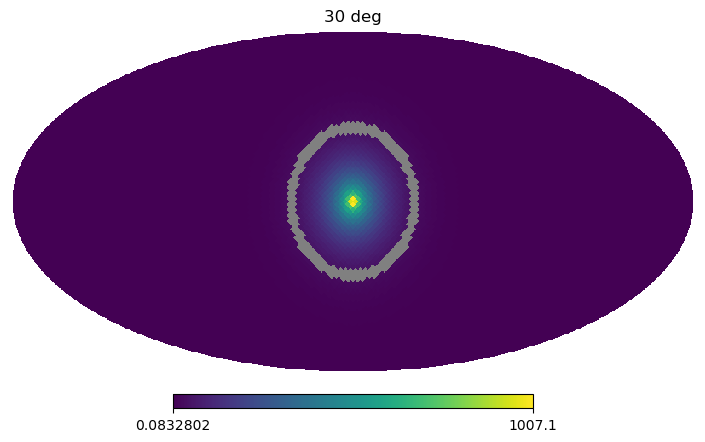

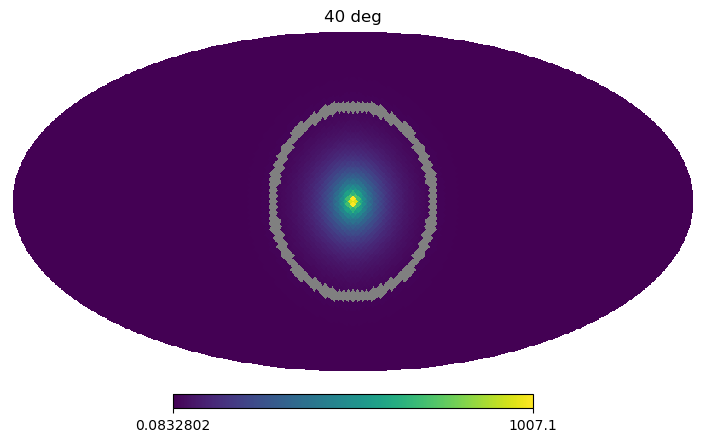

...

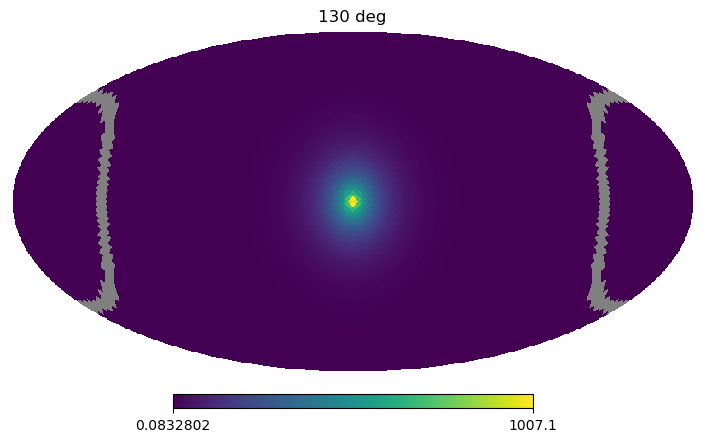

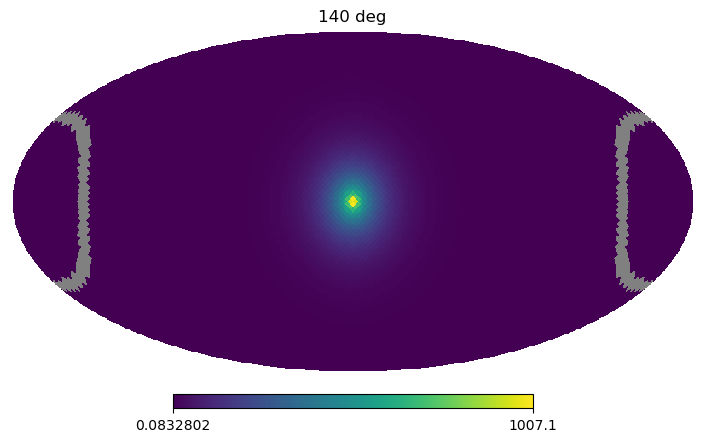

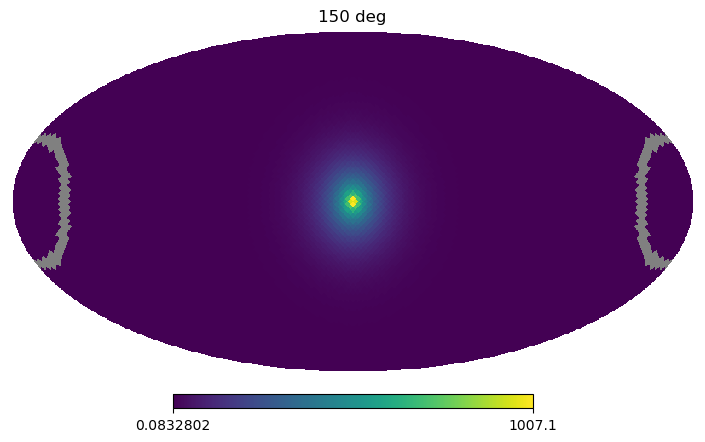

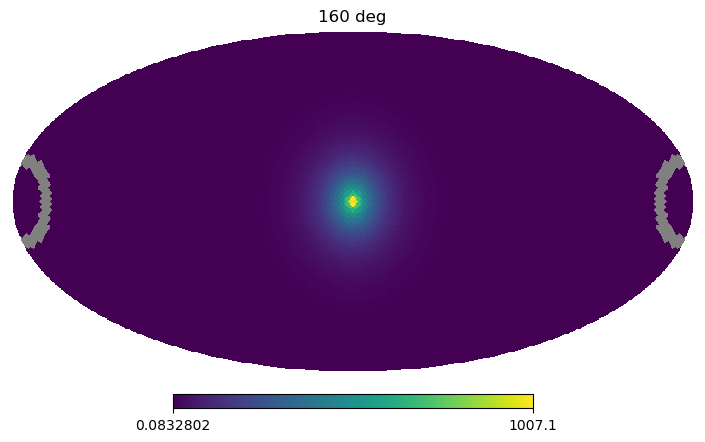

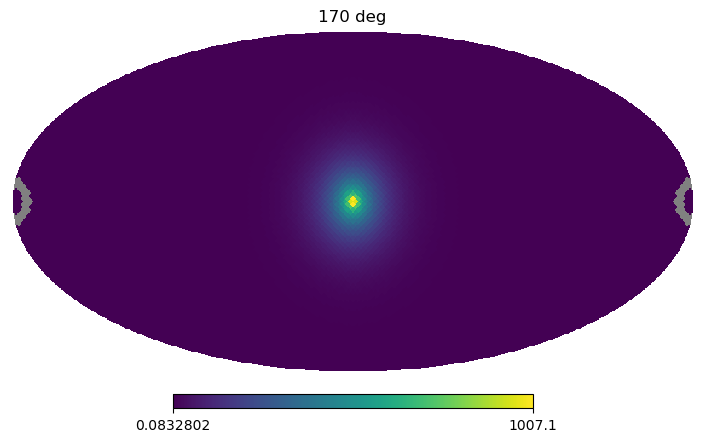

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [12]:
N = 2**5
angular_flux = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 5)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    angular_flux[i] = np.average(F_tot_galex[pix_ring]).value
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = F_tot_galex.value.copy()
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring , 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

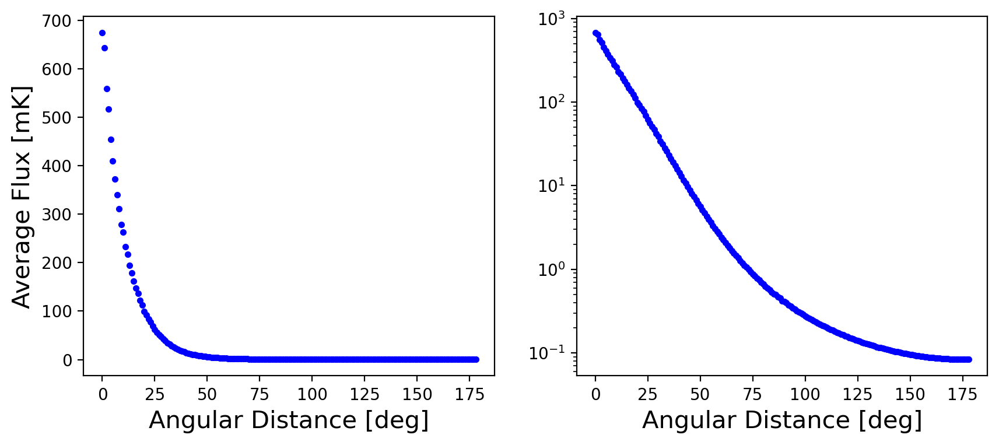

In [14]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# Plot the data on the left subplot
ax1.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]', size=15)

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.show()

Using $\Delta \theta = 5^{\circ}$
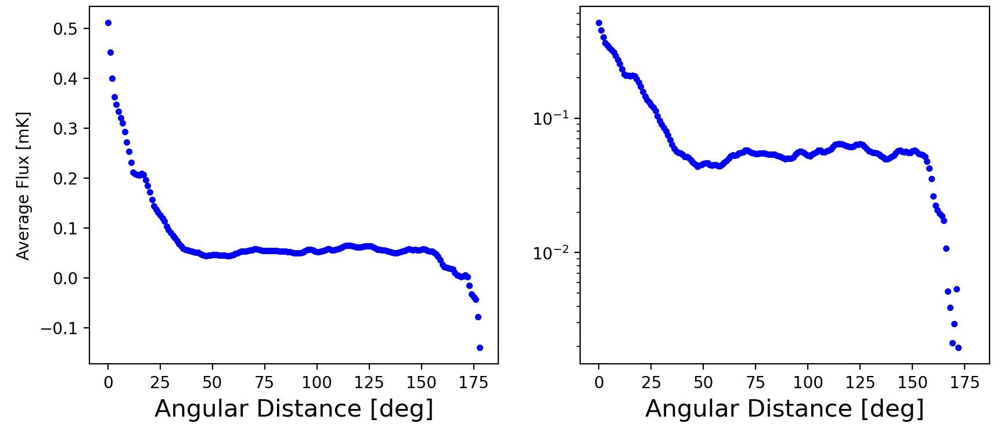

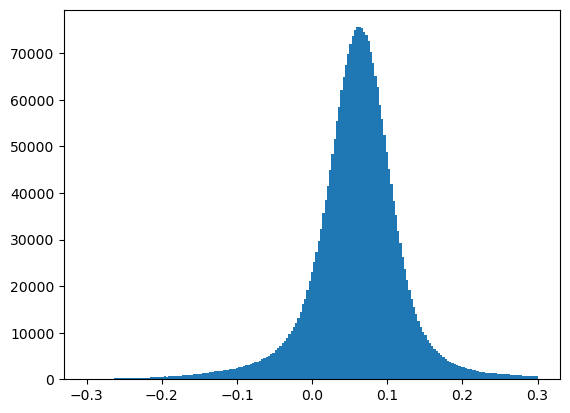

In [267]:
plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
#plt.xlim([-0.5,0.5])
plt.show()

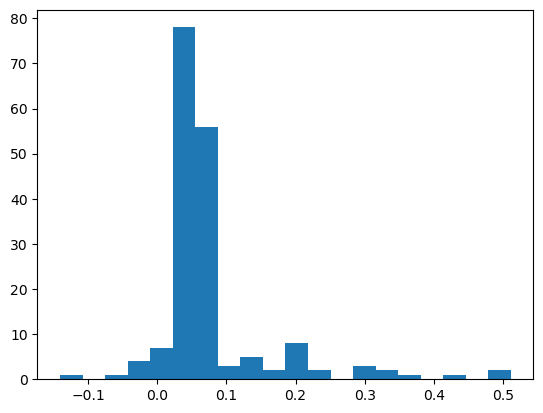

In [271]:
plt.hist(angular_flux_wmap, bins=20)
#plt.xlim([-0.5,0.5])
plt.show()

In [207]:
np.nan

nan

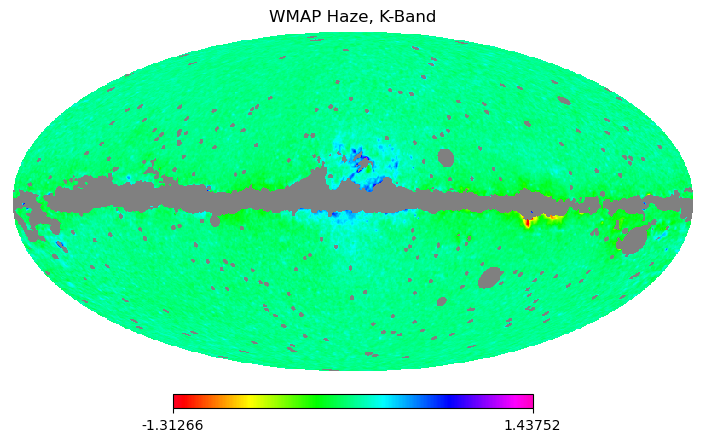

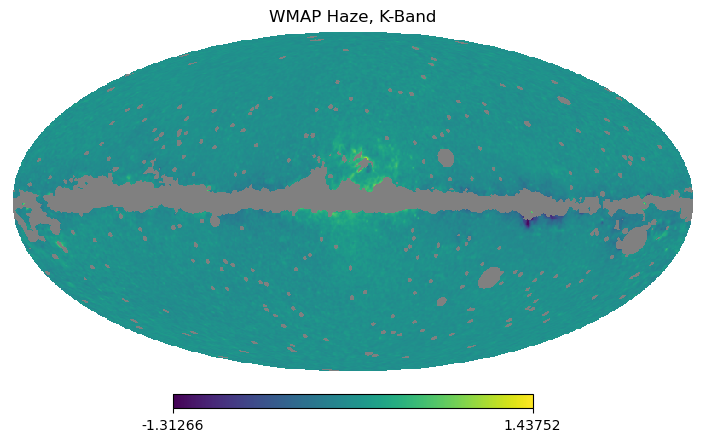

## MCMC Analysis


In [22]:
import corner

In [104]:
inner = np.array([1,11,117,5])
outer = np.array([1,11,117,0,123,5])

np.setdiff1d(outer, inner)

array([  0, 123])

In [99]:
len(pix_inner)

115144

In [68]:
print(hp.rotator.angdist(dir1, dir2),
      hp.rotator.angdist(dir1, dir3),
      hp.rotator.angdist(dir1, dir4))

[0.78539816] [0.78539816] [0.78539816]


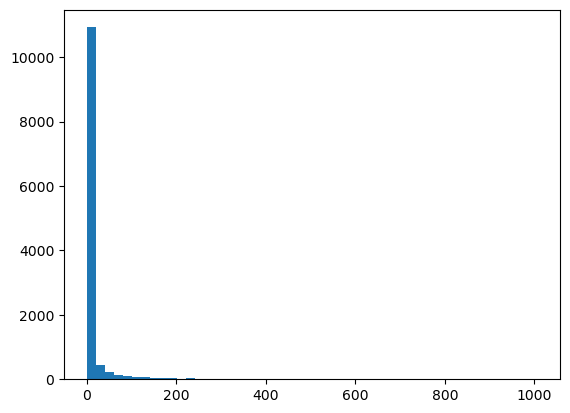

In [26]:
plt.hist(F_tot_galex.value, bins=50)
plt.show()

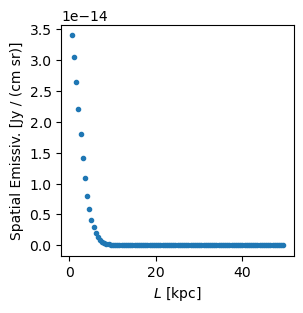

Unit("Jy / (cm sr)")

In [ ]:
spectral_spatial_emissivity
# integrate along the bandwidth
# calculate spectral spatial emissivity


plt.figure(dpi=100,figsize=(3,3))
plt.plot(l_list,spectral_spatial_emissivity[:,500], ".")
plt.xlabel("$L$ [kpc]")
plt.ylabel("Spatial Emissiv. ["+str(spectral_spatial_emissivity.unit)+"]")
plt.show()
spectral_spatial_emissivity.unit

In [56]:
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz
frequency_band

<Quantity [2.025e+10, 2.125e+10, 2.225e+10, 2.325e+10, 2.425e+10,
           2.525e+10] Hz>

In [54]:
f_min_hz

<Quantity 2.025e+10 Hz>

In [55]:
f_max_hz

<Quantity 2.575e+10 Hz>

In [50]:
# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]
len(l_list)

frequency_band.to(u.GHz)

<Quantity [20.25] GHz>

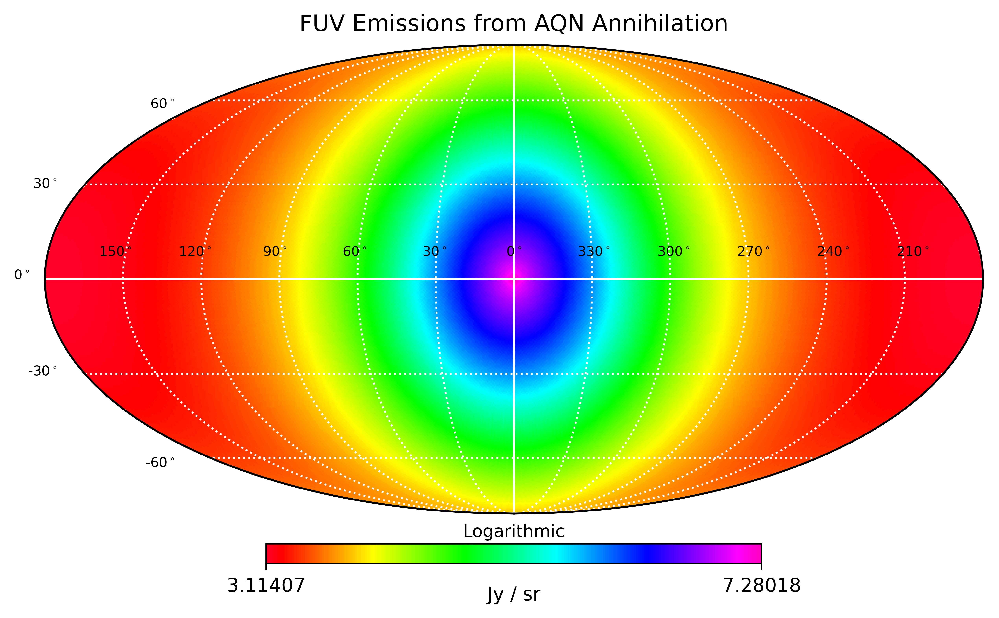

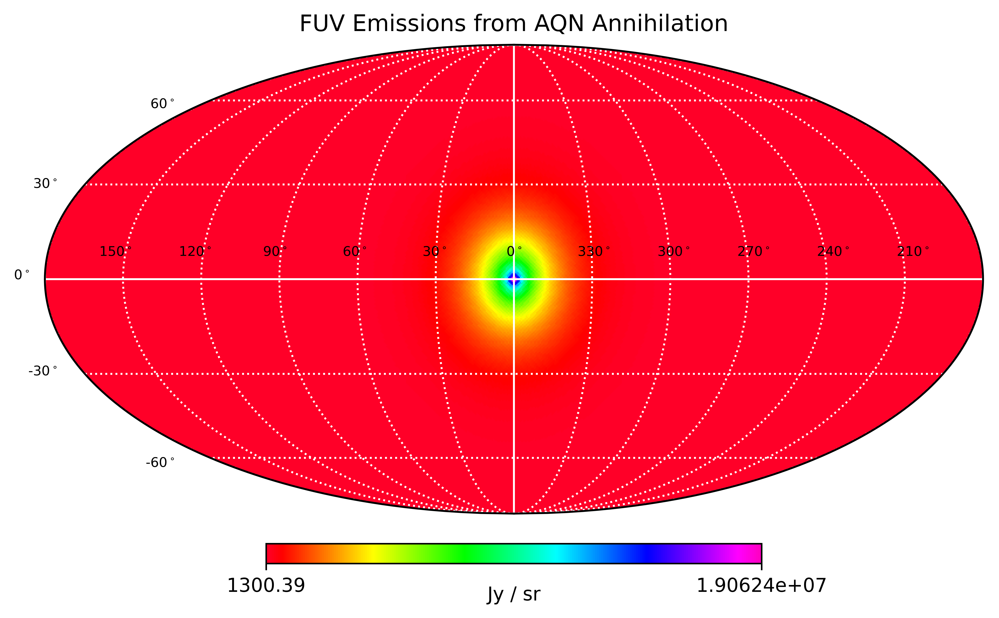

In [81]:
create_skymap2(F_tot_galex, F_tot_galex.unit, False)

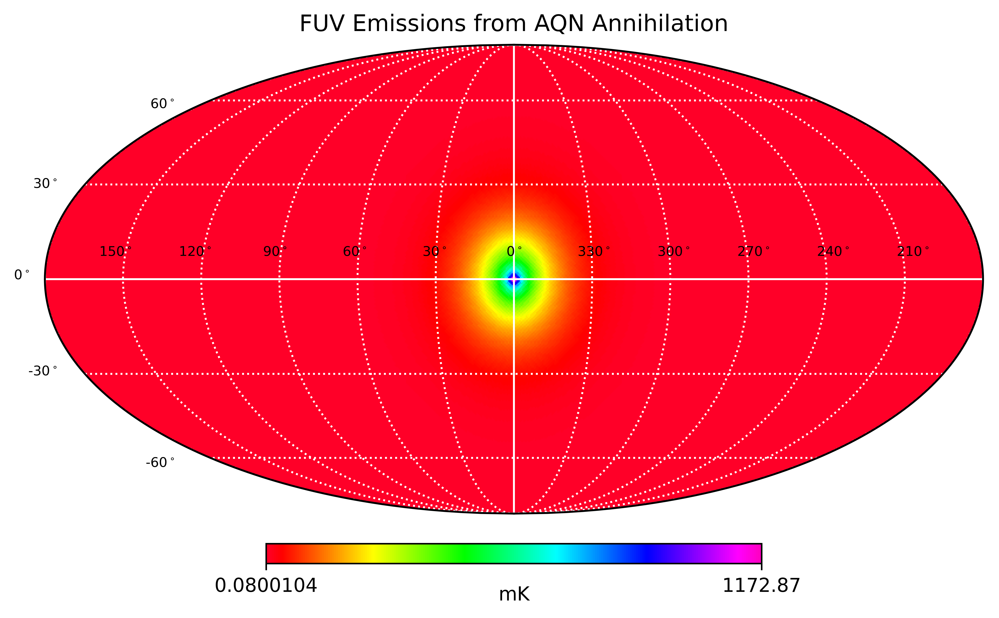

In [85]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), False)

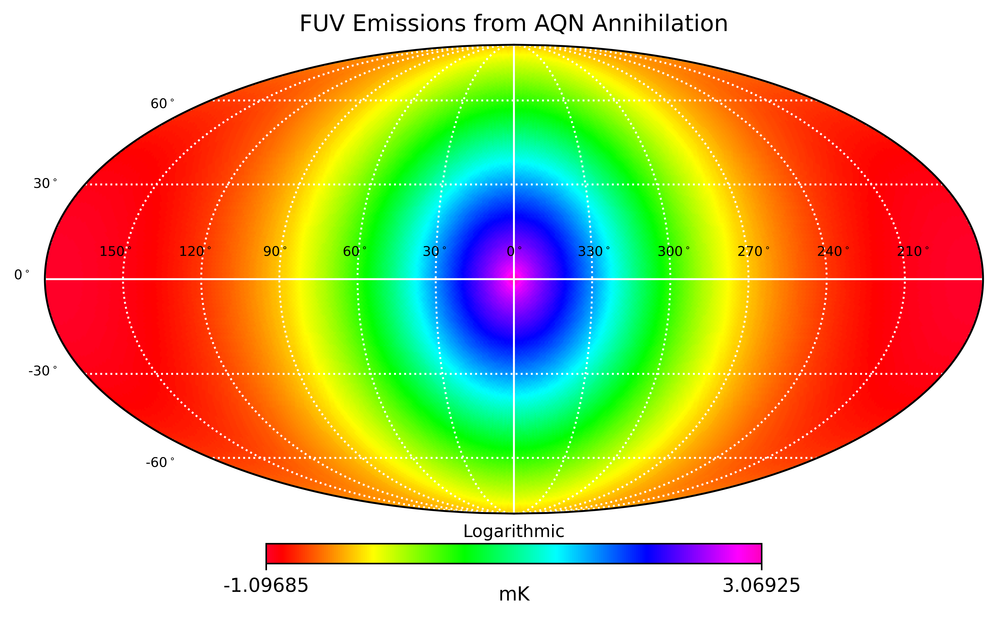

In [84]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), True)

In [146]:
l_array[5]

array([3.1, 3.1, 3.1, ..., 3.1, 3.1, 3.1])

## Look at $T_{\text{AQN}}$ from a gas component at a particular distance from earth



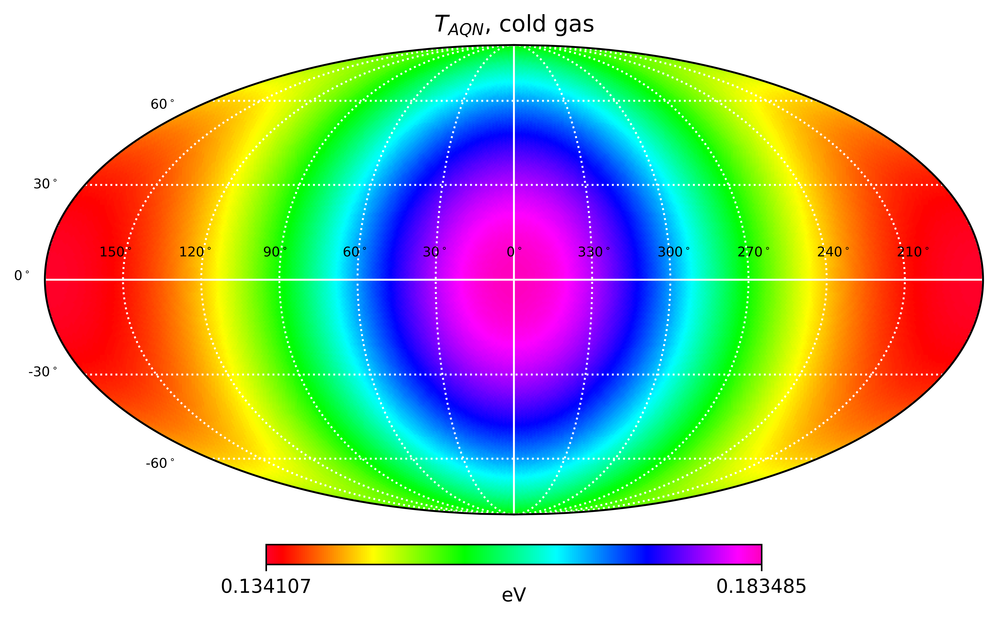

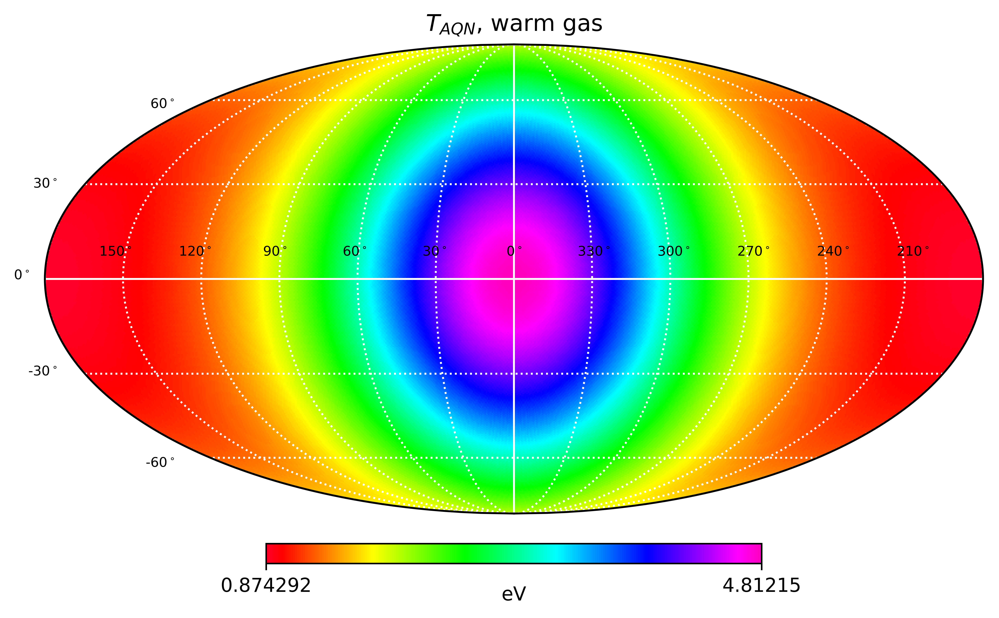

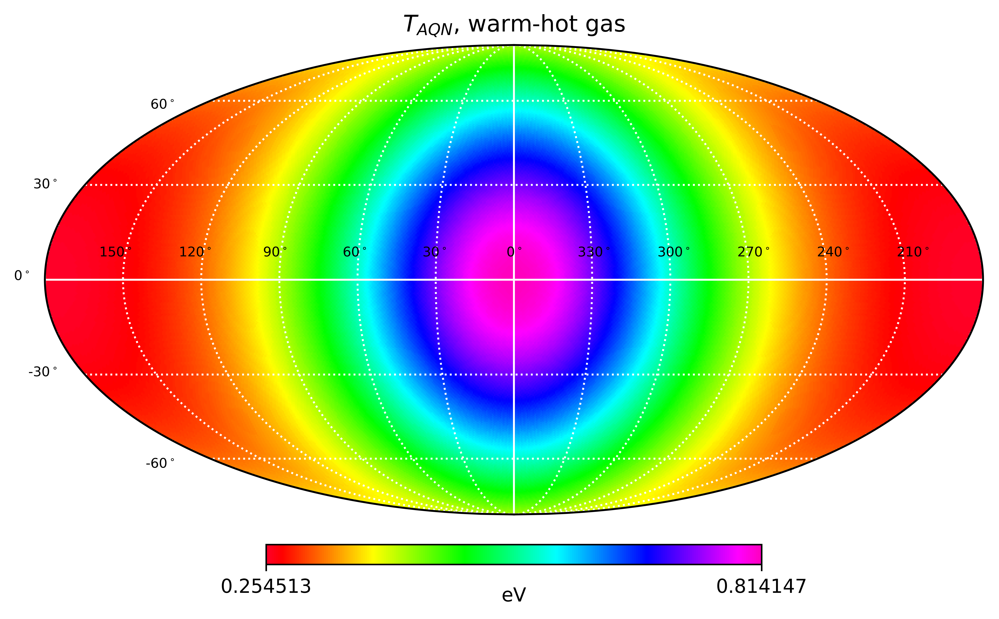

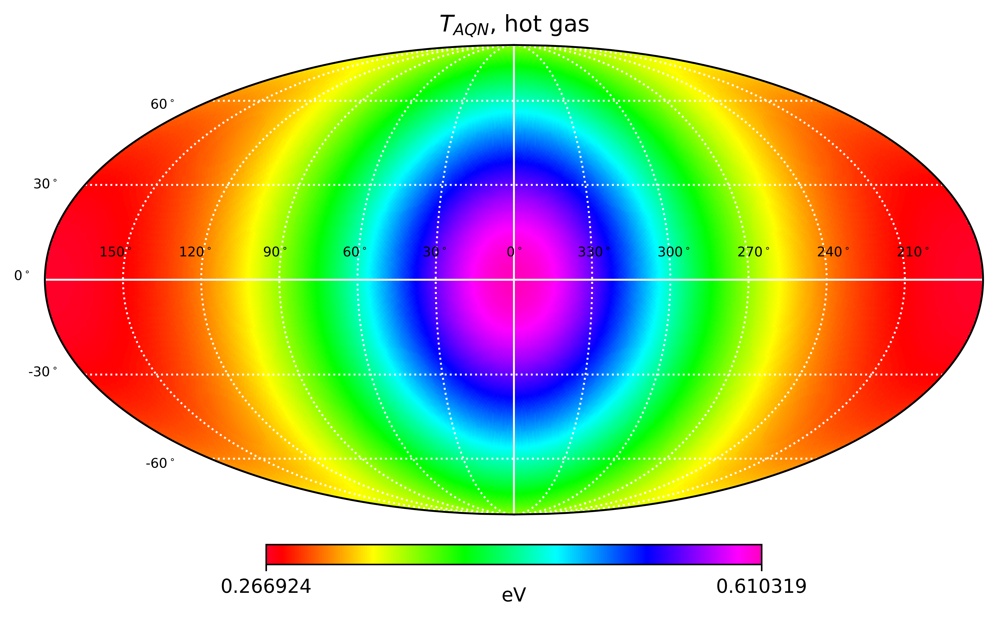

In [42]:
l_array_index = 5
create_skymap_T_aqn(T_aqn_dict_ev["cold"    ][l_array_index,:], "cold gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm"    ][l_array_index,:], "warm gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm_hot"][l_array_index,:], "warm-hot gas")
create_skymap_T_aqn(T_aqn_dict_ev["hot"     ][l_array_index,:], "hot gas"     )

In [80]:
np.where(theta<=0.05)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),)

In [83]:
NSIDE

64

In [88]:
hp.pixelfunc.ang2pix(NSIDE, theta=1, phi=0)

11392

In [91]:
npix = hp.nside2npix(2**3)

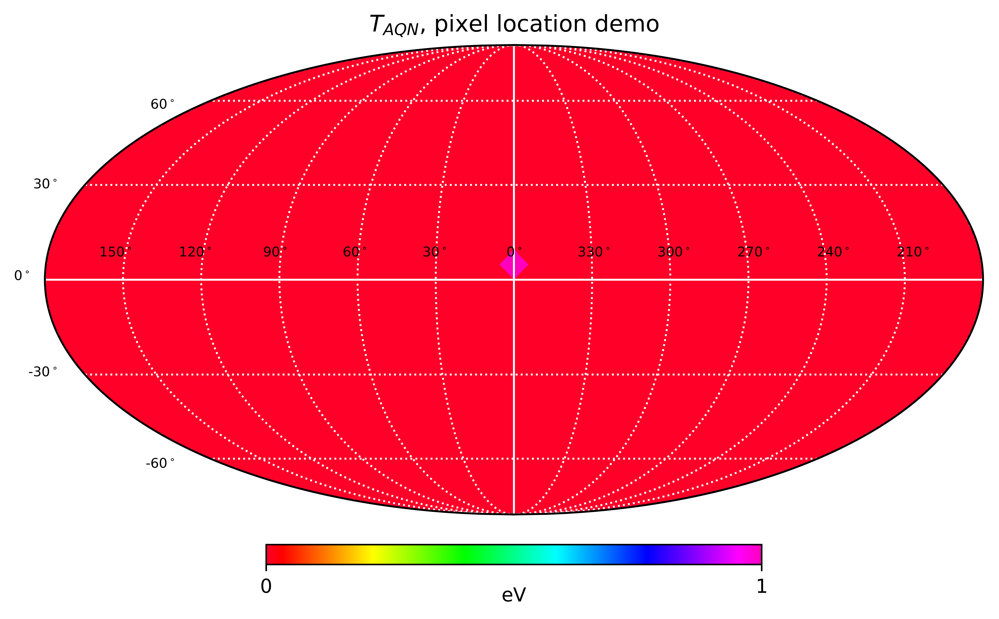

In [125]:
test_array = np.zeros(npix)
test_array[hp.pixelfunc.ang2pix(2**3, theta=np.pi/2, phi=0)] = 1

create_skymap_T_aqn(test_array*u.cm, "pixel location demo")

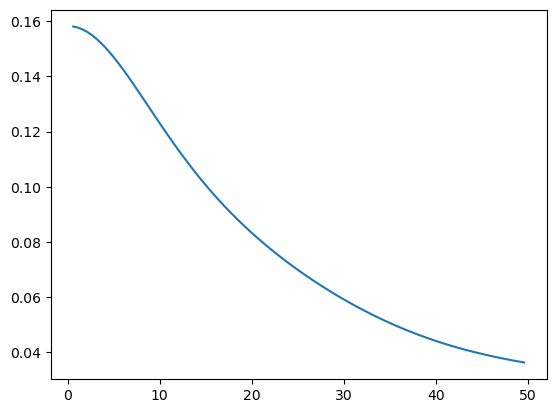

In [117]:
pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=0, phi=0)
plt.plot(l_array[:,pixel_index],T_aqn_dict_ev["cold"][:,pixel_index])

In [153]:
def plot_temperature_vs_l(T_dict, chosen_theta, chosen_phi):

    pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=chosen_theta, phi=chosen_phi)

    npix = hp.nside2npix(2**3)
    test_array = np.zeros(npix)
    test_array[hp.pixelfunc.ang2pix(2**3, theta=chosen_theta, phi=chosen_phi)] = 1
    #create_skymap_T_aqn(test_array*u.cm, "pixel location demo")
    hp.mollview(test_array)
    plt.show()


    # Create a 2x2 grid of subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(5, 5), dpi=200)

    # Define the titles for each subplot
    titles = ['cold', 'warm', 'warm_hot', 'hot']

    # Loop through each subplot and add a plot with the given title
    for i, ax in enumerate(axes.flat):
        ax.plot(l_array[:,pixel_index], T_dict[titles[i]][:,pixel_index])
        ax.set_title(titles[i]+" gas")
        #ax.set_xlabel('Distance (earth centric) [kpc]')
        #ax.set_ylabel('$T_{AQN}$ (eV)')
    axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
    axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
    # Adjust the layout and padding of the subplots
    fig.tight_layout(pad=3.0)

    fig.suptitle(r'$\theta = $'+str(round(chosen_theta,4))+', $\phi = $'+str(round(chosen_phi,4)), fontsize=18)

    # Display the figure
    plt.show()

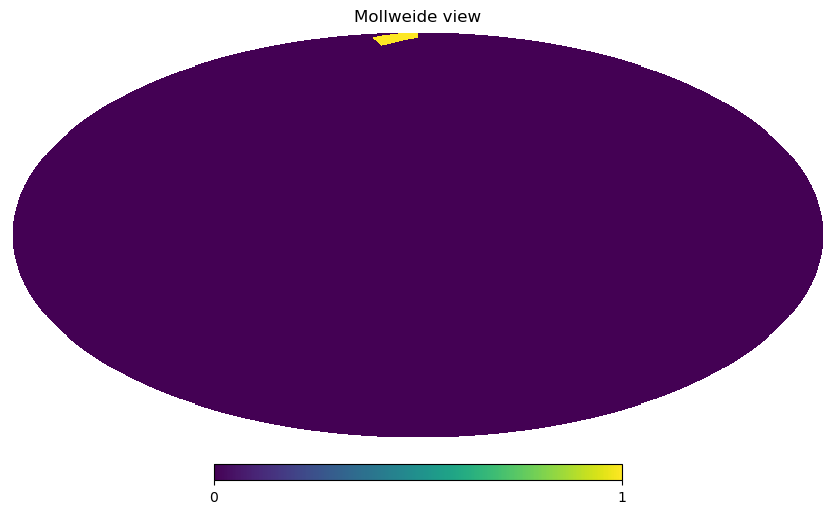

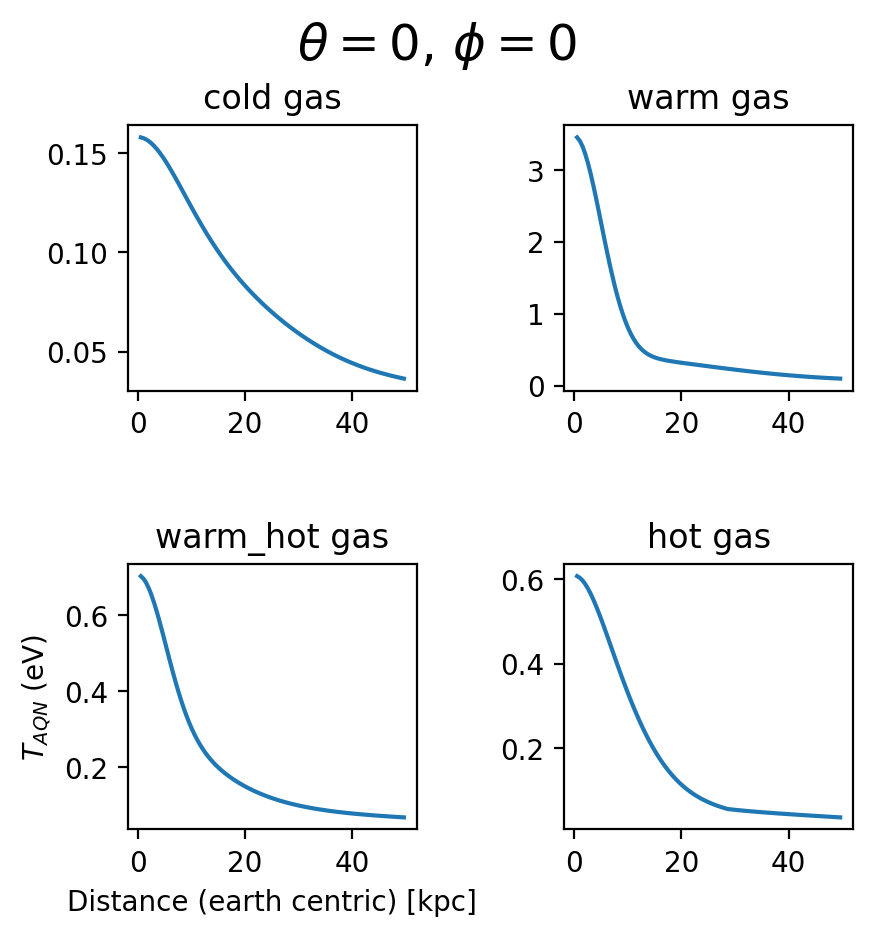

In [154]:
chosen_theta = 0
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



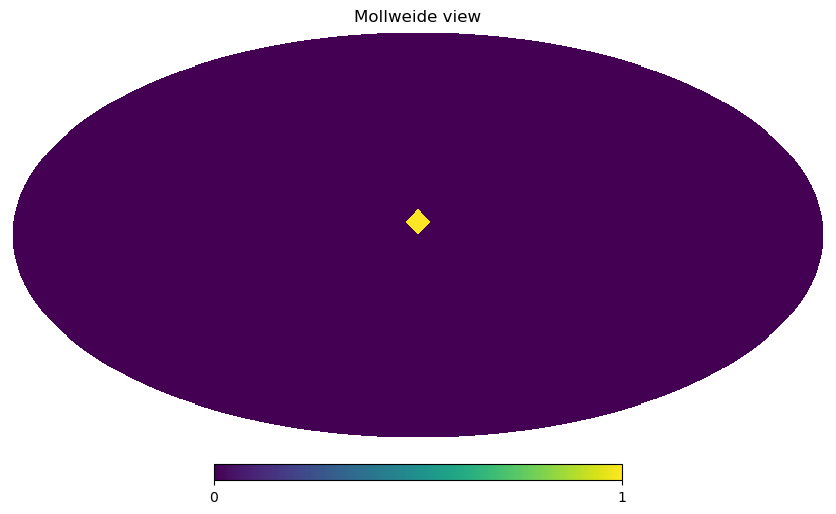

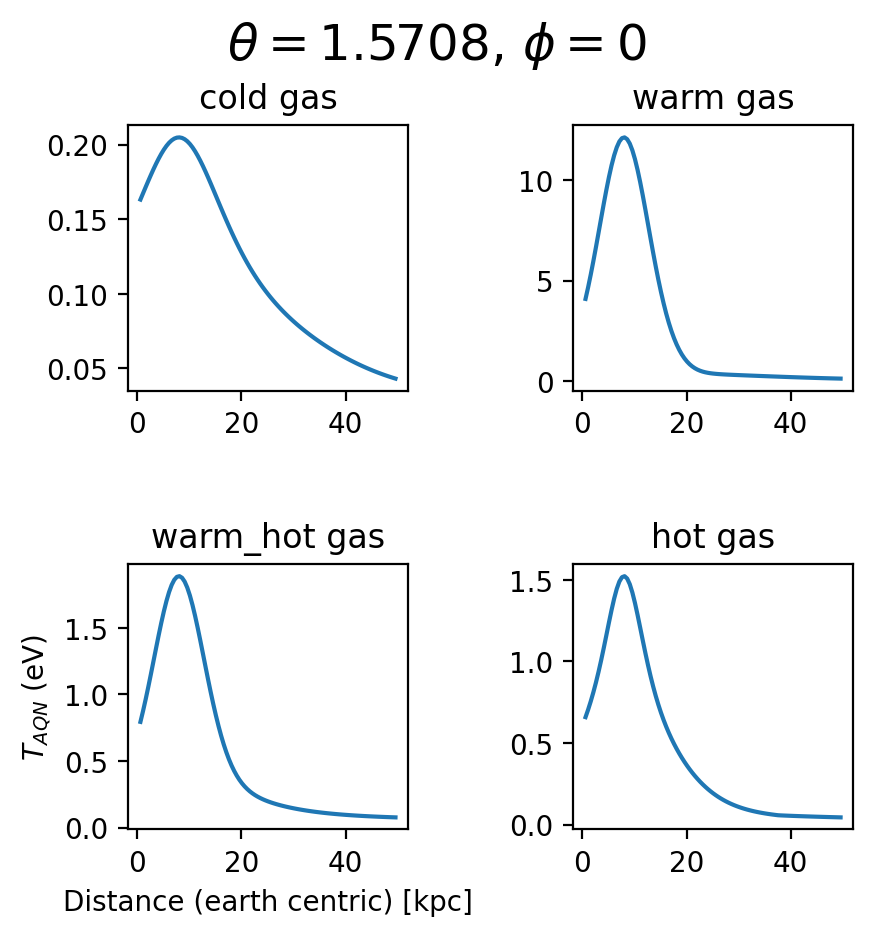

In [155]:
chosen_theta = np.pi/2
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



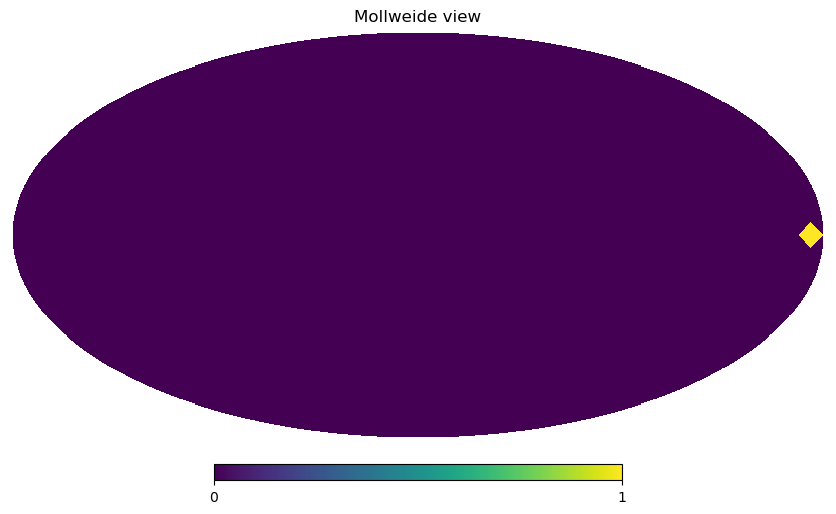

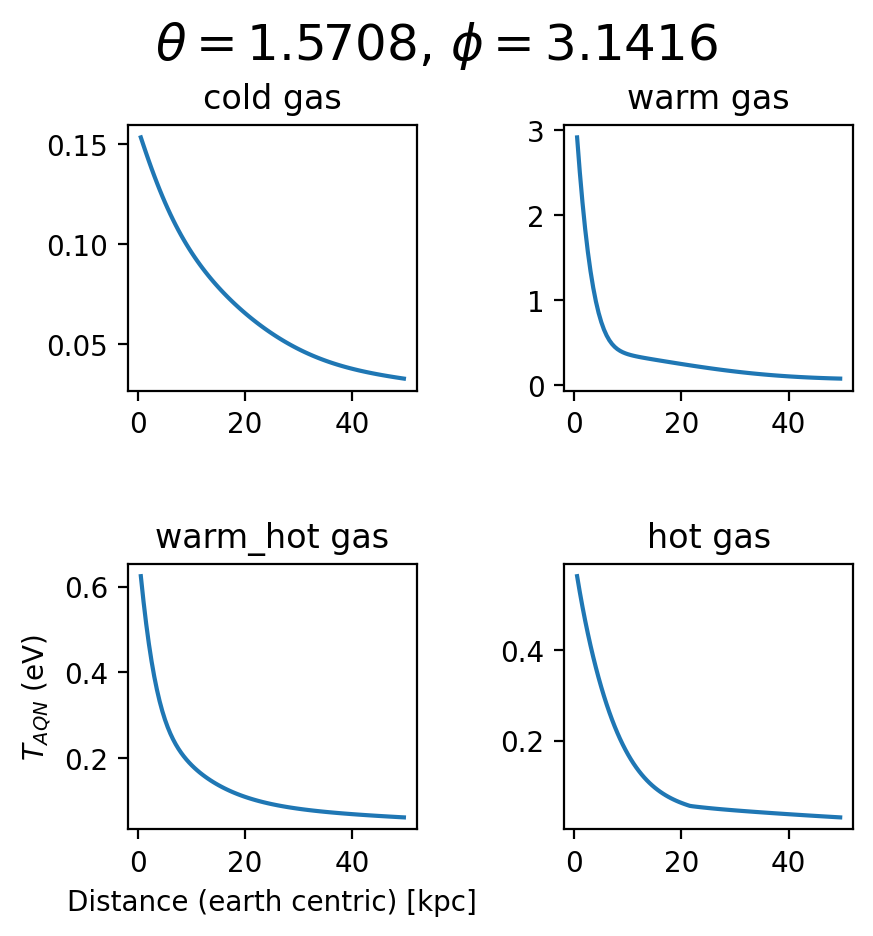

In [156]:
chosen_theta = np.pi/2
chosen_phi   = np.pi

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



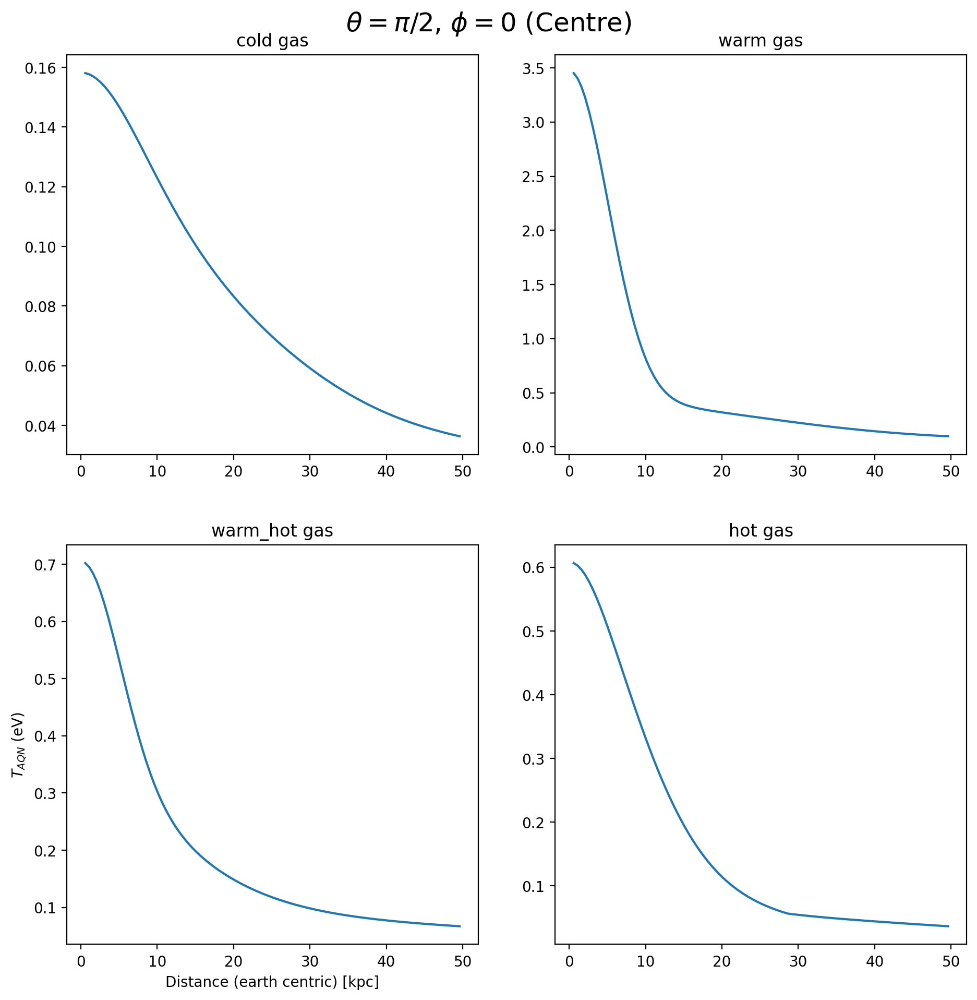

In [127]:
chosen_theta = np.pi
chosen_phi   = 0

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=200)

# Define the titles for each subplot
titles = ['cold', 'warm', 'warm_hot', 'hot']

# Loop through each subplot and add a plot with the given title
for i, ax in enumerate(axes.flat):
    ax.plot(l_array[:,pixel_index], T_aqn_dict_ev[titles[i]][:,pixel_index])
    ax.set_title(titles[i]+" gas")
    #ax.set_xlabel('Distance (earth centric) [kpc]')
    #ax.set_ylabel('$T_{AQN}$ (eV)')
axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
# Adjust the layout and padding of the subplots
fig.tight_layout(pad=3.0)

fig.suptitle(r'$\theta = \pi/2$, $\phi = 0$ (Centre)', fontsize=18)

# Display the figure
plt.show()


In [115]:
len(l_array)

99

In [102]:
def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    #dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN


warm_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
warm_hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)

<Quantity [10081.15962289,  9506.08046891,  9506.08046891, ...,
            9506.08046891,  9506.08046891, 10081.15962289] cm>

In [ ]:
# pick line of sight away from galactic centre, directly north
# look at T_AQN along this line of sight